# Анализ данных датасета Мегафона

28.03.2023


Задание предусматривает исследование датасетов с клиентами и их трафиком компании "Мегафон" для нахождения интересных особенностей и закономерностей и выделении 10 наиболее перспектиных городов с точки зрения развития туристической отрасли.

Есть данные, хранящиеся в файлах `Tourists_CITY_2022.csv` с данными об абонентах счетах из внутренних источников компании за период с *01.01.2021* по *01.12.2022*.

# Описание задания

* `Snap_date` - дата начала месяца туризма
* `Id_hash` - id абонента. Один абонент может встречаться несколько раз в разных месяцах или городах
* `days` - продолжительность присутствия в днях в точке туризма 
* `home_region` - номер домашнего региона 
* `city` - точка туризма 
* `gender` - предсказанный моделью пол абонента. 
> * 1 – мужчина;
> * 2 – женщина;
> * 3 – неизвестно;
* `age` - предсказанный моделью возраст абонента в годах 
* `mou` - голосовой трафик абонента за месяц (snap_date) в минутах 
* `mou_out` - исходящий голосовой трафик абонента за месяц в минутах 
* `dou` - интернет-трафик абонента за месяц, МБ
* `Interests` - список интересов абонента за месяц snap_date 
* `top_service` - url, по которому у абонента больше всего трафика за месяц 
* `volume_sum` - трафик абонента за время присутствия в точке туризма, МБ
* `dl/ul_volume_sum` - разложение volume_sum на uplink, downlink, МБ
* `Column_1` - служебное поле, не информативное

## Импорт библиотек

In [1]:
import pandas as pd
import numpy as np
from scipy import stats as st
import math as mth
import calendar

import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

import datetime as dt
from datetime import datetime, timedelta

from pandas_profiling import ProfileReport

## Чтение файлов

In [2]:
path_local_21 = '/kaggle/input/spgu-olimp/Олимпиада для первых_2023 материалы/Кейс, критерии и данные для кейса/Данные_2021/'
csv_files_21 = ['Tourists_Абинск_2021.csv', 'Tourists_Александров_2021.csv', 'Tourists_Армавир_2021.csv',
             'Tourists_Байкальск_2021.csv', 'Tourists_Белореченск_2021.csv', 'Tourists_Вязники_2021.csv', 
             'Tourists_Горно-Алтайск_2021.csv', 'Tourists_Городищи_2021.csv', 'Tourists_Гороховец_2021.csv',
             'Tourists_Горячий Ключ_2021.csv', 'Tourists_Гулькевичи_2021.csv', 'Tourists_Ейск_2021.csv', 
             'Tourists_Ковров_2021.csv', 'Tourists_Кольчугино_2021.csv', 'Tourists_Кореновск_2021.csv', 
             'Tourists_Кропоткин_2021.csv', 'Tourists_Крымск_2021.csv', 'Tourists_Курганинск_2021.csv',
             'Tourists_Лабинск_2021.csv', 'Tourists_Лакинск_2021.csv', 'Tourists_Меленки_2021.csv', 
             'Tourists_Муром_2021.csv', 'Tourists_Новокубанск_2021.csv', 'Tourists_Петушки_2021.csv',
             'Tourists_Покров_2021.csv', 'Tourists_Сириус_2021.csv', 'Tourists_Славянск-на-Кубани_2021.csv', 
             'Tourists_Сортавала_2021.csv', 'Tourists_Струнино_2021.csv', 'Tourists_Темрюк_2021.csv', 
             'Tourists_Тимашевск_2021.csv', 'Tourists_Тихорецк_2021.csv', 'Tourists_Туапсе_2021.csv', 
             'Tourists_Усть-Лабинск_2021.csv', 'Tourists_Хадыженск_2021.csv', 'Tourists_Юрьев-Польский_2021.csv']

df_2021 = pd.read_csv(path_local_21 + 'Tourists_Абинск_2021.csv')
for file in csv_files_21:
    if file != 'Tourists_Абинск_2021.csv':
        df = pd.read_csv(f'{path_local_21}{file}')
        df_2021 = pd.concat([df_2021, df], ignore_index=True)
        
df_2021 = df_2021.drop(columns=['Unnamed: 0'])     
        
    
path_local_22 = '/kaggle/input/spgu-olimp/Олимпиада для первых_2023 материалы/Кейс, критерии и данные для кейса/Данные_2022/'
csv_files_22 = ['Tourists_Абинск_2022.csv', 'Tourists_Александров_2022.csv', 'Tourists_Армавир_2022.csv',
             'Tourists_Байкальск_2022.csv', 'Tourists_Белореченск_2022.csv', 'Tourists_Вязники_2022.csv',
             'Tourists_Горно-Алтайск_2022.csv', 'Tourists_Городищи_2022.csv', 'Tourists_Гороховец_2022.csv',
             'Tourists_Горячий Ключ_2022.csv', 'Tourists_Гулькевичи_2022.csv', 'Tourists_Ейск_2022.csv',
             'Tourists_Ковров_2022.csv', 'Tourists_Кольчугино_2022.csv', 'Tourists_Кореновск_2022.csv',
             'Tourists_Кропоткин_2022.csv', 'Tourists_Крымск_2022.csv', 'Tourists_Курганинск_2022.csv',
             'Tourists_Лабинск_2022.csv', 'Tourists_Лакинск_2022.csv', 'Tourists_Меленки_2022.csv',
             'Tourists_Муром_2022.csv', 'Tourists_Новокубанск_2022.csv', 'Tourists_Петушки_2022.csv',
             'Tourists_Покров_2022.csv', 'Tourists_Сириус_2022.csv', 'Tourists_Славянск-на-Кубани_2022.csv',
             'Tourists_Сортавала_2022.csv', 'Tourists_Струнино_2022.csv', 'Tourists_Темрюк_2022.csv',
             'Tourists_Тимашевск_2022.csv', 'Tourists_Тихорецк_2022.csv', 'Tourists_Туапсе_2022.csv',
             'Tourists_Усть-Лабинск_2022.csv', 'Tourists_Хадыженск_2022.csv', 'Tourists_Юрьев-Польский_2022.csv']

df_2022 = pd.read_csv(path_local_22 + 'Tourists_Абинск_2022.csv')
for file in csv_files_22:
    if file != 'Tourists_Абинск_2022.csv':
        df = pd.read_csv(f'{path_local_22}{file}')
        df_2022 = pd.concat([df_2022, df], ignore_index=True)
        
df_2022 = df_2022.drop(columns=['Unnamed: 0'])     


df_2021['snap_date_datetime'] = pd.to_datetime(df_2021['snap_date'])
df_2022['snap_date_datetime'] = pd.to_datetime(df_2022['snap_date'])

### 2021 год

In [3]:
df_2021.head(3)

,snap_date,id_hash,days,home_region,tourists_region,city,gender,age,mou,mou_out,dou,snap_date_datetime
0,2021.07.01,61fc25d86364a6a5d6e85319bcf7aef5,3,77,23,Абинск,1,47,33.5125,NaN,8.053427,2021-07-01
1,2021.07.01,c42fc8d3ad95a2e006567967814463a3,15,61,23,Абинск,2,28,1738.2576,1029.3150,46874.117000,2021-07-01
2,2021.07.01,ce99dc79821948d73c0d2ab2d9eee25d,5,34,23,Абинск,1,36,326.6550,173.5125,31097.098000,2021-07-01


In [4]:
profile_df_2021 = ProfileReport(
    df_2021,
    title='df_2021 Profiling Report',
    minimal=True
)

In [5]:
profile_df_2021

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

__591 тыс.__ строк с интернет-трафиком абонента за месяц за 2021 год или __15.2%__ пропущено. Это может быть связано как с технической ошибкой, так и с натуральной природой пропуска, то есть пользователь интернетом не пользовался. То же самое касается полей с голосовым трафиком абонентов, где __11.05%__ и __4.2%__ пропусков – общий голосовй трафик и исходящий, соответственно. 

### 2022 год

In [6]:
df_2022.head(3)

,snap_date,id_hash,days,home_region,tourists_region,city,gender,age,mou,mou_out,dou,interests,top_service,volume_sum,dl_volume_sum,ul_volume_sum,snap_date_datetime
0,2022.08.01,2fa7cd4cb7ab5f67f0c34d4f54b3455b,7,9,23,Абинск,2,51,494.32248,298.84750,7932.8247,"[Контент на тему путешествий, Email-клиенты, П...",[existing],2.779278e+09,2.378326e+09,400952640.0,2022-08-01
1,2022.08.01,699fbcb8aac331a44f42ec53c3bc1771,8,3,23,Абинск,2,31,329.34998,206.41249,2366.3914,"[Активный отдых, Контент на тему путешествий, ...",[unknowntcp],3.199224e+09,2.500532e+09,698692290.0,2022-08-01
2,2022.08.01,fc4061f6a486e1e0f2ceecd2c0551168,12,43,23,Абинск,1,48,334.23250,132.65001,2604.3682,"[Программное обеспечение, Активный отдых, Моби...",[dns],9.823515e+08,9.017218e+08,80629736.0,2022-08-01


In [7]:
profile_df_2022 = ProfileReport(
    df_2022,
    title='df_2022 Profiling Report',
    minimal=True
)

In [8]:
profile_df_2022

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Сразу отметим, что в данных за 2022 год присутствуют дополнительные поля: интересы, самый популярный сайт и 3 характеристики потребления интернет-трафика. 

Касательно пропусков, то тут ситуация следующая: также, как и за 2021 год не хватает __14.44%__, __11.66%__ и __4.68%__ или __551 тыс.__, __445 тыс.__ и __178 тыс.__ по интернет трафику и голосовому трафику. __Для 21.5%__ всех строк за 2022 год нет данных по __интересам пользователей__ и __15%__ по __самому популярному сервису__. И __15-16%__ данных отсутствует __по трафику абонента за время присутствия в точке туризма__ и __разложения volume_sum__ на uplink, downlink. 

* Опять отрицательные значения для "_домашнего региона_". 
* Есть нулевые значения для столбца с возрастом, что означает о провале предсказания возраста абонента.
* Есть абоненты, которые как и в 2021 году, _разговаривали по телефону_ более __25 тыс. минут за месяц__. или аномальные значения `volume_sum`, когда медианный показатель потребления трафика абонента в точке туризма равен __1.1 млрд.__ МБ или 1100 ТБ, что очевидно, не соответствует истине. 

## **Вывод** 
Итого после предварительного просмотра данных у нас имеется:
* **49 543 строки** - всего в датафрейме `data`;
* **1 из 8 столбцов** - имеют пропуски в датафрейме `data`;
* **0.46%** – пропусков в столбце `Ставка тарифа`;
* **356 846 строк** - всего в датафрейме `bills`;
* **1 из 5 столбцов** - имеют пропуски в датафрейме `bills`;
* **585 дубликатов** – в датафрейме `bills`;
* **24.98 у.е.** – средняя сумма платежа;
* **2006-08-30 - 2021-11-01** – временной отрезок таблицы `data`;
* **2018-01-04 - 2021-10-13** – временной отрезок таблицы `bills`;

# Предобработка данных

## Удаление и добавление столбцов

In [9]:
df_2021['month'] = df_2021['snap_date_datetime'].dt.month
df_2021['year'] = df_2021['snap_date_datetime'].dt.year
df_2021['month_name'] = df_2021['snap_date_datetime'].dt.strftime('%B')

df_2022['month'] = df_2022['snap_date_datetime'].dt.month
df_2022['year'] = df_2022['snap_date_datetime'].dt.year
df_2022['month_name'] = df_2022['snap_date_datetime'].dt.strftime('%B')

## Устранение аномалий

### 2021 год

Взглянем на диаграмму с распределением некоторых параметров таблиц.

#### Возраст

<AxesSubplot:xlabel='age', ylabel='Density'>

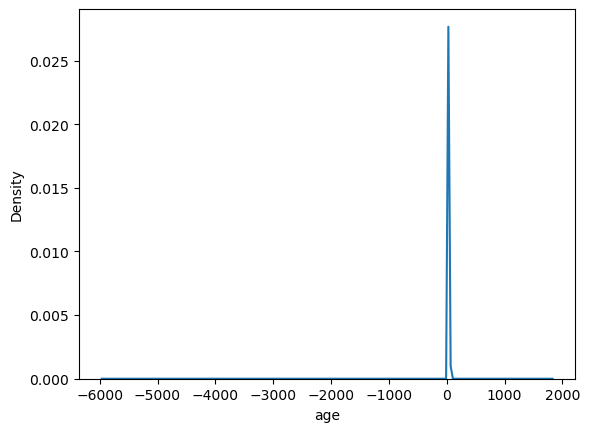

In [10]:
sns.kdeplot(df_2021['age'])

In [11]:
print(df_2021[df_2021['age'] < 0].shape[0])
print(df_2021[df_2021['age'] == 0].shape[0])
print(df_2021[df_2021['age'] > 90].shape[0])
df_2021['age'] = df_2021['age'].apply(lambda x: 0 if x > 99 or x < 0 else x)

3
174350
1985


<AxesSubplot:xlabel='age', ylabel='Density'>

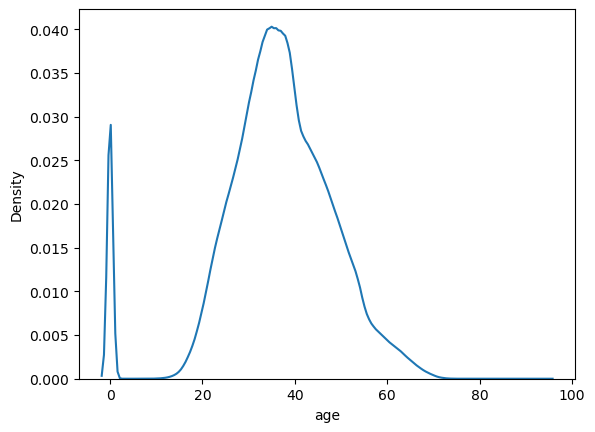

In [12]:
sns.kdeplot(df_2021['age'])

Все же можем предположить, что удалять или отфильтровывать данные по возрастам нет смысла, так как туристом может быть человек любого возраста. 

In [13]:
df_2021[['age']].describe()

,age
count,3.884691e+06
mean,3.607245e+01
std,1.255467e+01
min,0.000000e+00
25%,3.000000e+01
50%,3.600000e+01
75%,4.400000e+01
max,9.400000e+01


In [14]:
def fences(field):
    q1 = df_2021[field].quantile(0.25)
    q3 = df_2021[field].quantile(0.75)
    iqr = q3 - q1
    upper_fence = q3 + 1.5 * iqr
    lower_fence = q1
    
    print(f'Граница максимальных значений {field}:', upper_fence)
    print(f'Граница минимальных значений {field}:', lower_fence)
    return upper_fence, lower_fence

In [15]:
def distr(field, ul=1):
    if ul == 1:
        cities = df_2021.groupby('city').count()
        
        # Группируем исходный датафрейм по городам и считаем количество строк, где значение столбца field меньше границы максимальных значений
        df_filtered = df_2021[df_2021[field] < upper_fence].groupby('city').count()
        
        # Рассчитываем процентное соотношение количества строк с меньшим значением field к общему количеству строк для каждого города
        df_filtered['%'] = df_filtered['id_hash'] / cities['id_hash'] * 100
        
        # Создаем новый датафрейм с результатами
        df_result = pd.DataFrame({
            'city': cities.index,
            'count_less_uf': df_filtered['id_hash'],
            '%': df_filtered['%']
        })
        
        df_result = df_result.reset_index(drop=True)
        df_result = df_result.sort_values(by='%')
        return df_result
    else:
        cities = df_2021.groupby('city').count()
        
        # Группируем исходный датафрейм по городам и считаем количество строк, где значение столбца field меньше границы максимальных значений
        df_filtered = df_2021[df_2021[field] > lower_fence].groupby('city').count()
        
        # Рассчитываем процентное соотношение количества строк с меньшим значением field к общему количеству строк для каждого города
        df_filtered['%'] = df_filtered['id_hash'] / cities['id_hash'] * 100
        
        # Создаем новый датафрейм с результатами
        df_result = pd.DataFrame({
            'city': cities.index,
            'count_more_lf': df_filtered['id_hash'],
            '%': df_filtered['%']
        })
        
        df_result = df_result.reset_index(drop=True)
        df_result = df_result.sort_values(by='%')
        return df_result
        

In [16]:
upper_fence, lower_fence = fences('age')

Граница максимальных значений age: 65.0
Граница минимальных значений age: 30.0


In [17]:
distr('age')

,city,count_less_uf,%
17,Курганинск,37161,96.662678
9,Горячий Ключ,408731,98.064765
18,Лабинск,28160,98.197161
4,Белореченск,54559,98.483727
22,Новокубанск,89572,98.632369
27,Сортавала,26768,98.691148
34,Хадыженск,22558,98.877882
11,Ейск,57238,99.029395
33,Усть-Лабинск,57575,99.164657
16,Крымск,120504,99.172901


In [18]:
distr('age', 2)

,city,count_more_lf,%
12,Ковров,21524,66.024540
6,Горно-Алтайск,34364,67.726995
24,Покров,67516,67.833461
7,Городищи,19347,67.977232
19,Лакинск,68934,68.095069
23,Петушки,57034,68.585928
28,Струнино,25961,68.683528
1,Александров,35828,68.767754
5,Вязники,58706,68.868190
13,Кольчугино,7168,69.734410


Мы можем отфильтровать данные по верхней границе и не потерять чрезмерно большой объем данных. Более зрелые пользователи не представляют большой интерес, так как они менее охотно тратят средства на моб. связь, не так часто путешествуют, предпочитая домашнюю атмосферу, и в целом не являются показательными в плане пользования интернет и голосовыми услугами, так как их привычки кардинально отличаются от привычек более молодого поколения, к тому же с каждом годом кол-во таких абонентов сокращается ввиду ограниченности продолжительности жизни. 

Что же касается нижней границы, то мы не будем фильтровать абонентов до 30, так как они представляют большой интерес для компании в плане платежеспособности и лояльности. 

Проверим, сколько пользователей от общего числа, чей возраст определен не был.

In [19]:
lower_fence = 0

distr('age', 2)

,city,count_more_lf,%
8,Гороховец,95894,92.832388
24,Покров,92663,93.098702
19,Лакинск,94481,93.331160
13,Кольчугино,9614,93.530499
5,Вязники,79844,93.665243
7,Городищи,26712,93.854749
35,Юрьев-Польский,14307,93.865634
12,Ковров,30617,93.917178
20,Меленки,8587,93.929118
3,Байкальск,41226,94.069595


Менее 10% в каждом из городов, можем и отсечь. Но будет ли ситуация за 2022 год похожа? Можем создать отдельный дф для расчетов метрик по возрасту. 

In [20]:
age_prev = df_2021.shape[0]
df_2021 = df_2021[df_2021['age'] < 65]
age_after = df_2021.shape[0]

In [21]:
df_2021_no_age = df_2021[df_2021['age'] > 0]

In [22]:
df_2021_no_age.groupby('city')['age'].agg(['mean', 'median', 'min', 'max']).sort_values(by=['mean', 'median'])

,mean,median,min,max
city,,,,
Петушки,35.745005,35.0,8,64
Покров,35.858958,35.0,8,64
Ковров,36.026631,35.0,9,64
Лакинск,36.036417,36.0,9,64
Горно-Алтайск,36.148546,35.0,7,64
Вязники,36.172171,36.0,8,64
Юрьев-Польский,36.463647,36.0,13,64
Кореновск,36.468129,36.0,5,64
Кольчугино,36.558713,36.0,12,64


#### Количество проведенных дней

In [23]:
days_prev = df_2021.shape[0]

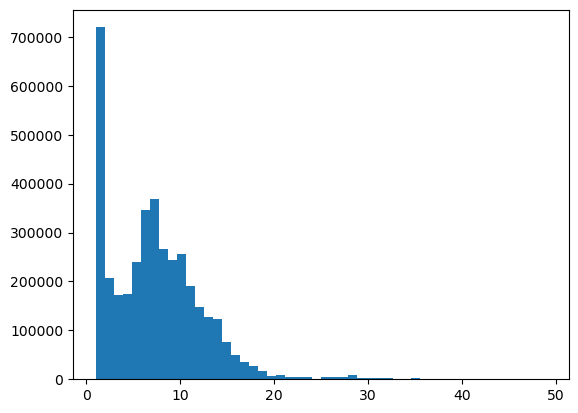

In [24]:
plt.hist(df_2021['days'], bins=50)
plt.show()

С днями все в порядке. Но по условию Ростислава, кол-во проведенных дней должно начинаться от 5. Взглянем, сколько это строк:

2342806


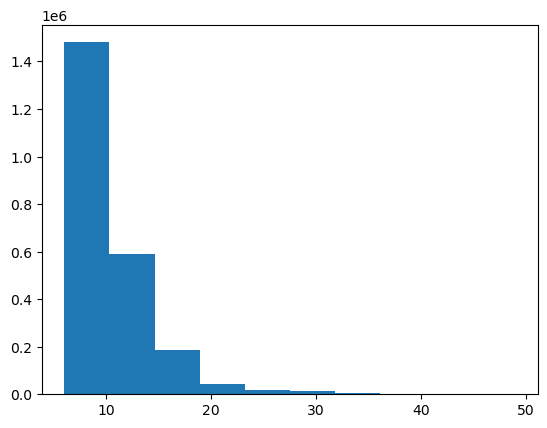

In [25]:
print(df_2021[df_2021['days'] > 5].shape[0])
plt.hist(df_2021[df_2021['days'] > 5]['days'], bins=10)
plt.show()

1274085


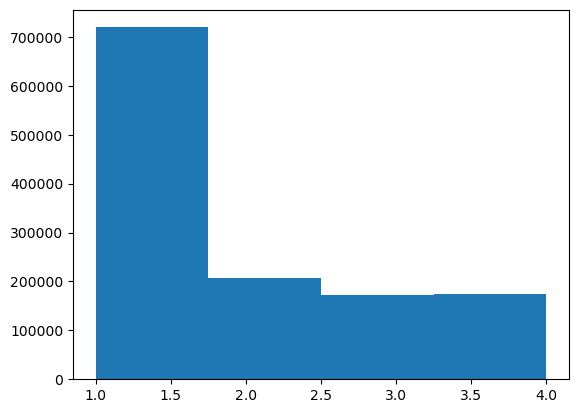

In [26]:
print(df_2021[df_2021['days'] < 5].shape[0])
plt.hist(df_2021[df_2021['days'] < 5]['days'], bins=4)
plt.show()

1.2 млн. строк мы должны удалить или все же оставить их для модели? Сколько в процентном соотношении занимают люди в каждом городе, которые были до 5 дней в точке.

In [27]:
# Группируем данные по городам и количеству дней, проведенных в городе
grouped_data = df_2021.groupby(['city', pd.cut(df_2021['days'], [0, 4, float('inf')])]).size()

# Вычисляем общее количество строк для каждого города
total_rows = grouped_data.groupby('city').sum()

# Строим таблицу, где для каждого города показано количество строк, где турист провел менее 5 дней, в процентном соотношении
result = (grouped_data / total_rows * 100).unstack().fillna(0)

result = result.reset_index()
result.columns = ['City', 'Less than 5 days, %', 'More than 5 days included, %']
result = result.sort_values(by='More than 5 days included, %', ascending=False)
result

,City,"Less than 5 days, %","More than 5 days included, %"
29,Темрюк,18.994186,81.005814
6,Горно-Алтайск,19.022483,80.977517
21,Муром,20.418320,79.581680
26,Славянск-на-Кубани,20.786384,79.213616
3,Байкальск,20.799908,79.200092
11,Ейск,21.504944,78.495056
35,Юрьев-Польский,23.866395,76.133605
12,Ковров,26.308019,73.691981
7,Городищи,26.762006,73.237994
23,Петушки,27.015285,72.984715


Выходит, что мы не можем не учитывать тех, кто провел менее 5 дней, так как в некоторых городах количество строк более половины от всех строк для города. 

Но мы можем сгруппировать дни по месяцам, таким образом оставив в таблице абонентов, которые находились в городе до 5 дней, но в том же месяце отправлялись в другой город из датасета. 

In [28]:
less_5 = df_2021.pivot_table(index='id_hash', columns='month', values='days', aggfunc='sum', margins=True).sort_values(by='All', ascending=False)

In [29]:
less_5 = less_5.query('All >= 5')
users = less_5.index

In [30]:
df_2021 = df_2021[df_2021['id_hash'].isin(users)]

Теперь взглянем на максимальные и минимальные границы возможных значений, не попадающих в категорию "выбросов":

In [31]:
fences('days')

Граница максимальных значений days: 19.0
Граница минимальных значений days: 4.0


(19.0, 4.0)

Но по рекомендации, следует учитывать до 20-22 дней включительно, поэтому поднимем планку и отфильтруем по значению 21 день в качестве верхней границы. Нижнюю границу учитывать не будем, так как мы ее уже учли.

In [32]:
upper_fence, lower_fence = (22, 4)

In [33]:
distr('days')

,city,count_less_uf,%
35,Юрьев-Польский,13245,90.899732
23,Петушки,73615,92.964665
13,Кольчугино,8968,93.290336
19,Лакинск,89754,93.543445
24,Покров,88161,93.579238
28,Струнино,33678,93.641040
1,Александров,46573,94.508817
7,Городищи,25946,94.998535
5,Вязники,76649,95.015495
8,Гороховец,92994,95.254387


In [34]:
distr('days', 2)

,city,count_more_lf,%
17,Курганинск,17439,49.989967
34,Хадыженск,10897,51.006366
31,Тихорецк,74092,51.581373
4,Белореченск,28539,55.928118
33,Усть-Лабинск,31574,58.722660
14,Кореновск,166936,58.832278
18,Лабинск,16145,60.459107
15,Кропоткин,59298,60.612689
2,Армавир,65787,61.759073
30,Тимашевск,153381,63.601080


О чем нам говорит эта информация: 
- от _90.9% до 99.95_ абонентов 36 городов __проводят в городе до 22 дней__;
- от _50% до 95%_ абонентов 36 городов __проводят в городе от 5 дней__ (включительно); то есть есть города, такие как Тихорецк, Курганинск, Хадыженск, Сортавала, Белореченск и т.д., где 40-50% абонентов проводят в городе 1-2 дня. 

In [35]:
df_2021 = df_2021[df_2021['days'] < 22]
days_after = df_2021.shape[0]
df_2021[['days']].describe()

,days
count,3.535247e+06
mean,7.209980e+00
std,4.494837e+00
min,1.000000e+00
25%,4.000000e+00
50%,7.000000e+00
75%,1.000000e+01
max,2.100000e+01


#### Домашний регион

In [36]:
df_2021.groupby('home_region').agg({'id_hash':'count'})

,id_hash
home_region,
-1,12923
1,331
2,62591
3,8080
4,279
...,...
78,199157
79,802
86,26816


Более 14 тыс. записей. Взглянем на данные, когда указан "-1" регион. 

In [37]:
df_2021[df_2021['home_region'] == -1].head(3)

,snap_date,id_hash,days,home_region,tourists_region,city,gender,age,mou,mou_out,dou,snap_date_datetime,month,year,month_name
2743,2021.07.01,d9acb4fac9fc52f97d6e087377744903,11,-1,23,Абинск,3,0,10.360001,5.582501,NaN,2021-07-01,7,2021,July
4813,2021.08.01,1989cdbbbd9d8d0b67d2e835fd37d0db,12,-1,23,Абинск,2,26,925.295000,444.762500,22456.4220,2021-08-01,8,2021,August
5753,2021.08.01,cb3fbc7c8d7c55c6cda4b49c45b439a9,10,-1,23,Абинск,2,45,548.800050,218.102500,953.6769,2021-08-01,8,2021,August


Какой-либо взаимосвязи не наблюдается. Отрицательные значения вероятно вызваны невозмодностью определения домашнего региона пользователя (что, по крайней мере, странно, ибо МФ должен знать наверняка – следовательно, вопрос к ментору). 

In [38]:
home_2021 = df_2021.groupby('home_region').agg({'id_hash':'count'}).sort_values(by='id_hash', ascending=False)
home_2021['%'] = home_2021['id_hash'] / home_2021['id_hash'].sum() * 100
home_2021

,id_hash,%
home_region,,
77,665693,18.830169
52,255727,7.233639
61,251012,7.100268
78,199157,5.633468
63,167418,4.735680
...,...,...
79,802,0.022686
49,371,0.010494
1,331,0.009363


Более всего туристов из регионов в порядке убывания: 77, 52, 61, 78, 63 или в том же порядке Москва, Нижегородская обл., Ростовская обл., Санкт-Петербург и Самарская обл.

Менее всего туристов из регионов в порядке убывания: 79, 49, 4, 1, 87 или в том же порядке Еврейская автономная обл., Магаданская обл., Республика Алтай, Республика Адыгея, Чукотский автономный округ.

#### Туристический регион

In [39]:
region_counts = df_2021['tourists_region'].value_counts()

# Вычисляем общее количество строк в датасете
total_rows = len(df_2021)

# Строим таблицу, где для каждого региона показано процентное соотношение количества абонентов от общего количества строк в датасете
result = pd.concat([region_counts, region_counts / total_rows * 100], axis=1)
result.columns = ['count', '%']

def get_region_name(region_code):
    region_names = {
        23: 'Краснодарский край',
        33: 'Владимирская обл.',
        4: 'Республика Алтай',
        38: 'Иркутская обл.',
        10: 'Республика Карелия'
    }
    return region_names.get(region_code)


df_2021['tourist_region_name'] = df_2021['tourists_region'].apply(get_region_name)
result['region_code'] = result.index
result['tourist_region_name'] = result.region_code.apply(get_region_name)
result

,count,%,region_code,tourist_region_name
23,2784430,78.761965,23,Краснодарский край
33,654078,18.501621,33,Владимирская обл.
4,42543,1.203395,4,Республика Алтай
38,38305,1.083517,38,Иркутская обл.
10,15891,0.449502,10,Республика Карелия


Аномалий нет, все нужные регионы присутствуют. Для удобства добавим столбец с наименованием регионов. 

#### Пол

In [40]:
age_counts = df_2021['gender'].value_counts()

# Вычисляем общее количество строк в датасете
total_rows = len(df_2021)

# Строим таблицу, где для каждого региона показано процентное соотношение количества абонентов от общего количества строк в датасете
result = pd.concat([age_counts, age_counts / total_rows * 100], axis=1)
result.columns = ['count', '%']

result

,count,%
1,1667418,47.16553
2,1495057,42.29003
3,372772,10.54444


Мужчин в датасете больше, чем женщин; по крайней мере из тех, что были определены верно. 10.6% абонентам пол установить не удалось. 

#### Голосовой трафик и голосовой исходящий трафик

In [41]:
mou_prev = df_2021.shape[0]
df_2021.loc[df_2021['mou'].isnull(), 'mou'] = 0

Пропущенные значения означают, что абонент не звонил в течение месяца. Поэтому заменим пустышки на нули.

<AxesSubplot:xlabel='mou', ylabel='Density'>

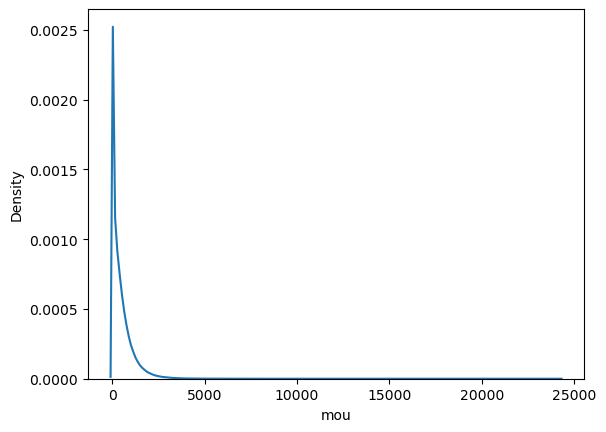

In [42]:
sns.kdeplot(df_2021['mou'])

In [43]:
upper_fence, lower_fence = fences('mou')

Граница максимальных значений mou: 1588.16875
Граница минимальных значений mou: 75.3375


In [44]:
df_2021[['mou']].describe()

,mou
count,3.535247e+06
mean,4.842816e+02
std,5.813195e+02
min,0.000000e+00
25%,7.533750e+01
50%,2.994950e+02
75%,6.804700e+02
max,2.422943e+04


- *Среднее количество минут* голосового траифка равно 480 минутам в месяц.
- *Стандартное отклонение* значений равно 579 минутам в месяц, что является показателем наличия большого кол-ва выбросов относительно среднего;
- *Минимальное значение* равно 0.
- *25%*: первый квартиль, равный 73 минутам в месяц. Это означает, что 25% абонентов имеют среднее количество минут разговора в месяц, не превышающее 73 минут.
- *50%*: медиана значений, равная 296 минутам в месяц. Это означает, что 50% абонентов имеют среднее количество минут разговора в месяц, не превышающее 296 минут.
- *75%*: третий квартиль значений, равный 676 минутам в месяц. Это означает, что 75% абонентов имеют среднее количество минут разговора в месяц, не превышающее 676 минут.
- *Максимальное значение* равно 24 229 минутам в месяц.

Полученные описательные статистики могут помочь понять распределение значений столбца 'mou' и выявить возможные выбросы в данных. Например, большое стандартное отклонение и наличие выбросов (максимальное значение в 24,229.434 минут в месяц) могут указывать на наличие аномальных значений в данных, которые могут исказить результаты анализа. Поэтому проверим, сколько строк из всего датасета по городам выше верхней границы макс. значений.

In [45]:
distr('mou')

,city,count_less_uf,%
10,Гулькевичи,41518,90.811260
2,Армавир,95148,90.994118
33,Усть-Лабинск,49052,92.031745
15,Кропоткин,89218,92.376347
22,Новокубанск,77820,92.486511
20,Меленки,7616,92.528247
18,Лабинск,24252,92.557820
23,Петушки,68411,92.930789
19,Лакинск,83799,93.365198
24,Покров,82394,93.458559


Выходит, что мы можем удалить строки с выбросами, так как они не сильно влияют на объем работы с городом (до 10% в худшем случае).

In [46]:
df_2021 = df_2021[df_2021['mou'] < upper_fence]
mou_after = df_2021.shape[0]

Теперь повторим шаги и взглянем на __исходящие звонки__. 

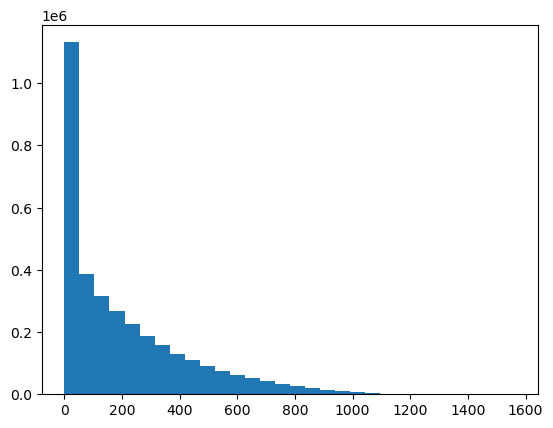

In [47]:
mou_out_prev = df_2021.shape[0]
df_2021.loc[df_2021['mou_out'].isnull(), 'mou_out'] = 0
plt.hist(df_2021['mou_out'], bins=30)
plt.show()

In [48]:
upper_fence, lower_fence = fences('mou_out')

Граница максимальных значений mou_out: 747.144947
Граница минимальных значений mou_out: 22.382502


In [49]:
df_2021[['mou_out']].describe()

,mou_out
count,3.353579e+06
mean,2.031182e+02
std,2.213223e+02
min,0.000000e+00
25%,2.238250e+01
50%,1.290800e+02
75%,3.122875e+02
max,1.564273e+03


In [50]:
distr('mou_out')

,city,count_less_uf,%
2,Армавир,90970,95.608946
10,Гулькевичи,39705,95.633219
20,Меленки,7298,95.824580
18,Лабинск,23252,95.876629
33,Усть-Лабинск,47153,96.128598
23,Петушки,65787,96.164360
15,Кропоткин,85813,96.183506
19,Лакинск,80692,96.292319
24,Покров,79374,96.334685
27,Сортавала,14455,96.392371


In [51]:
df_2021[df_2021['mou_out'] > upper_fence].shape[0] / df_2021.shape[0] * 100

3.1255563086481635

В случае с исходящими звонками мы удалим __до 5%__ от общего числа голосового трафика в городе; в общем же - около __3%__ от всего кол-ва записей. 

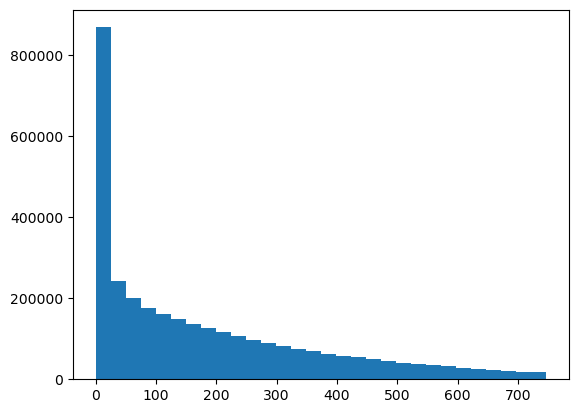

In [52]:
df_2021 = df_2021[df_2021['mou_out'] < upper_fence]
plt.hist(df_2021['mou_out'], bins=30)
plt.show()

#### Интернет трафик

Повторим действия из предыдущих шагов. 

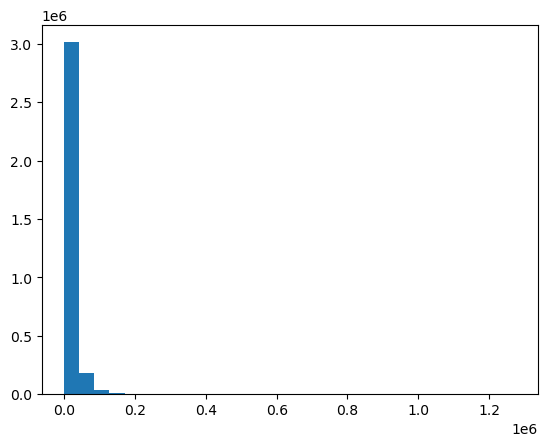

In [53]:
dou_prev = df_2021.shape[0]
df_2021.loc[df_2021['dou'].isnull(), 'dou'] = 0
plt.hist(df_2021['dou'], bins=30)
plt.show()

In [54]:
upper_fence, lower_fence = fences('dou')
df_2021[['dou']].describe()

Граница максимальных значений dou: 36986.53709
Граница минимальных значений dou: 245.61694


,dou
count,3.248761e+06
mean,1.251855e+04
std,2.282110e+04
min,0.000000e+00
25%,2.456169e+02
50%,4.360062e+03
75%,1.494199e+04
max,1.274284e+06


До удаления выбросов у нас следующие показатели по интернет трафику:
- _В среднем_ пользователь сети использует 12.4 Гб в месяц;
- Показатель _ст. отклонения_ достаточно высок, чтобы завявить, что данные искажены выбросами. 
- _Минимальное_ значение, равное 0;
- _25%, первый квартиль_, равный 170 Мб;
- _50%, медиана_, равная 4.2 Гб в месяц;
- _75%, третий квартиль_, равный 14.7 Гб в месяц. Что примечательно, показатель третьего квартиля указывает, что среднее потребление интнернет трафика искажено аномальными высокими значениями;
- _Максимальное значение_, равное 1.27 Тб в месяц; возможно кто-то пользуется мобильным интнернетом, как основным. 

Рассмотрим границу максимальных значений. 

In [55]:
distr('dou')

,city,count_less_uf,%
2,Армавир,79759,87.676157
6,Горно-Алтайск,34969,88.227577
10,Гулькевичи,35144,88.512782
23,Петушки,58562,89.017587
24,Покров,71042,89.502860
33,Усть-Лабинск,42235,89.570123
13,Кольчугино,7327,89.604990
28,Струнино,27872,89.678250
35,Юрьев-Польский,10786,89.741243
19,Лакинск,72455,89.792049


Если удалять строки по верхней границе, то в некоторых городах мы удалим до 13% от общего кол-ва строк. Разумнее будет рассчитать для каждого города индивидуальную верхнюю границу и рассмотреть таблицу еще раз. 

In [56]:
# Группируем данные по городам и применяем функцию для расчета квантилей для каждого города
q1 = df_2021.groupby('city')['dou'].apply(lambda x: x.quantile(0.25))
q3 = df_2021.groupby('city')['dou'].apply(lambda x: x.quantile(0.75))

# Рассчитываем межквартильный размах для каждого города
iqr = q3 - q1

cities = df_2021.groupby('city').count()

# Рассчитываем верхнюю границу для каждого города
upper_fence = q3 + 1.5 * iqr

# Группируем исходный датафрейм по городам и считаем количество строк, где значение столбца dou меньше границы максимальных значений
df_filtered = df_2021.groupby('city').apply(lambda x: x[x['dou'] < upper_fence[x.name]].count())

# Рассчитываем процентное соотношение количества строк с меньшим значением dou к общему количеству строк для каждого города
df_filtered['%'] = df_filtered['id_hash'] / cities['id_hash'] * 100

# Создаем новый датафрейм с результатами
df_result = pd.DataFrame({
    'city': cities.index,
    'count_less_uf': df_filtered['id_hash'],
    '%': df_filtered['%']
})
df_result = df_result.reset_index(drop=True)
df_result = df_result.sort_values(by='%')
df_result

,city,count_less_uf,%
17,Курганинск,28012,88.391026
22,Новокубанск,67112,89.383749
9,Горячий Ключ,317676,89.526043
18,Лабинск,20820,89.540685
13,Кольчугино,7383,90.289837
11,Ейск,45595,90.365863
4,Белореченск,41465,90.420428
27,Сортавала,13082,90.501557
1,Александров,39053,90.530391
7,Городищи,21465,90.531421


Ситуация сильно не поменялась. Тогда опеределим границу максмальных значений самостоятельно. Как мы помним, в среднем абонент потребляет около 12 Гб трафика в месяц, 75% всех абонентов не более 14 Гб, а верхняя граница максимальных значений равна 36.6 Гб. Найдем, сколько границу потребления трафика 95% всех пользователей и установим ее в качестве нашей границы.

In [57]:
upper_fence = df_2021["dou"].quantile(0.95)
print(f'{upper_fence} Мб – граница потребления 95% всех абонентов в 2021 году')

52097.156 Мб – граница потребления 95% всех абонентов в 2021 году


In [58]:
distr('dou')

,city,count_less_uf,%
2,Армавир,84493,92.880070
6,Горно-Алтайск,36984,93.311467
10,Гулькевичи,37151,93.567561
23,Петушки,61668,93.738885
13,Кольчугино,7671,93.811911
35,Юрьев-Польский,11278,93.834762
33,Усть-Лабинск,44287,93.921914
24,Покров,74578,93.957719
12,Ковров,25829,93.964639
28,Струнино,29214,93.996139


In [59]:
# # Группируем данные по городам и применяем функцию для расчета квантилей для каждого города
# q1 = df_2021.groupby('city')['dou'].apply(lambda x: x.quantile(0.25))
# q3 = df_2021.groupby('city')['dou'].apply(lambda x: x.quantile(0.75))
# 
# # Рассчитываем межквартильный размах для каждого города
# iqr = q3 - q1
# 
# cities = df_2021.groupby('city').count()
# 
# # Рассчитываем верхнюю границу для каждого города
# upper_fence = q3 + 1.5 * iqr
# 
# # Группируем исходный датафрейм по городам и месяцам, считаем количество строк, где значение столбца dou меньше границы максимальных значений
# df_filtered_month = df_2021.groupby(['city', 'month']).apply(lambda x: x[x['dou'] < upper_fence[x.name[0]]].count())
# df_filtered_month = df_filtered_month.rename(columns={'city':'count', 'month':'month_name_c'})
# df_filtered_month = df_filtered_month.reset_index()
# 
# df_filtered_month['%'] = df_filtered_month['id_hash'] / df_2021.groupby(['city', 'month'])['id_hash'].count().reset_index()['id_hash'] * 100
# 
# # Создаем сводную таблицу, где строки - это города, столбцы - это месяцы, а значения - это количество строк и процентное соотношение для каждого города и каждого месяца
# df_pivot = df_filtered_month.pivot_table(values=['id_hash', '%'], index='city', columns='month', fill_value=0)
# 
# # Объединяем таблицу df_result с таблицей df_pivot по столбцу 'city'
# df_pivot


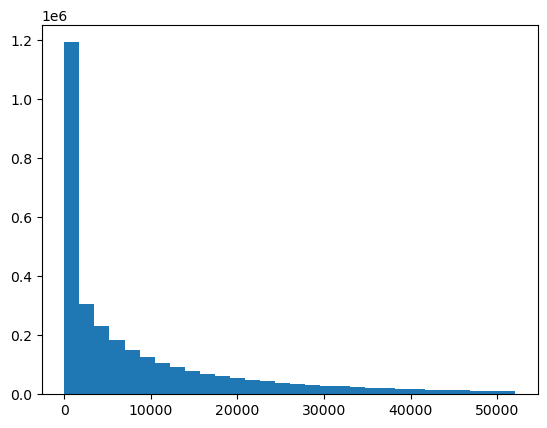

In [60]:
df_2021 = df_2021[df_2021['dou'] < upper_fence]
dou_after = df_2021.shape[0]
plt.hist(df_2021['dou'], bins=30)
plt.show()

Таким образом, мы убрали из таблицы тех пользоватлей, которые использовали аномальный объем трафика.

#### __Вывод__

Итого, мы устранили пропуски за 2021 год:

* __Возраст__:
> * 174 тыс. абонентов – не удалось определить возраст;
> * 0.74% абонентов было удалено ввиду аномальных значений;
> * 36.2 года – средний возраст абонента;
> * 37 лет – возраст абонента по медиане;
> * Петушки, Покров, Ковров, Лакинск, Горно-Алтайск, Вязники  – лидеры по минимальному среднему возрасту абонента – 35.7-36.2 года, 35-36 по медиане;
> * Курганинск – лидер по максимальному среднему возрасту абонента  – 40.8 года, 40 по медиане;
> * Отфильтровано данных 5.37% от первоначального кол-ва строк.


* __Количество проведенных дней__:
> * Минимальная граница значений до выбросов – 3 дня;
> * Максимальная граница значений до выбросов – 20.5 дней;
> * от _89% до 99.9%_ абонентов 36 городов __проводят в городе до 20.5 дней__;
> * от _51% до 87%_ абонентов 36 городов __проводят в городе от 3 дней__ (включительно); 
> * Отфильтровано данных 1.62% от первоначального кол-ва строк.

* __Домашний регион__:
> * Топ-5 регионов по кол-ву туристов: Москва (633 тыс.), Нижегородская обл. (224 тыс.), Ростовская обл. (211 тыс.), Санкт-Петербург (195 тыс.) и Самарская обл. (160 тыс.)
> * Топ-5 регионов по наименьшему кол-ву туристов: Еврейская автономная обл. (859), Магаданская обл. (422), Республика Алтай (305), Республика Адыгея (289), Чукотский автономный округ. (130)
> * 14 тыс. строк – с регионом "-1". (в проуессе получения ответа от менторов)

* __Туристический регион__:
> * 78% всех полей с регионом "Краснодарский край";
> * 0.7% всех полей с регионом "Республика Карелия";
> * Аномалии отсутствуют;

* __Пол абонента__:
> * 46.9% всех абонентов – мужчины;
> * 42.4% всех абонентов – женщмны;
> * 10.7% пол не определен
> * Аномалии отсутствуют;


* __Голосовой трафик общий__:
> * Минимальная граница значений до выбросов – 1575 минуты;
> * Максимальная граница значений до выбросов – 73 минуты;
> * 479 минут – в среднем потребление голосового трафика в месяц;
> * 295 минут – потребление голсового трафика в месяц по медиане;
> * Отфильтровано данных 5.11% от первоначального кол-ва строк.

* __Голосовой трафик исходящий__:
> * Минимальная граница значений до выбросов – 739 минуты;
> * Максимальная граница значений до выбросов – 21 минуты;
> * 200 минут – в среднем потребление голосового трафика в месяц;
> * 126 минут – потребление голсового трафика в месяц по медиане;
> * Отфильтровано данных 2.96% от первоначального кол-ва строк.

* __Интернет трафик__:
> * Минимальная граница значений до выбросов – 159 МБ или 0.16 ГБ;
> * Максимальная граница значений до выбросов – 36.5 ГБ;
> * 12.3 ГБ – в среднем потребление интернет трафика в месяц;
> * 4.2 ГБ – потребление интернет трафика в месяц по медиане;
> * 95-ый перцентиль – 51.8 ГБ как граница фильтрации абонентов;
> * Отфильтровано данных 4.56% от первоначального кол-ва строк.


### 2022 год

#### Возраст

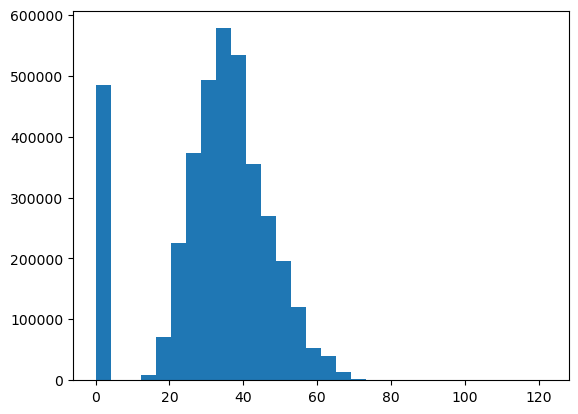

In [61]:
df_2022[df_2022['age'] < 0].shape[0]
df_2022[df_2022['age'] == 0].shape[0]
plt.hist(df_2022['age'], bins=30)
plt.show()
df_2022['age'] = df_2022['age'].apply(lambda x: 0 if x > 99 or x < 0 else x)

Почти в 3 раза больше за 2022 год стало абонентов, чей возраст определить не удалось. Это может повлиять на средний возраст абонентов и медиану. 

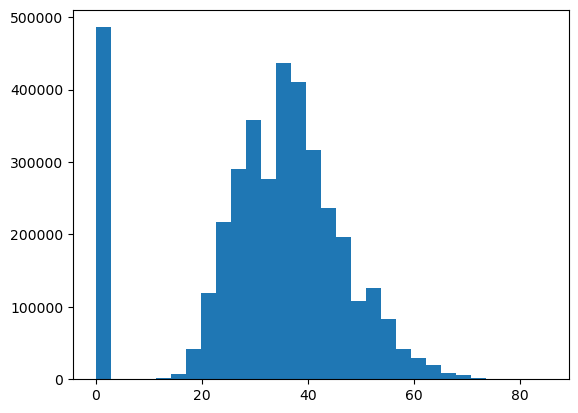

In [62]:
plt.hist(df_2022['age'], bins=30)
plt.show()

In [63]:
def fences(field):
    q1 = df_2022[field].quantile(0.25)
    q3 = df_2022[field].quantile(0.75)
    iqr = q3 - q1
    upper_fence = q3 + 1.5 * iqr
    lower_fence = q1
    
    print(f'Граница максимальных значений {field}:', upper_fence)
    print(f'Граница минимальных значений {field}:', lower_fence)
    return upper_fence, lower_fence

In [64]:
def distr(field, ul=1):
    if ul == 1:
        cities = df_2022.groupby('city').count()
        
        # Группируем исходный датафрейм по городам и считаем количество строк, где значение столбца field меньше границы максимальных значений
        df_filtered = df_2022[df_2022[field] < upper_fence].groupby('city').count()
        
        # Рассчитываем процентное соотношение количества строк с меньшим значением field к общему количеству строк для каждого города
        df_filtered['%'] = df_filtered['id_hash'] / cities['id_hash'] * 100
        
        # Создаем новый датафрейм с результатами
        df_result = pd.DataFrame({
            'city': cities.index,
            'count_less_uf': df_filtered['id_hash'],
            '%': df_filtered['%']
        })
        
        df_result = df_result.reset_index(drop=True)
        df_result = df_result.sort_values(by='%')
        return df_result
    else:
        cities = df_2022.groupby('city').count()
        
        # Группируем исходный датафрейм по городам и считаем количество строк, где значение столбца field меньше границы максимальных значений
        df_filtered = df_2022[df_2022[field] > lower_fence].groupby('city').count()
        
        # Рассчитываем процентное соотношение количества строк с меньшим значением field к общему количеству строк для каждого города
        df_filtered['%'] = df_filtered['id_hash'] / cities['id_hash'] * 100
        
        # Создаем новый датафрейм с результатами
        df_result = pd.DataFrame({
            'city': cities.index,
            'count_more_lf': df_filtered['id_hash'],
            '%': df_filtered['%']
        })
        
        df_result = df_result.reset_index(drop=True)
        df_result = df_result.sort_values(by='%')
        return df_result
        

In [65]:
upper_fence, lower_fence = fences('age')

Граница максимальных значений age: 63.5
Граница минимальных значений age: 26.0


In [66]:
distr('age')

,city,count_less_uf,%
17,Курганинск,38023,96.297328
18,Лабинск,25173,97.801002
9,Горячий Ключ,407742,97.846965
4,Белореченск,51032,98.161114
22,Новокубанск,81856,98.231129
27,Сортавала,29142,98.829993
11,Ейск,44939,98.997665
34,Хадыженск,26135,99.060001
33,Усть-Лабинск,53924,99.094033
29,Темрюк,212057,99.168518


In [67]:
distr('age', 2)

,city,count_more_lf,%
8,Гороховец,59777,65.208901
24,Покров,60430,66.508183
12,Ковров,17936,68.034746
5,Вязники,53444,69.231566
19,Лакинск,61488,69.366666
20,Меленки,6676,69.993709
13,Кольчугино,8270,70.150140
7,Городищи,17343,70.525802
23,Петушки,49196,71.436247
35,Юрьев-Польский,14654,71.594684


Что можем отметить, так это меньшие значения максимальной (с 65 до 63.5) и минимальной границ (с 30 до 26) для 2022 года в сравнении с 2021, что говорит, что возраст туристов снизился и чаще более молодые люди начали путешествовать.

Если Курганинск чаще других городов (но совсем незгначительно) посещают люди старше 63.5 лет (коих менее 4% от общего кол-ва за год), то такие города, как Гороховец (34.8%), Покров (33.5%), Ковров (32%), Вязники	(30.68%), Лакинск (30.64%), Меленки	(30%) посещают чаще других туристы до 26 лет, судя по предварительным данным. Но помним момент с бóльшим кол-ом абонентов с 0 значением в графе с их возрастом. Отфильтруем данные по 65 лет, как в таблице за 2021 год.

In [68]:
lower_fence = 1

In [69]:
distr('age', 2)

,city,count_more_lf,%
8,Гороховец,69904,76.256136
24,Покров,71685,78.895236
20,Меленки,7671,80.425666
19,Лакинск,72738,82.058167
13,Кольчугино,9675,82.068030
5,Вязники,63461,82.207627
12,Ковров,21924,83.162007
35,Юрьев-Польский,17096,83.525503
7,Городищи,20658,84.006344
23,Петушки,58248,84.580423


в 33 из 36 городов доля абонентов с 0 в графе `age` составило более 10%, но может сказаться на расчетах уникальных пользователей в дальнейшем. Поэтому было принято решение оставить таких пользоваталей в основном дф, отдельно рассчитав параметры возрастов в разных городов без 0 значений. 

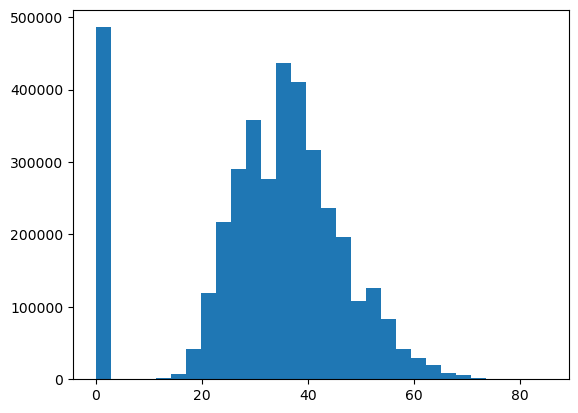

In [70]:
age_prev = df_2022.shape[0]
plt.hist(df_2022['age'], bins=30)
plt.show()
df_2022 = df_2022[df_2022['age'] < 65]

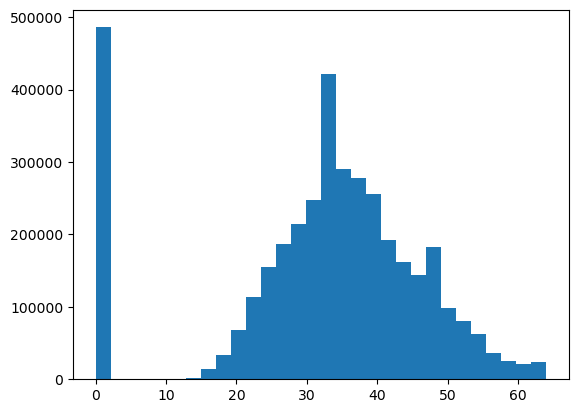

In [71]:
plt.hist(df_2022['age'], bins=30)
plt.show()

Для устранения аномалий с возрастами абонентов мы пожертвовали более чем в 2 раза больше данных, чем за 2021 год.

In [72]:
df_2022_no_age = df_2022[df_2022['age'] > 0]
df_2022_no_age.groupby('city')['age'].agg(['mean', 'median', 'min', 'max']).sort_values(by=['mean', 'median'])

,mean,median,min,max
city,,,,
Петушки,34.770978,34.0,9,64
Покров,35.049802,34.0,9,64
Горно-Алтайск,35.132895,34.0,8,64
Вязники,35.156678,34.0,9,64
Лакинск,35.166621,35.0,10,64
Юрьев-Польский,35.238385,35.0,11,64
Ковров,35.294395,34.0,10,64
Гороховец,35.774911,35.0,8,64
Кольчугино,35.774928,35.0,11,64


Во многих городах абоненты в среднем и по медиане стале моложе. 

#### Количество проведенных дней

In [73]:
days_prev = df_2022.shape[0]
df_2022[df_2022['days'] < 5].shape[0]

1243167

Так же, как и за 2021 год в таблице около 1.2 млн. пользователей, которые были в городе до 5 дней. 

In [74]:
less_5 = (df_2022
          .pivot_table(index='id_hash',
                       columns='month',
                       values='days',
                       aggfunc='sum',
                       margins=True)
          .sort_values(by='All',
                       ascending=False))

less_5 = less_5.query('All >= 5')
users = less_5.index

In [75]:
df_2022 = df_2022[df_2022['id_hash'].isin(users)]
fences('days')
upper_fence, lower_fence = (22, 4)

Граница максимальных значений days: 19.0
Граница минимальных значений days: 4.0


In [76]:
distr('days')

,city,count_less_uf,%
35,Юрьев-Польский,17881,91.085528
23,Петушки,60779,93.371125
28,Струнино,33362,93.492882
13,Кольчугино,10410,94.063432
1,Александров,44347,94.139000
24,Покров,79779,94.404080
19,Лакинск,78323,94.446990
7,Городищи,22066,95.013779
8,Гороховец,81680,95.506472
5,Вязники,69084,95.571695


In [77]:
distr('days', 2)

,city,count_more_lf,%
17,Курганинск,17256,48.214585
31,Тихорецк,72601,49.750565
34,Хадыженск,13240,53.731586
4,Белореченск,26586,55.738186
14,Кореновск,184403,59.326189
18,Лабинск,14272,60.194011
2,Армавир,68083,60.631941
33,Усть-Лабинск,30802,61.323140
15,Кропоткин,60334,61.355570
30,Тимашевск,157716,65.726776


Похожая с 2021 годом картина. Дни распределены примерно одинаоково. 

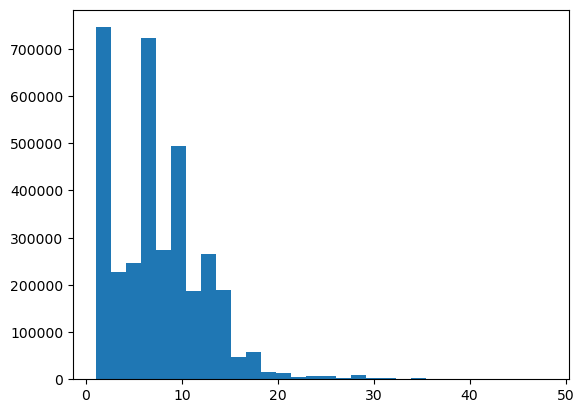

In [78]:
plt.hist(df_2022['days'], bins=30)
plt.show()

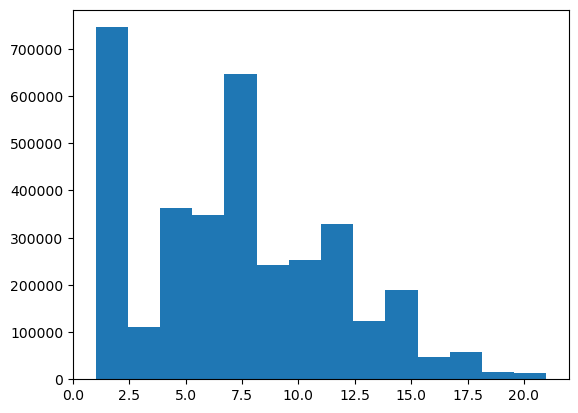

In [79]:
df_2022 = df_2022[df_2022['days'] < 22]
plt.hist(df_2022['days'], bins=14)
plt.show()

In [80]:
df_2022[['days']].describe()

,days
count,3.481842e+06
mean,7.144890e+00
std,4.446319e+00
min,1.000000e+00
25%,4.000000e+00
50%,7.000000e+00
75%,1.000000e+01
max,2.100000e+01


#### Домашний регион

In [81]:
df_2022.groupby('home_region').agg({'id_hash':'count'})

,id_hash
home_region,
-1,8251
1,1120
2,72519
3,7065
4,267
...,...
78,196280
79,655
86,25148


"Отрицательных" регионов меньше. 

In [82]:
home_2022 = df_2022.groupby('home_region').agg({'id_hash':'count'}).sort_values(by='id_hash', ascending=False)
home_2022['%'] = home_2022['id_hash'] / home_2022['id_hash'].sum() * 100
home_2022

,id_hash,%
home_region,,
77,703624,20.208384
61,250340,7.189872
52,222051,6.377400
78,196280,5.637246
63,159755,4.588232
...,...,...
17,957,0.027485
79,655,0.018812
49,389,0.011172


Кол-во туристов из Москвы стало больше на 30 с небольшим тысяч человек, из Ростовской области туристов почти не изменилось, но туристы оттуда теперь на 2-м месте по общему числу поездок; из Нижегородской области туристов стало меньше на 30 тыс. человек или около -0.9% от общего числа. Из СПб туристов практически не поменялось, из Самарской области туристов стало меньше на примерно 7-8 тыс. человек. 

В топе непутешествующих все те же 4 региона – Еврейская АТО, Магаданская обл., Алтай, Чукотский АТО плюс Республика Тыва. 

#### Туристический регион

In [83]:
region_counts = df_2022['tourists_region'].value_counts()

# Вычисляем общее количество строк в датасете
total_rows = len(df_2022)

# Строим таблицу, где для каждого региона показано процентное соотношение количества абонентов от общего количества строк в датасете
result = pd.concat([region_counts, region_counts / total_rows * 100], axis=1)
result.columns = ['count', '%']

result

,count,%
23,2790329,80.139449
33,594658,17.078834
4,46984,1.349401
38,34684,0.996139
10,15187,0.436177


Поток в Краснодарский край и Владимирскую обл. увеличился, хоть и незначительно, тогда как в другие реигионы он упал. 

In [84]:
# Добавляем новый столбец с наименованием региона
df_2022['tourist_region_name'] = df_2022['tourists_region'].apply(get_region_name)

#### Пол

In [85]:
age_counts = df_2022['gender'].value_counts()

# Вычисляем общее количество строк в датасете
total_rows = len(df_2022)

# Строим таблицу, где для каждого региона показано процентное соотношение количества абонентов от общего количества строк в датасете
result = pd.concat([age_counts, age_counts / total_rows * 100], axis=1)
result.columns = ['count', '%']

result

,count,%
1,1560923,44.830380
2,1279035,36.734435
3,641884,18.435185


Доля "бесполых" увеличилась на почти вдвое, женщин стало меньше, как и мужчин. Модель предсказания стала хуже определять пол. 

#### Голосовой трафик и голосовой исходящий трафик

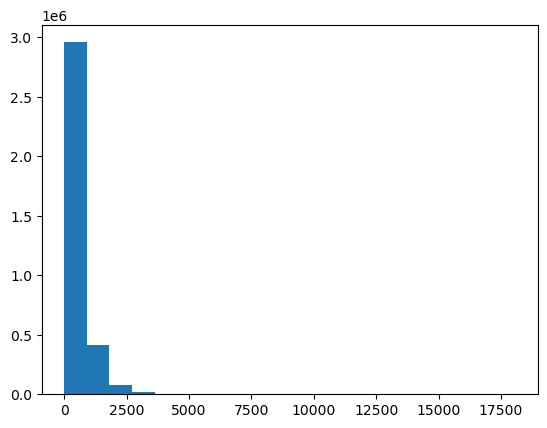

Граница максимальных значений mou: 1491.34125
Граница минимальных значений mou: 65.3975


In [86]:
df_2022.loc[df_2022['mou'].isnull(), 'mou'] = 0
plt.hist(df_2022['mou'], bins=20)
plt.show()
upper_fence, lower_fence = fences('mou')

In [87]:
df_2022[['mou']].describe()

,mou
count,3.481842e+06
mean,4.530856e+02
std,5.541425e+02
min,0.000000e+00
25%,6.539750e+01
50%,2.730525e+02
75%,6.357750e+02
max,1.807460e+04


In [88]:
distr('mou')

,city,count_less_uf,%
10,Гулькевичи,40708,91.150918
2,Армавир,100953,91.237980
33,Усть-Лабинск,45860,91.913017
22,Новокубанск,71296,92.637925
15,Кропоткин,90163,92.750746
18,Лабинск,21606,92.765446
23,Петушки,56512,92.979483
20,Меленки,7905,93.307365
35,Юрьев-Польский,16768,93.775516
5,Вязники,64847,93.866887


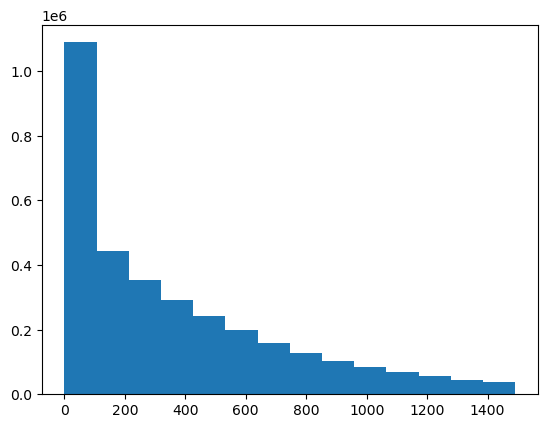

In [89]:
df_2022 = df_2022[df_2022['mou'] < upper_fence]
plt.hist(df_2022['mou'], bins=14)
plt.show()

__Голосовой исходящий трафик__

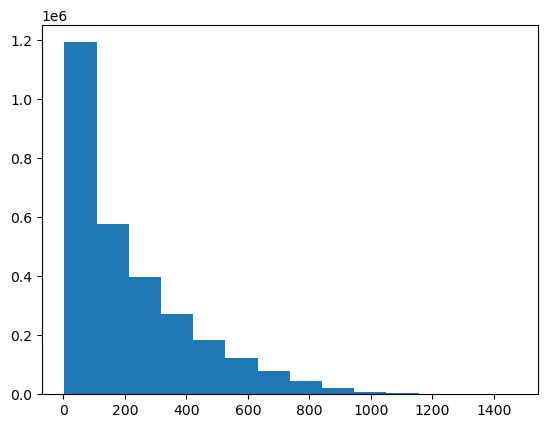

In [90]:
plt.hist(df_2022['mou_out'], bins=14)
plt.show()
df_2022.loc[df_2022['mou_out'].isnull(), 'mou_out'] = 0

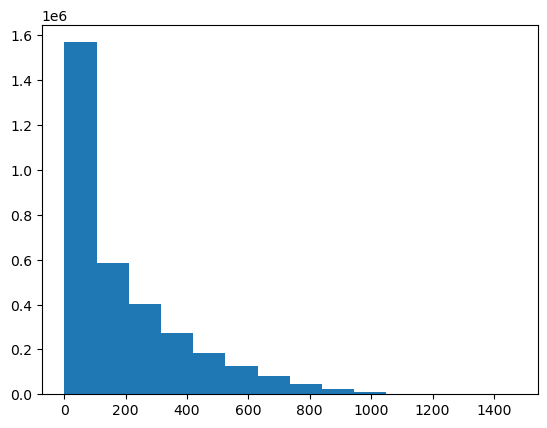

In [91]:
plt.hist(df_2022['mou_out'], bins=14)
plt.show()

In [92]:
upper_fence, lower_fence = fences('mou_out')
df_2022[['mou_out']].describe()

Граница максимальных значений mou_out: 697.7075014999999
Граница минимальных значений mou_out: 19.494999


,mou_out
count,3.299133e+06
mean,1.889365e+02
std,2.085211e+02
min,0.000000e+00
25%,1.949500e+01
50%,1.173200e+02
75%,2.907800e+02
max,1.469842e+03


In [93]:
distr('mou_out')

,city,count_less_uf,%
10,Гулькевичи,38910,95.583178
2,Армавир,96514,95.602904
18,Лабинск,20684,95.732667
33,Усть-Лабинск,43954,95.843873
23,Петушки,54293,96.073400
35,Юрьев-Польский,16112,96.087786
15,Кропоткин,86636,96.088196
20,Меленки,7597,96.103732
22,Новокубанск,68632,96.263465
19,Лакинск,70921,96.319485


In [94]:
df_2022[df_2022['mou_out'] > upper_fence].shape[0] / df_2022.shape[0] * 100

3.260371740090503

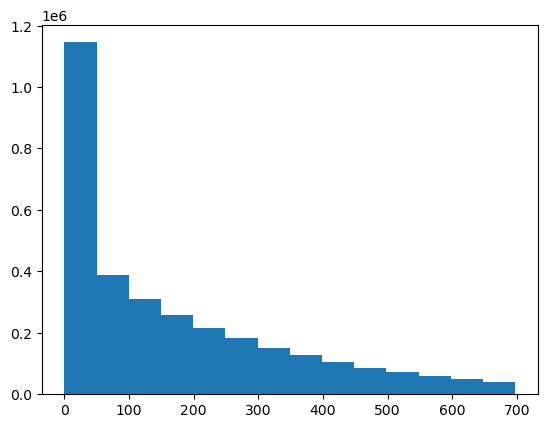

In [95]:
df_2022 = df_2022[df_2022['mou_out'] < upper_fence]
plt.hist(df_2022['mou_out'], bins=14)
plt.show()

#### Интернет трафик

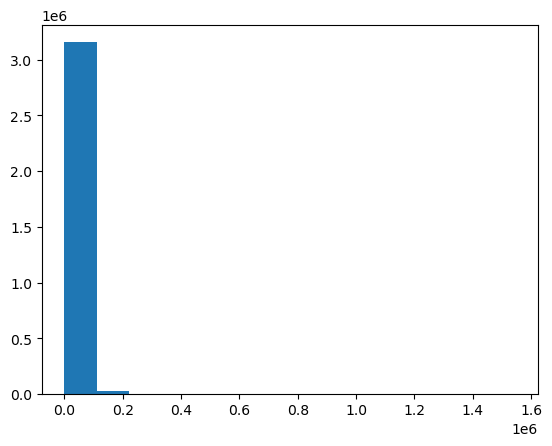

Граница максимальных значений dou: 41186.18211
Граница минимальных значений dou: 358.02026


In [96]:
df_2022.loc[df_2022['dou'].isnull(), 'dou'] = 0
plt.hist(df_2022['dou'], bins=14)
plt.show()
upper_fence, lower_fence = fences('dou')

In [97]:
upper_fence, lower_fence = fences('dou')
df_2022[['dou']].describe()

Граница максимальных значений dou: 41186.18211
Граница минимальных значений dou: 358.02026


,dou
count,3.191569e+06
mean,1.381092e+04
std,2.472370e+04
min,0.000000e+00
25%,3.580203e+02
50%,5.180464e+03
75%,1.668928e+04
max,1.545581e+06


- В среднем пользователь использует 13.8 Гб в месяц, что является большим значением, чем в предыдущей таблице за 2021 год. 
- Стандартное отклонение также выше, что указывает на более высокую вариативность данных. 
- Минимальное значение также равно 0, а максимальное значение равно 1.55 Тб в месяц, что является большим значением, чем в предыдущей таблице.

Сравнивая показатели двух таблиц, можно сделать вывод, что пользователи в 2022 году в среднем используют больше интернет трафика, чем пользователи за 2021 год. Однако, в данной таблице также можно наблюдать выбросы в виде аномально высоких значений, которые могут искажать среднее значение и делать его нерепрезентативным. Поэтому перед анализом данных следует удалять выбросы, чтобы получить более точные результаты.

In [98]:
distr('dou')

,city,count_less_uf,%
6,Горно-Алтайск,38656,88.642253
2,Армавир,86082,89.191205
23,Петушки,48555,89.431418
12,Ковров,19926,89.801253
33,Усть-Лабинск,39500,89.866679
10,Гулькевичи,35003,89.958879
35,Юрьев-Польский,14515,90.088133
28,Струнино,27679,90.115579
27,Сортавала,12531,90.209488
21,Муром,53334,90.330776


In [99]:
upper_fence = df_2022["dou"].quantile(0.95)
print(f'{upper_fence} Мб – граница потребления 95% всех абонентов в 2022 году')

56102.75179999998 Мб – граница потребления 95% всех абонентов в 2022 году


In [100]:
distr('dou')

,city,count_less_uf,%
6,Горно-Алтайск,40731,93.400445
2,Армавир,90296,93.557411
12,Ковров,20797,93.726621
23,Петушки,50925,93.796622
28,Струнино,28839,93.892235
35,Юрьев-Польский,15134,93.929990
10,Гулькевичи,36589,94.034952
1,Александров,38706,94.129377
33,Усть-Лабинск,41390,94.166629
27,Сортавала,13081,94.168886


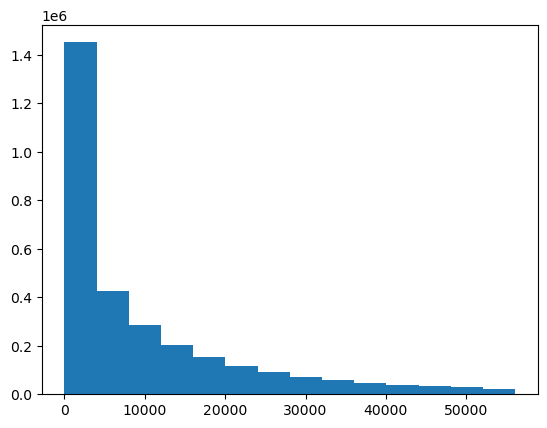

In [101]:
df_2022 = df_2022[df_2022['dou'] < upper_fence]
plt.hist(df_2022['dou'], bins=14)
plt.show()

#### **Вывод**

In [102]:
df_2022.isnull().sum().sort_values(ascending=False)/df_2022.shape[0]*100

interests              23.466436
ul_volume_sum          18.015462
dl_volume_sum          17.061270
volume_sum             17.020010
top_service            16.949858
snap_date               0.000000
month_name              0.000000
year                    0.000000
month                   0.000000
snap_date_datetime      0.000000
dou                     0.000000
id_hash                 0.000000
mou_out                 0.000000
mou                     0.000000
age                     0.000000
gender                  0.000000
city                    0.000000
tourists_region         0.000000
home_region             0.000000
days                    0.000000
tourist_region_name     0.000000
dtype: float64

# Обзор данных

In [103]:
print("2021 shape: ", df_2021.shape)
print("2021 shape: ", df_2022.shape)

2021 shape:  (3086322, 16)
2021 shape:  (3031990, 21)


## Временные ряды

In [104]:
# Создаем список городов
eng_cities = ['Abinsk', 'Alexandrov', 'Armavir', 'Baikalsk', 'Belorechensk',
       'Vyazniki', 'Gorno-Altaisk', 'Gorodishchi', 'Gorokhovets',
       'Hot Key', 'Gulkevichi', 'Yeisk', 'Kovrov', 'Kolchugino',
       'Korenovsk', 'Kropotkin', 'Krymsk', 'Kurganinsk', 'Labinsk',
       'Lakinsk', 'Melenki', 'Murom', 'Novokubansk', 'Petushki', 'Pokrov',
       'Sirius', 'Slavyansk-on-Kuban', 'Sortavala', 'Strunino', 'Temryuk',
       'Timashevsk', 'Tikhoretsk', 'Tuapse', 'Ust-Labinsk', 'Khadyzhensk',
       'Yuriev-Polsky']

cities = ['Абинск', 'Александров', 'Армавир', 'Байкальск', 'Белореченск',
       'Вязники', 'Горно-Алтайск', 'Городищи', 'Гороховец',
       'Горячий Ключ', 'Гулькевичи', 'Ейск', 'Ковров', 'Кольчугино',
       'Кореновск', 'Кропоткин', 'Крымск', 'Курганинск', 'Лабинск',
       'Лакинск', 'Меленки', 'Муром', 'Новокубанск', 'Петушки', 'Покров',
       'Сириус', 'Славянск-на-Кубани', 'Сортавала', 'Струнино', 'Темрюк',
       'Тимашевск', 'Тихорецк', 'Туапсе', 'Усть-Лабинск', 'Хадыженск',
       'Юрьев-Польский']

# Создаем цикл, который будет проходить по каждому городу и создавать переменную с данными из двух датафреймов
for city, r_city in zip(eng_cities, cities):
    globals()[city] = pd.concat([df_2021[df_2021['city'] == r_city], df_2022[df_2022['city'] == r_city]])



In [105]:
lens_list = []
for city in eng_cities:
    lens_list.append((city, globals()[city].shape[0]))
    
lens_list.sort(key=lambda x: x[1], reverse=True)
lens_list

[('Hot Key', 679924),
 ('Sirius', 657457),
 ('Korenovsk', 514627),
 ('Timashevsk', 427197),
 ('Tuapse', 403659),
 ('Temryuk', 376276),
 ('Slavyansk-on-Kuban', 314892),
 ('Tikhoretsk', 249828),
 ('Krymsk', 217301),
 ('Armavir', 174789),
 ('Kropotkin', 162714),
 ('Gorokhovets', 151823),
 ('Pokrov', 143214),
 ('Lakinsk', 142989),
 ('Novokubansk', 136974),
 ('Vyazniki', 124503),
 ('Murom', 112826),
 ('Petushki', 112593),
 ('Abinsk', 92056),
 ('Yeisk', 85835),
 ('Ust-Labinsk', 85677),
 ('Belorechensk', 84464),
 ('Alexandrov', 79344),
 ('Gorno-Altaisk', 77715),
 ('Gulkevichi', 73740),
 ('Baikalsk', 63443),
 ('Kurganinsk', 61139),
 ('Strunino', 58053),
 ('Kovrov', 46626),
 ('Labinsk', 41652),
 ('Gorodishchi', 41326),
 ('Khadyzhensk', 39758),
 ('Sortavala', 26673),
 ('Yuriev-Polsky', 26412),
 ('Kolchugino', 16704),
 ('Melenki', 14109)]

## Уникальные абоненты

### Ежегодно

In [106]:
def abon_unique(df, year):
        table = (df
                 .groupby(['month', 'month_name'])
                 .agg({'id_hash':'nunique'})
                 .sort_values(by='month')
                 .reset_index())
        table['%'] = table['id_hash'] / table['id_hash'].sum() * 100
        table['%'] = table['%'].round(2)
        
        fig = px.bar(table,
               x='month_name', 
               y='id_hash',
               text_auto=True,
               title=f'Количество абонентов услуг ежемесячно в {year}',
               text='%')
        fig.show()

In [107]:
abon_unique(df_2021, 2021)

In [108]:
abon_unique(df_2022, 2022)

In [109]:
# группировка данных по городам и подсчет количества уникальных пользователей в каждом году
df_2021_grouped = df_2021.groupby('city')['id_hash'].nunique().reset_index()
df_2022_grouped = df_2022.groupby('city')['id_hash'].nunique().reset_index()

# объединение данных по городам в одну таблицу
merged_df = pd.merge(df_2021_grouped, df_2022_grouped, on='city', suffixes=('_2021', '_2022'))

# добавление столбца с процентным изменением количества пользователей
merged_df['%'] = (merged_df['id_hash_2022'] - merged_df['id_hash_2021']) / merged_df['id_hash_2021'] * 100
merged_df['%'] = merged_df['%'].round(2)

# переименование столбцов для более понятной интерпретации
merged_df = merged_df.rename(columns={'id_hash_2021': '2021', 'id_hash_2022': '2022'})

merged_df['abs_diff'] = merged_df['2022'] - merged_df['2021']

# вывод итоговой таблицы
merged_df = merged_df.sort_values(by='abs_diff', ascending=False).reset_index(drop=True)

In [110]:
merged_df

,city,2021,2022,%,abs_diff
0,Кореновск,209838,259645,23.74,49807
1,Горячий Ключ,285476,329174,15.31,43698
2,Туапсе,163345,205623,25.88,42278
3,Крымск,84082,115777,37.70,31695
4,Тимашевск,179355,205058,14.33,25703
5,Славянск-на-Кубани,134257,159615,18.89,25358
6,Армавир,63284,83470,31.90,20186
7,Тихорецк,104254,121565,16.60,17311
8,Кропоткин,62183,77254,24.24,15071
9,Сириус,285066,294282,3.23,9216


In [111]:
import plotly.express as px

fig = px.bar(merged_df,
             x='abs_diff',
             y='city',
             orientation='h',
             height=1000, 
             width=900, 
             text='%',
             title='Абсолютное и процентное изменение количества уникальных пользоваталей в 2021 и 2022 году',
             labels={'abs_diff':'уникальных абонентов'})
fig.update_traces(texttemplate='%{text}%')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()


### Ежемесячно

In [112]:
# объединение датасетов по строкам
df = pd.concat([df_2021, df_2022], ignore_index=True)

In [113]:
cities = df.city.unique().tolist()

In [114]:
from matplotlib.pyplot import figure


# figure(figsize=(15, 7), dpi=80)
# plt.plot(df[df['city'] == 'Абинск'].groupby('snap_date').id_hash.count(), )

year  month   2021   2022          %  abs_diff
0         1    665    628  -5.563910       -37
1         2    697    636  -8.751793       -61
2         3   1108    780 -29.602888      -328
3         4   1413   1301  -7.926398      -112
4         5   2242   1796 -19.892953      -446
5         6   7136   6132 -14.069507     -1004
6         7  10456  13789  31.876435      3333
7         8   8989  14125  57.136500      5136
8         9   3586   5848  63.078639      2262
9        10   1369   1390   1.533966        21
10       11    752    831  10.505319        79
11       12    522    502  -3.831418       -20


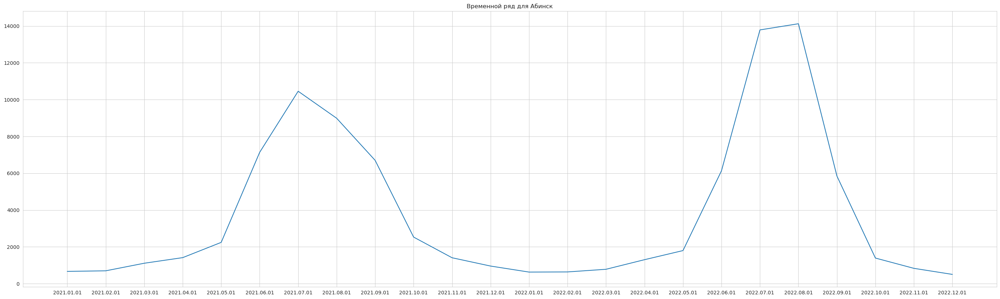

year  month  2021  2022          %  abs_diff
0         1  1466  1545   5.388813        79
1         2  1607  1742   8.400747       135
2         3  1966  2012   2.339776        46
3         4  2393  2634  10.071041       241
4         5  2884  2929   1.560333        45
5         6  5066  4837  -4.520332      -229
6         7  5491  6248  13.786196       757
7         8  5127  5987  16.773942       860
8         9  3300  3964  20.121212       664
9        10  2061  2949  43.085881       888
10       11  1460  2343  60.479452       883
11       12  1094  1506  37.659963       412


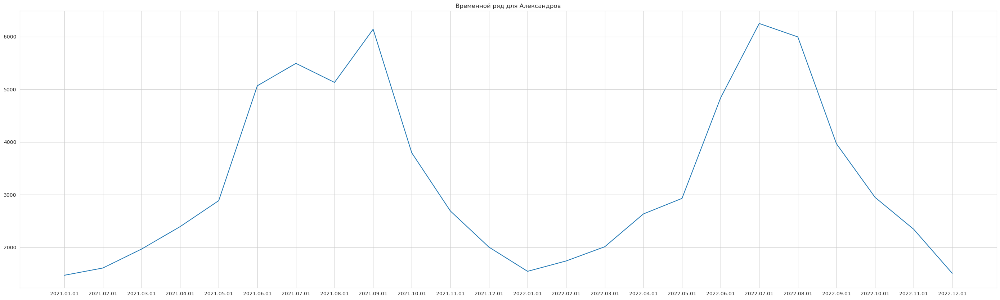

year  month   2021   2022          %  abs_diff
0         1   2815   2922   3.801066       107
1         2   3085   3142   1.847650        57
2         3   3873   3462 -10.611929      -411
3         4   4047   4954  22.411663       907
4         5   5381   5568   3.475190       187
5         6   7967   9705  21.814987      1738
6         7  12296  18355  49.276187      6059
7         8  13239  20777  56.937835      7538
8         9   7536  10051  33.373142      2515
9        10   4415   5212  18.052095       797
10       11   2947   3922  33.084493       975
11       12   1976   2218  12.246964       242


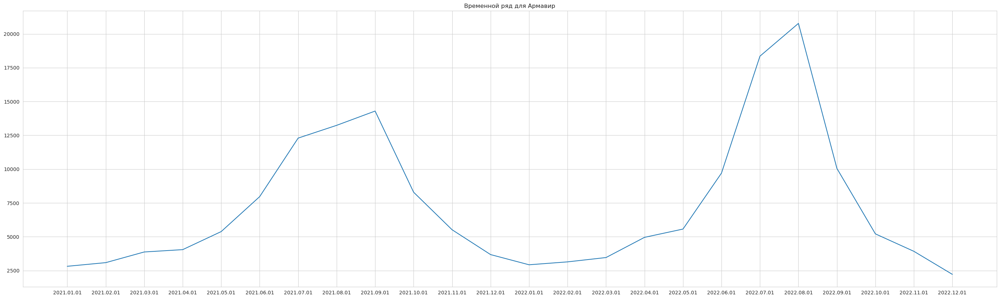

year  month  2021  2022          %  abs_diff
0         1  1318  1753  33.004552       435
1         2  1483  1866  25.826028       383
2         3  1753  2046  16.714204       293
3         4  1657  2028  22.389861       371
4         5  1733  1890   9.059435       157
5         6  2978  3121   4.801880       143
6         7  4161  5187  24.657534      1026
7         8  3889  4140   6.454101       251
8         9  2353  2316  -1.572461       -37
9        10  2304  2231  -3.168403       -73
10       11  1808  2030  12.278761       222
11       12  1299  1414   8.852964       115


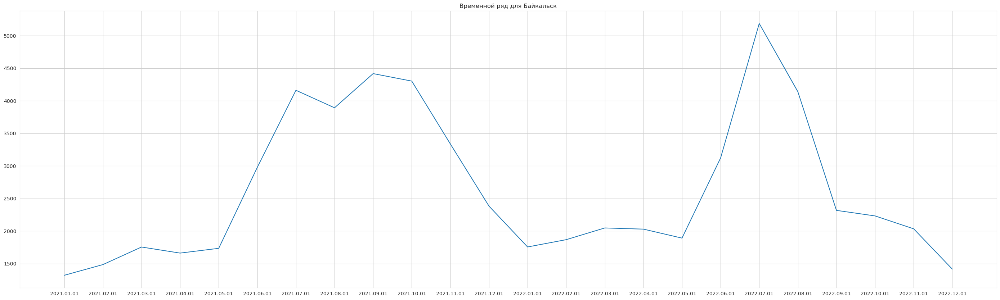

year  month  2021   2022          %  abs_diff
0         1  1168   1087  -6.934932       -81
1         2  1191   1015 -14.777498      -176
2         3  1434   1062 -25.941423      -372
3         4  1901   1831  -3.682272       -70
4         5  2863   2350 -17.918268      -513
5         6  4953   4724  -4.623461      -229
6         7  7782   9977  28.206117      2195
7         8  7633  10051  31.678239      2418
8         9  4209   4959  17.818959       750
9        10  1868   1974   5.674518       106
10       11   998   1200  20.240481       202
11       12   836    597 -28.588517      -239


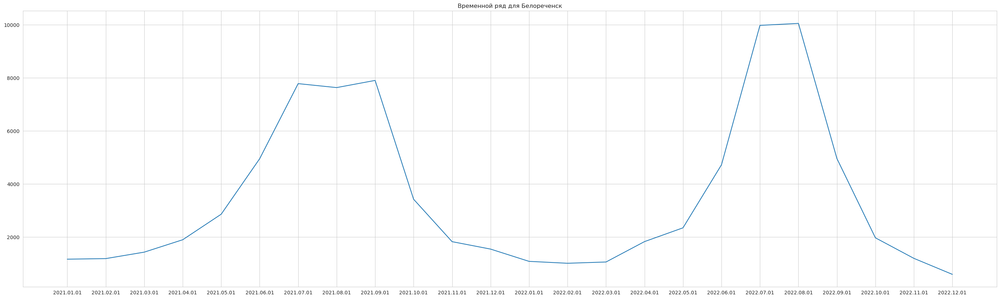

year  month  2021  2022          %  abs_diff
0         1  3179  3256   2.422145        77
1         2  3444  3509   1.887340        65
2         3  3594  3892   8.291597       298
3         4  4205  4579   8.894174       374
4         5  4816  5056   4.983389       240
5         6  5371  6296  17.222119       925
6         7  6042  7717  27.722608      1675
7         8  6071  7099  16.932960      1028
8         9  4815  5147   6.895119       332
9        10  4439  4787   7.839604       348
10       11  3752  4598  22.547974       846
11       12  2827  3044   7.675982       217


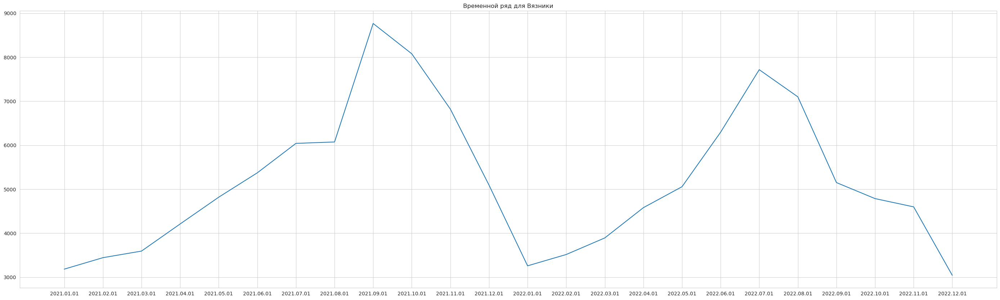

year  month   2021   2022          %  abs_diff
0         1    615    412 -33.008130      -203
1         2    536    459 -14.365672       -77
2         3    548    518  -5.474453       -30
3         4    853   1253  46.893318       400
4         5   2455   2621   6.761711       166
5         6   5593   7309  30.681209      1716
6         7  11125  14740  32.494382      3615
7         8   7600   8975  18.092105      1375
8         9   2516   2666   5.961844       150
9        10    888    945   6.418919        57
10       11    461    521  13.015184        60
11       12    262    312  19.083969        50


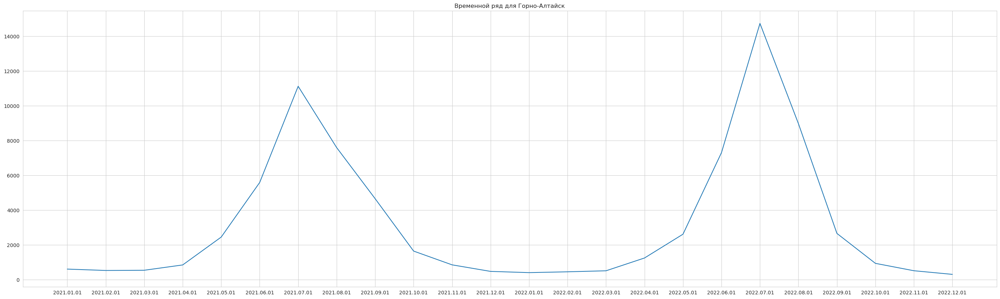

year  month  2021  2022          %  abs_diff
0         1  1265  1192  -5.770751       -73
1         2  1392  1112 -20.114943      -280
2         3  1477  1290 -12.660799      -187
3         4  1596  1482  -7.142857      -114
4         5  1818  1582 -12.981298      -236
5         6  1715  1951  13.760933       236
6         7  1774  2369  33.540023       595
7         8  1914  2024   5.747126       110
8         9  1576  1741  10.469543       165
9        10  1420  1606  13.098592       186
10       11  1239  1563  26.150121       324
11       12   908  1076  18.502203       168


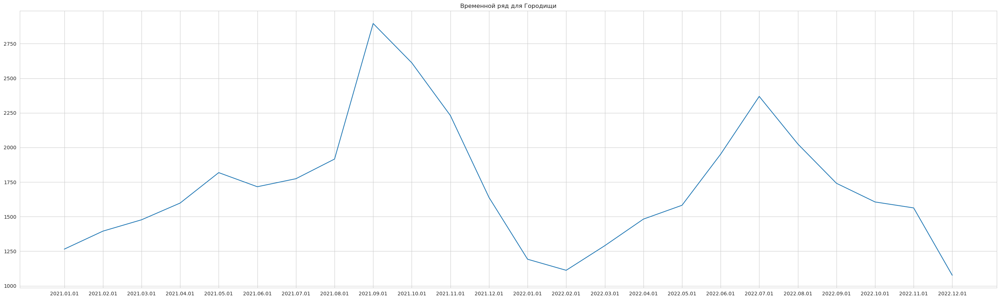

year  month  2021  2022          %  abs_diff
0         1  3871  4163   7.543270       292
1         2  4212  4448   5.603039       236
2         3  4689  4885   4.179996       196
3         4  5410  5709   5.526802       299
4         5  6087  6090   0.049285         3
5         6  6312  7723  22.354246      1411
6         7  7405  9002  21.566509      1597
7         8  7538  8258   9.551605       720
8         9  5842  6279   7.480315       437
9        10  5408  5755   6.416420       347
10       11  4794  5219   8.865248       425
11       12  3570  3696   3.529412       126


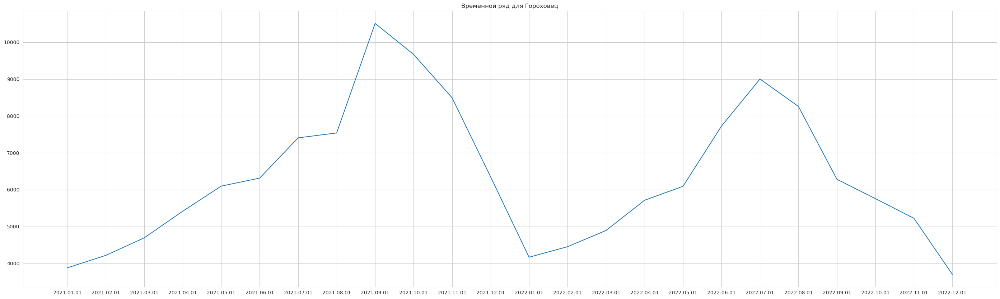

year  month   2021   2022          %  abs_diff
0         1   4833   3806 -21.249741     -1027
1         2   4668   3627 -22.300771     -1041
2         3   7110   5064 -28.776371     -2046
3         4   8069   8955  10.980295       886
4         5  13696  11138 -18.676986     -2558
5         6  48516  43335 -10.678951     -5181
6         7  78489  98830  25.915733     20341
7         8  77523  98901  27.576332     21378
8         9  37049  48325  30.435369     11276
9        10   9439  10116   7.172370       677
10       11   3998   4666  16.708354       668
11       12   1849   2217  19.902650       368


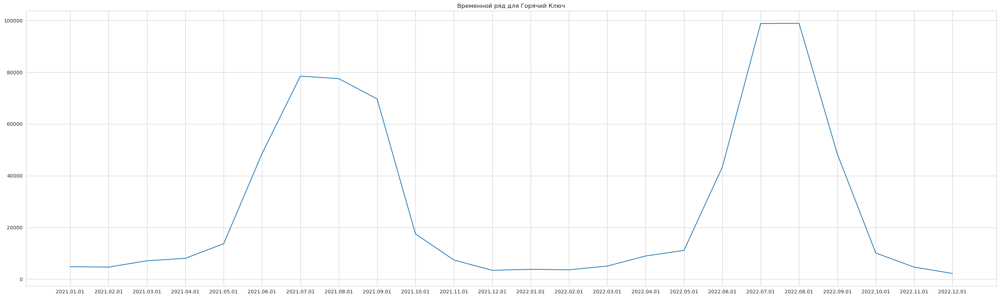

year  month  2021  2022          %  abs_diff
0         1  1726  1429 -17.207416      -297
1         2  1844  1727  -6.344902      -117
2         3  2256  1993 -11.657801      -263
3         4  2235  2761  23.534676       526
4         5  2796  2634  -5.793991      -162
5         6  3834  3993   4.147105       159
6         7  4641  6263  34.949364      1622
7         8  4452  6452  44.923630      2000
8         9  2544  3654  43.632075      1110
9        10  2113  2542  20.302887       429
10       11  1520  2027  33.355263       507
11       12   936  1113  18.910256       177


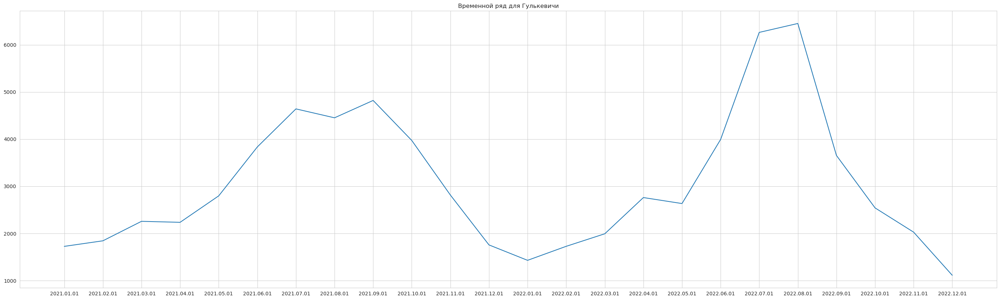

year  month   2021   2022          %  abs_diff
0         1    290    239 -17.586207       -51
1         2    211    205  -2.843602        -6
2         3    343    266 -22.448980       -77
3         4    597    536 -10.217755       -61
4         5   1938    916 -52.734778     -1022
5         6   9598   5731 -40.289644     -3867
6         7  16091  14007 -12.951339     -2084
7         8  13223  12582  -4.847614      -641
8         9   2229   1977 -11.305518      -252
9        10    541    526  -2.772643       -15
10       11    302    342  13.245033        40
11       12    142    193  35.915493        51


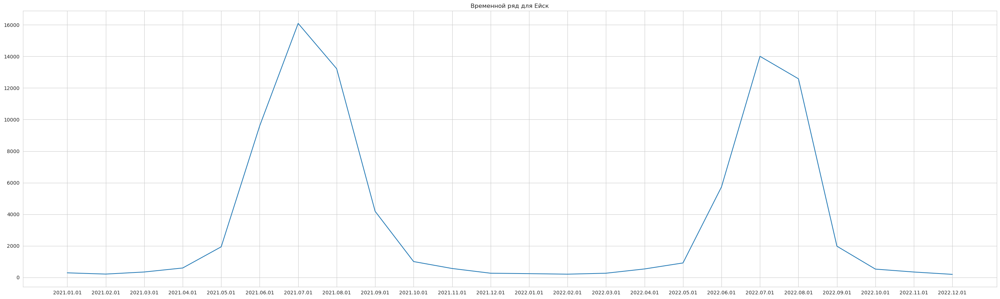

year  month  2021  2022          %  abs_diff
0         1  1261  1239  -1.744647       -22
1         2  1392  1081 -22.341954      -311
2         3  1618  1409 -12.917182      -209
3         4  1768  1677  -5.147059       -91
4         5  2114  1749 -17.265847      -365
5         6  2482  2309  -6.970185      -173
6         7  2539  2719   7.089405       180
7         8  2569  2504  -2.530167       -65
8         9  1866  1717  -7.984995      -149
9        10  1652  1818  10.048426       166
10       11  1188  1554  30.808081       366
11       12   857  1018  18.786464       161


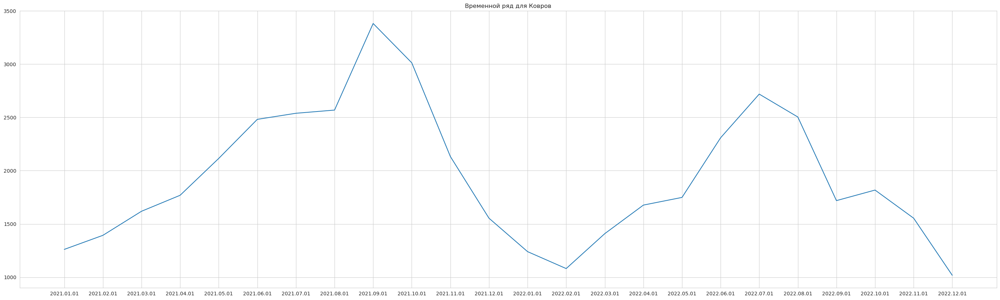

year  month  2021  2022          %  abs_diff
0         1   367   346  -5.722071       -21
1         2   273   400  46.520147       127
2         3   320   416  30.000000        96
3         4   498   638  28.112450       140
4         5   743   827  11.305518        84
5         6   777  1003  29.086229       226
6         7   901  1721  91.009989       820
7         8   811  1238  52.651048       427
8         9   499   844  69.138277       345
9        10   510   765  50.000000       255
10       11   391   530  35.549872       139
11       12   236   302  27.966102        66


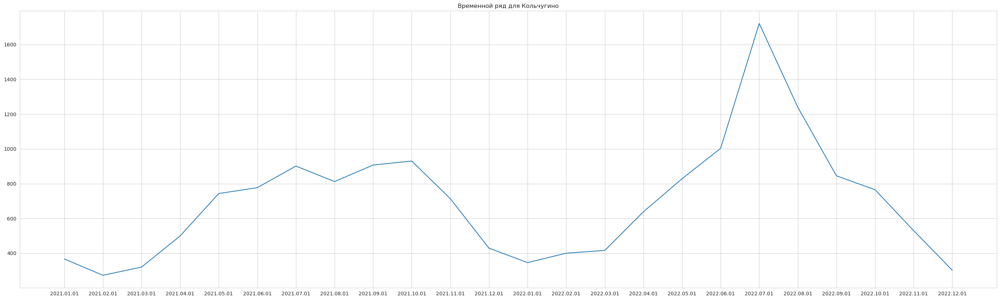

year  month   2021   2022          %  abs_diff
0         1   4223   3076 -27.160786     -1147
1         2   4039   2898 -28.249567     -1141
2         3   5258   3528 -32.902244     -1730
3         4   6919   7323   5.838994       404
4         5  10908   8921 -18.215988     -1987
5         6  35634  32990  -7.419880     -2644
6         7  61745  84685  37.152806     22940
7         8  58109  81865  40.881791     23756
8         9  21596  32513  50.551028     10917
9        10   5401   5623   4.110350       222
10       11   3014   3290   9.157266       276
11       12   1858   2011   8.234661       153


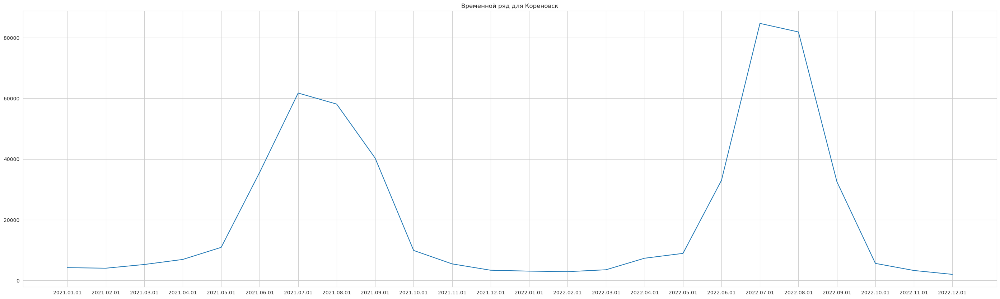

year  month   2021   2022          %  abs_diff
0         1   2838   2818  -0.704722       -20
1         2   2909   3115   7.081471       206
2         3   3726   3831   2.818035       105
3         4   4049   4635  14.472709       586
4         5   4816   5039   4.630399       223
5         6   7864   8679  10.363683       815
6         7  11821  17044  44.184079      5223
7         8  12070  16889  39.925435      4819
8         9   6593   8294  25.800091      1701
9        10   4785   5485  14.629049       700
10       11   3286   3902  18.746196       616
11       12   1851   2027   9.508374       176


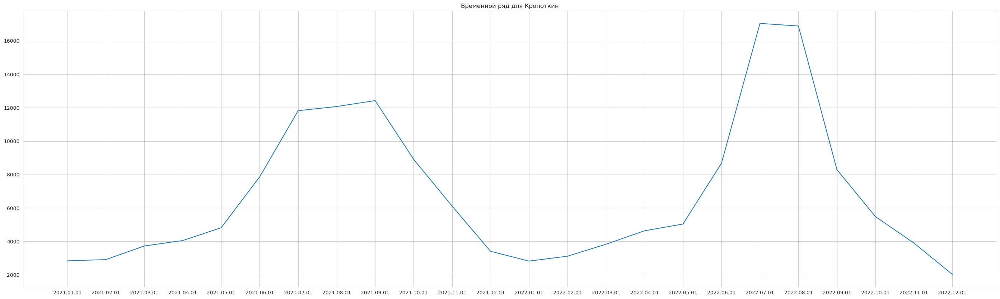

year  month   2021   2022          %  abs_diff
0         1   1308   1268  -3.058104       -40
1         2   1268   1343   5.914826        75
2         3   2162   1996  -7.678076      -166
3         4   2670   3465  29.775281       795
4         5   4442   4551   2.453850       109
5         6  16134  15619  -3.192017      -515
6         7  24837  33666  35.547771      8829
7         8  20670  34790  68.311563     14120
8         9   7926  15111  90.651022      7185
9        10   2732   3620  32.503660       888
10       11   1634   2146  31.334149       512
11       12   1206   1266   4.975124        60


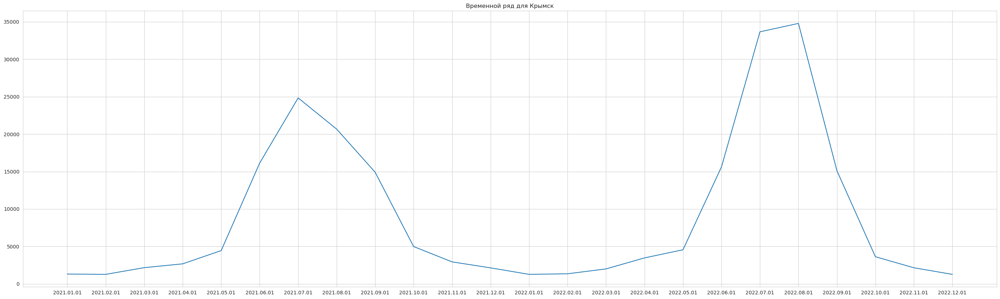

year  month  2021  2022          %  abs_diff
0         1   627   601  -4.146730       -26
1         2   592   546  -7.770270       -46
2         3   912   636 -30.263158      -276
3         4  1061  1003  -5.466541       -58
4         5  1665  1385 -16.816817      -280
5         6  3803  3720  -2.182488       -83
6         7  6250  7817  25.072000      1567
7         8  6088  8715  43.150460      2627
8         9  3127  4149  32.683083      1022
9        10   886  1198  35.214447       312
10       11   446   771  72.869955       325
11       12   398   374  -6.030151       -24


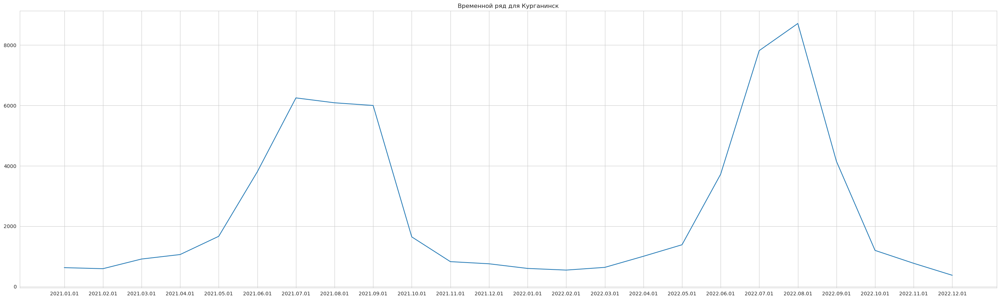

year  month  2021  2022          %  abs_diff
0         1   812   640 -21.182266      -172
1         2   749   660 -11.882510       -89
2         3   878   751 -14.464692      -127
3         4  1045  1120   7.177033        75
4         5  1453  1281 -11.837577      -172
5         6  2009  1895  -5.674465      -114
6         7  3026  4080  34.831461      1054
7         8  3549  4438  25.049310       889
8         9  1994  2271  13.891675       277
9        10  1269  1169  -7.880221      -100
10       11   793   878  10.718789        85
11       12   495   443 -10.505051       -52


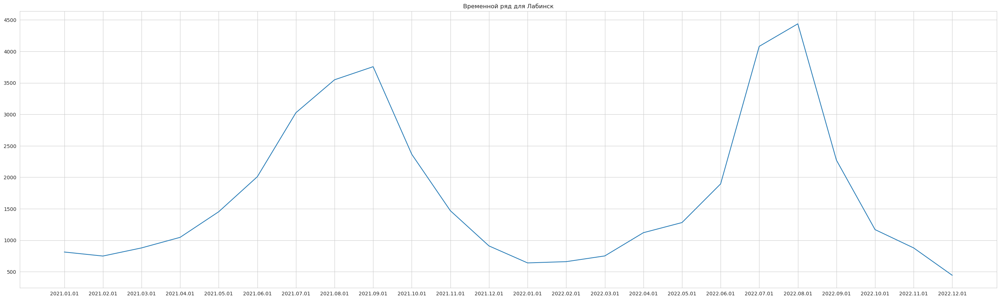

year  month  2021  2022          %  abs_diff
0         1  3940  3930  -0.253807       -10
1         2  4018  4111   2.314584        93
2         3  4403  4535   2.997956       132
3         4  5204  5637   8.320523       433
4         5  5793  6009   3.728638       216
5         6  5959  6883  15.505957       924
6         7  6601  8156  23.557037      1555
7         8  6677  7562  13.254456       885
8         9  5408  5819   7.599852       411
9        10  5123  5778  12.785477       655
10       11  4523  5061  11.894760       538
11       12  3372  3554   5.397390       182


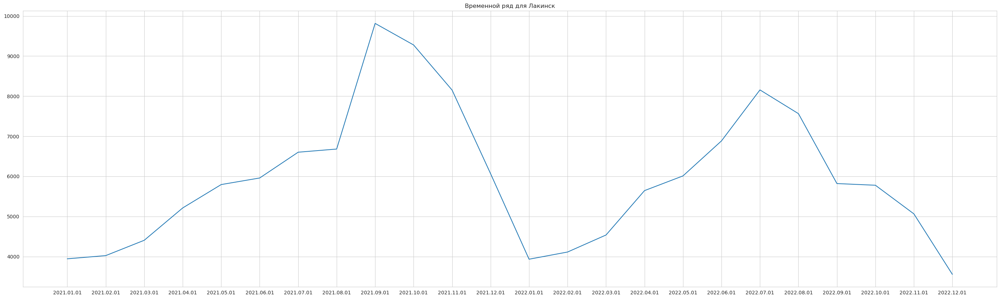

year  month  2021  2022          %  abs_diff
0         1   296   318   7.432432        22
1         2   309   284  -8.090615       -25
2         3   366   373   1.912568         7
3         4   401   539  34.413965       138
4         5   545   618  13.394495        73
5         6   675   762  12.888889        87
6         7   796  1184  48.743719       388
7         8   788  1188  50.761421       400
8         9   458   618  34.934498       160
9        10   420   560  33.333333       140
10       11   350   478  36.571429       128
11       12   264   301  14.015152        37


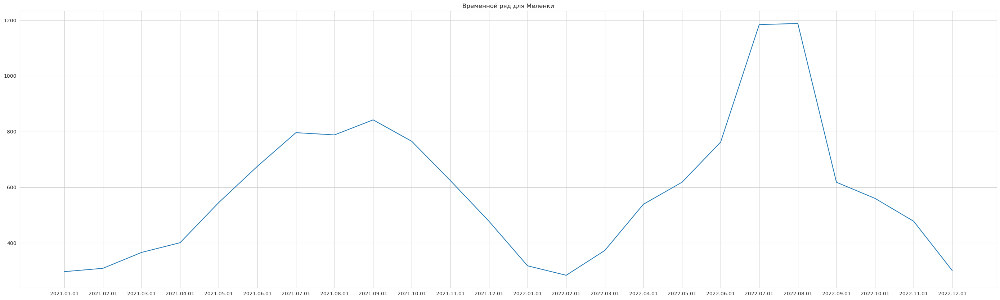

year  month  2021  2022          %  abs_diff
0         1  2592  2990  15.354938       398
1         2  2813  2612  -7.145396      -201
2         3  3299  3417   3.576841       118
3         4  3647  4421  21.222923       774
4         5  4697  4993   6.301895       296
5         6  5239  6499  24.050391      1260
6         7  5714  8340  45.957298      2626
7         8  5692  7418  30.323261      1726
8         9  3924  4469  13.888889       545
9        10  3678  4491  22.104405       813
10       11  2888  3710  28.462604       822
11       12  2061  2286  10.917031       225


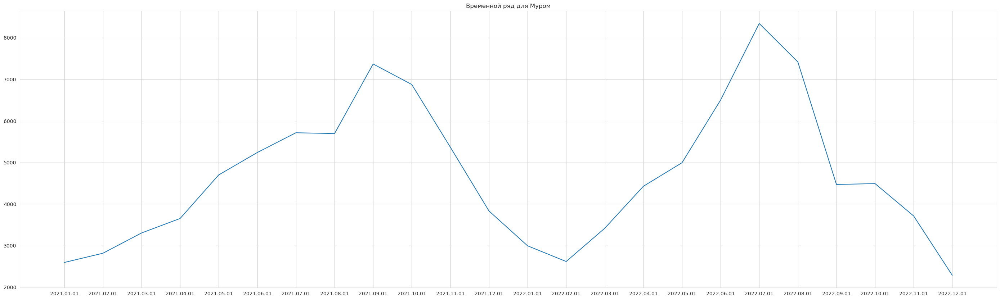

year  month  2021   2022          %  abs_diff
0         1  2951   2792  -5.388004      -159
1         2  3346   3027  -9.533772      -319
2         3  3966   3690  -6.959153      -276
3         4  4108   4572  11.295034       464
4         5  4937   4586  -7.109581      -351
5         6  6738   7040   4.482042       302
6         7  9135  11290  23.590586      2155
7         8  9556  12081  26.423190      2525
8         9  5450   6470  18.715596      1020
9        10  4140   4372   5.603865       232
10       11  2923   3477  18.953130       554
11       12  1957   2077   6.131834       120


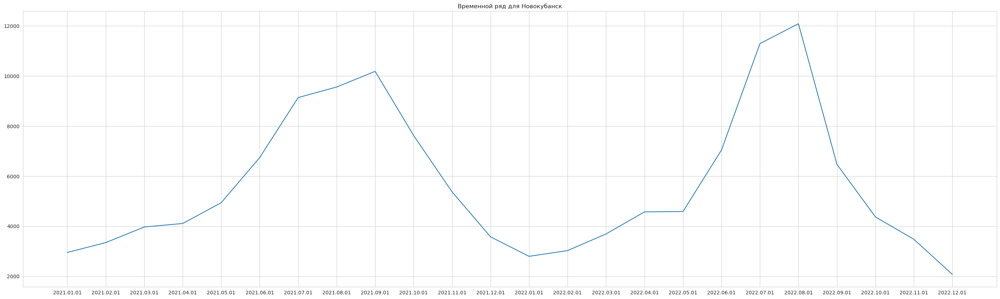

year  month  2021  2022          %  abs_diff
0         1  3038  2980  -1.909151       -58
1         2  3143  3112  -0.986319       -31
2         3  3498  3601   2.944540       103
3         4  4149  4325   4.241986       176
4         5  4839  4579  -5.373011      -260
5         6  5384  5397   0.241456        13
6         7  5673  6268  10.488278       595
7         8  5777  6056   4.829496       279
8         9  4293  4144  -3.470766      -149
9        10  4016  4207   4.755976       191
10       11  3444  3707   7.636469       263
11       12  2507  2537   1.196649        30


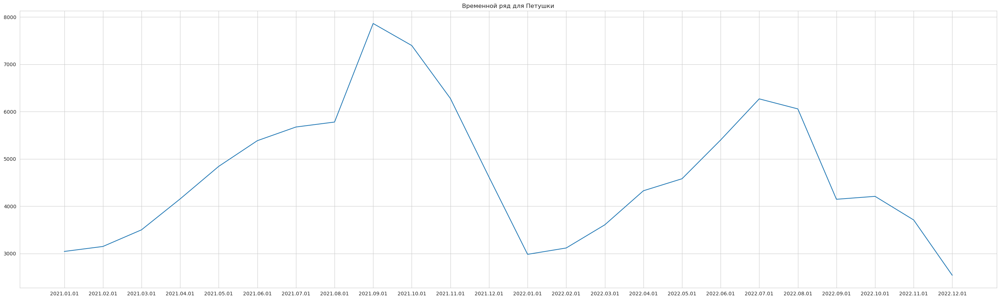

year  month  2021  2022          %  abs_diff
0         1  3781  3914   3.517588       133
1         2  3710  4409  18.840970       699
2         3  4128  4770  15.552326       642
3         4  5160  5925  14.825581       765
4         5  5780  6121   5.899654       341
5         6  5998  7186  19.806602      1188
6         7  6601  8419  27.541282      1818
7         8  6604  7613  15.278619      1009
8         9  5176  6138  18.585781       962
9        10  5313  5636   6.079428       323
10       11  4509  5031  11.576846       522
11       12  3222  3446   6.952204       224


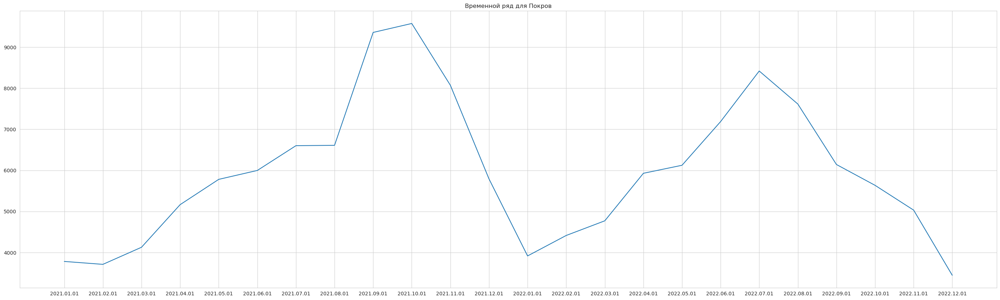

year  month   2021   2022          %  abs_diff
0         1   8876   6555 -26.149166     -2321
1         2  10044   7680 -23.536440     -2364
2         3  14874   9468 -36.345301     -5406
3         4  16563  14051 -15.166335     -2512
4         5  23942  17000 -28.995071     -6942
5         6  46474  41363 -10.997547     -5111
6         7  52626  65468  24.402387     12842
7         8  52160  65216  25.030675     13056
8         9  40637  48291  18.835052      7654
9        10  17965  18214   1.386028       249
10       11   6875   6916   0.596364        41
11       12   3292   2892 -12.150668      -400


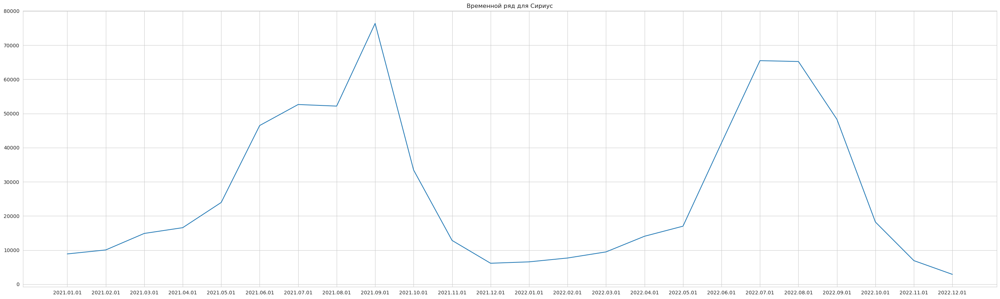

year  month   2021   2022          %  abs_diff
0         1   1194   1046 -12.395310      -148
1         2   1028   1130   9.922179       102
2         3   1874   1894   1.067236        20
3         4   2913   4083  40.164779      1170
4         5   6252   5241 -16.170825     -1011
5         6  24205  22004  -9.093163     -2201
6         7  40813  50811  24.497097      9998
7         8  40713  52409  28.727925     11696
8         9  13074  18500  41.502218      5426
9        10   2609   3182  21.962438       573
10       11   1316   1657  25.911854       341
11       12    813    952  17.097171       139


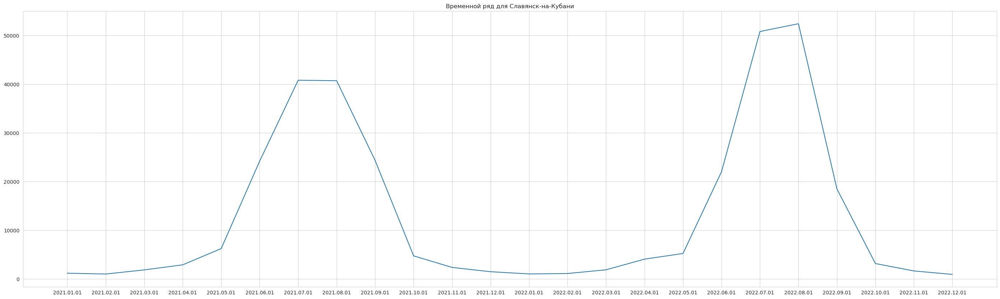

year  month  2021  2022          %  abs_diff
0         1   544   406 -25.367647      -138
1         2   309   272 -11.974110       -37
2         3   370   431  16.486486        61
3         4   484   519   7.231405        35
4         5   908   896  -1.321586       -12
5         6  1662  2169  30.505415       507
6         7  2872  3785  31.789694       913
7         8  2216  2645  19.359206       429
8         9  1098  1023  -6.830601       -75
9        10   701   537 -23.395150      -164
10       11   284   258  -9.154930       -26
11       12   176   140 -20.454545       -36


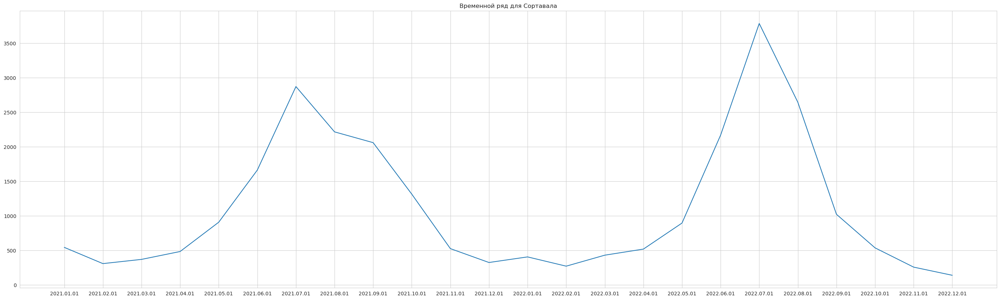

year  month  2021  2022          %  abs_diff
0         1  1042  1105   6.046065        63
1         2  1180  1269   7.542373        89
2         3  1355  1470   8.487085       115
3         4  1629  2003  22.958870       374
4         5  2129  2233   4.884922       104
5         6  3564  3594   0.841751        30
6         7  3900  4781  22.589744       881
7         8  3586  4501  25.515895       915
8         9  2203  2895  31.411711       692
9        10  1639  2217  35.265406       578
10       11  1125  1682  49.511111       557
11       12   848  1075  26.768868       227


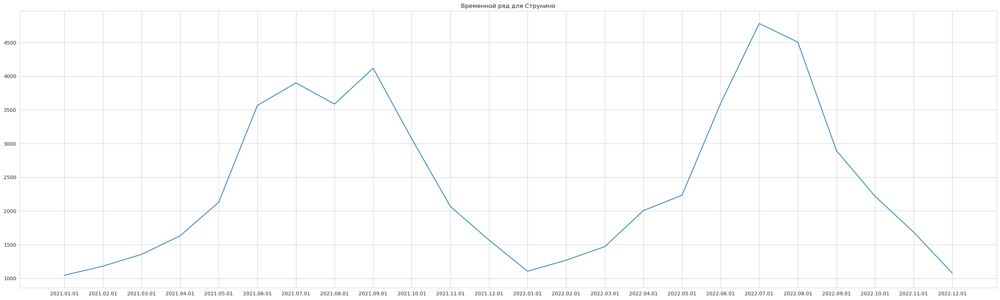

year  month   2021   2022          %  abs_diff
0         1   1385   1090 -21.299639      -295
1         2   1329   1256  -5.492852       -73
2         3   2238   1812 -19.034853      -426
3         4   4018   3889  -3.210553      -129
4         5   8166   5414 -33.700710     -2752
5         6  31265  24832 -20.575724     -6433
6         7  52983  60083  13.400525      7100
7         8  51248  60026  17.128473      8778
8         9  16612  19327  16.343607      2715
9        10   3060   2688 -12.156863      -372
10       11   1587   1344 -15.311909      -243
11       12    960    789 -17.812500      -171


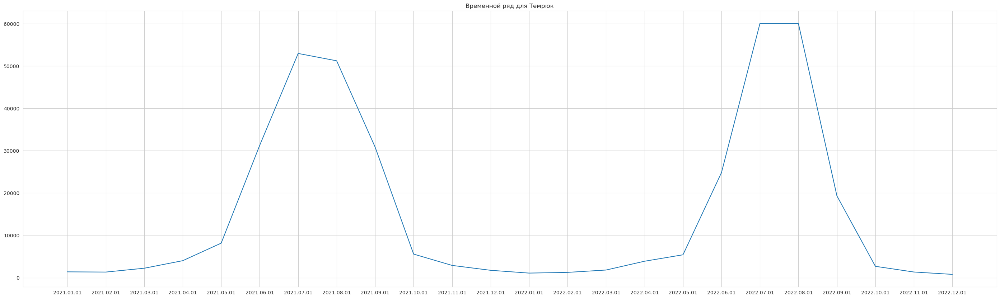

year  month   2021   2022          %  abs_diff
0         1   3070   3085   0.488599        15
1         2   3341   3058  -8.470518      -283
2         3   5397   5318  -1.463776       -79
3         4   6278   9253  47.387703      2975
4         5   9620  10202   6.049896       582
5         6  32154  31122  -3.209554     -1032
6         7  48554  51859   6.806854      3305
7         8  45592  53898  18.218108      8306
8         9  21355  28718  34.479045      7363
9        10   6115   8717  42.551104      2602
10       11   3042   4816  58.316897      1774
11       12   1664   2486  49.399038       822


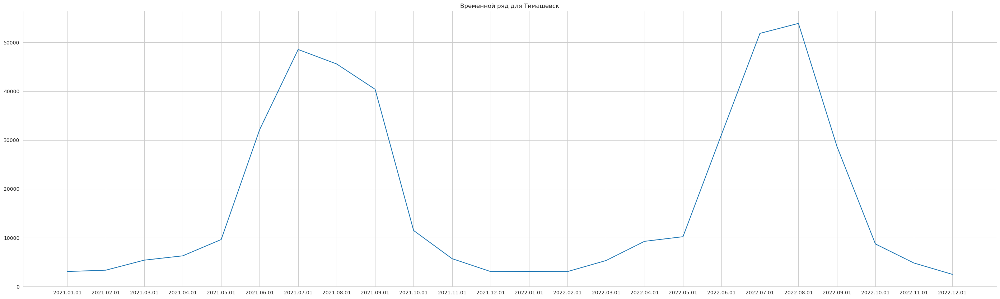

year  month   2021   2022          %  abs_diff
0         1   2761   2620  -5.106845      -141
1         2   2884   2567 -10.991678      -317
2         3   4179   3472 -16.917923      -707
3         4   4512   5196  15.159574       684
4         5   6210   6245   0.563607        35
5         6  17677  17158  -2.936019      -519
6         7  27291  31580  15.715804      4289
7         8  24317  31401  29.131883      7084
8         9   9611  15202  58.172927      5591
9        10   4652   5431  16.745486       779
10       11   2523   3154  25.009909       631
11       12   1643   1782   8.460134       139


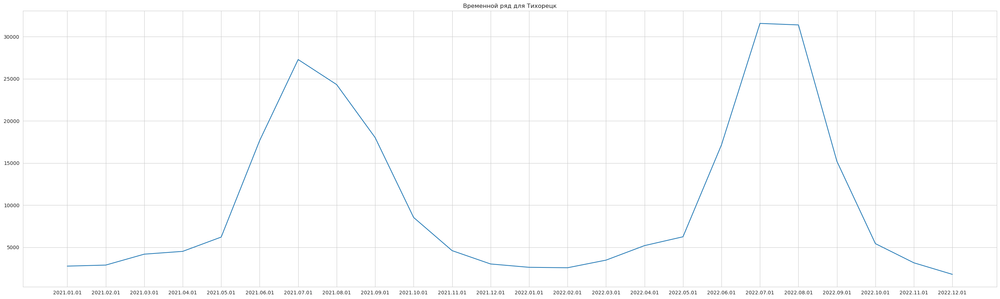

year  month   2021   2022          %  abs_diff
0         1   3096   2305 -25.549096      -791
1         2   3007   2366 -21.316927      -641
2         3   4284   3463 -19.164332      -821
3         4   4805   5974  24.328824      1169
4         5   8217   7439  -9.468176      -778
5         6  28289  28151  -0.487822      -138
6         7  42788  58667  37.110872     15879
7         8  42667  58889  38.020015     16222
8         9  21165  30726  45.173636      9561
9        10   5558   7125  28.193595      1567
10       11   2186   3323  52.012809      1137
11       12   1141   1538  34.794040       397


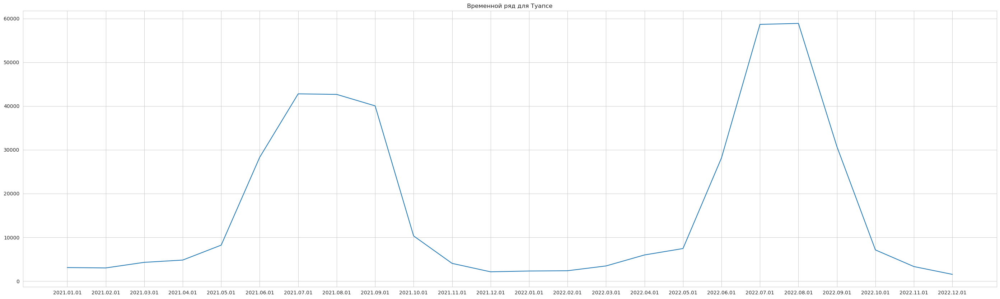

year  month  2021  2022          %  abs_diff
0         1  1446  1277 -11.687414      -169
1         2  1440  1454   0.972222        14
2         3  1761  1596  -9.369676      -165
3         4  2117  1882 -11.100614      -235
4         5  3074  2308 -24.918673      -766
5         6  4521  4419  -2.256138      -102
6         7  6757  9557  41.438508      2800
7         8  6792  9628  41.755006      2836
8         9  3583  3896   8.735696       313
9        10  2544  2663   4.677673       119
10       11  1794  1905   6.187291       111
11       12   868   804  -7.373272       -64


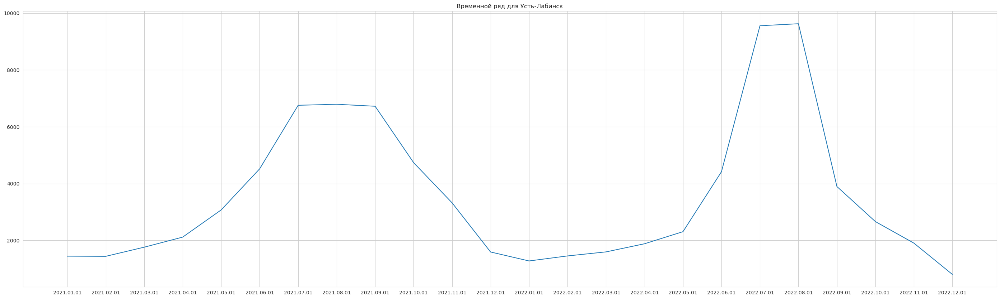

year  month  2021  2022          %  abs_diff
0         1   292   265  -9.246575       -27
1         2   221   246  11.312217        25
2         3   384   285 -25.781250       -99
3         4   540   504  -6.666667       -36
4         5   741   748   0.944669         7
5         6  2220  2394   7.837838       174
6         7  4086  6120  49.779736      2034
7         8  4275  6689  56.467836      2414
8         9  2169  2955  36.237898       786
9        10   378   540  42.857143       162
10       11   250   330  32.000000        80
11       12   205   190  -7.317073       -15


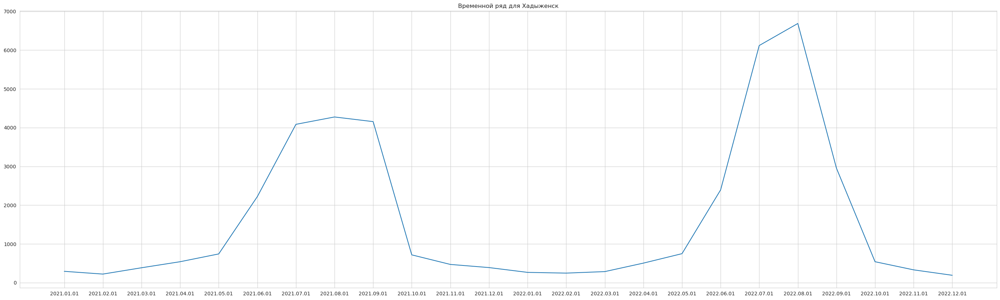

year  month  2021  2022           %  abs_diff
0         1   393   509   29.516539       116
1         2   482   707   46.680498       225
2         3   440   809   83.863636       369
3         4   564  1160  105.673759       596
4         5   769  1410   83.355007       641
5         6   937  1602   70.971185       665
6         7  1218  2443  100.574713      1225
7         8  1389  2086   50.179986       697
8         9   913  1391   52.354874       478
9        10   830  1391   67.590361       561
10       11   607  1008   66.062603       401
11       12   433   605   39.722864       172


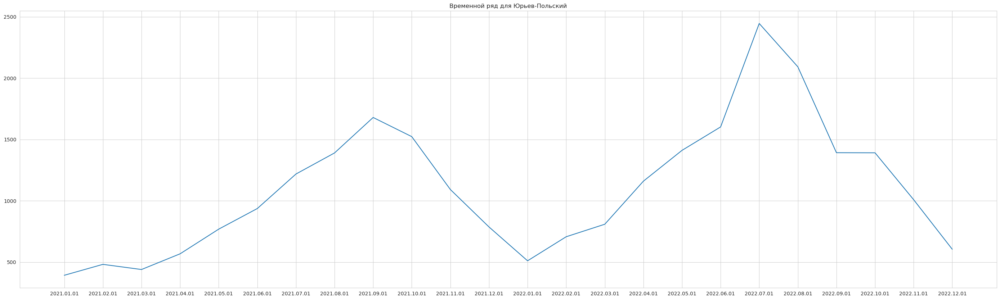

In [115]:
sns.set_style("whitegrid")

for city in cities:
    # создание сводной таблицы с количеством уникальных id по месяцам и годам
    pivot_table = pd.pivot_table(df[df['city'] == city], index='month', columns='year', values='id_hash', aggfunc=pd.Series.nunique)

    # добавление столбца с процентным изменением количества абонентов
    pivot_table['%'] = (pivot_table[2022] - pivot_table[2021]) / pivot_table[2021] * 100

    # вывод таблицы
    pivot_table['abs_diff'] = pivot_table[2022] - pivot_table[2021]
    pivot_table = pivot_table.reset_index(drop=False)
    print(pivot_table)
    fig = go.Figure()
    fig.add_trace(go.Bar(x=[calendar.month_name[i] for i in pivot_table['month']], y=pivot_table[2021], name='2021'))
    fig.add_trace(go.Bar(x=[calendar.month_name[i] for i in pivot_table['month']], y=pivot_table[2022], name='2022'))
    fig.add_trace(go.Scatter(x=[calendar.month_name[i] for i in pivot_table['month']], y=pivot_table[2021].rolling(window=3).mean(),
                             mode='lines', name='Тренд 2021', line_color='blue'))
    fig.add_trace(go.Scatter(x=[calendar.month_name[i] for i in pivot_table['month']], y=pivot_table[2022].rolling(window=3).mean(),
                             mode='lines', name='Тренд 2022', line_color='red'))
    fig.update_layout(title=f'Ежемесячное количество абонентов в {city} в 2021 и 2022 году',
                      xaxis_title='Месяц', yaxis_title='Количество абонентов')
    fig.show()
    
    figure(figsize=(35, 10), dpi=100)
    plt.plot(df[df['city'] == city].groupby('snap_date').id_hash.count())
    plt.title(f"Временной ряд для {city}")
    plt.show()


## Функции

In [116]:
def abon_unique_city(df, year):
    for city in cities:
        table = (df[df['city'] == city]
                 .groupby(['month', 'month_name'])
                 .agg({'id_hash':'nunique'})
                 .sort_values(by='month')
                 .reset_index())
        table['%'] = table['id_hash'] / table['id_hash'].sum() * 100
        table['%'] = table['%'].round(2)
        
        fig = px.bar(table,
               x='month_name', 
               y='id_hash',
               text_auto=True,
               title=f'Количество абонентов услуг ежемесячно в {city} в {year}',
               text='%')
        fig.show()

## Количество уникальных абонентов ежемесячно за 2021 и 2022

In [117]:
abon_unique(df_2021, 2021)
abon_unique(df_2021, 2022)

# ну а теперь СЕРЬЁЗНАЯ АНАЛИТИКА(я умею программировать)

![](https://i.pinimg.com/736x/f4/d2/96/f4d2961b652880be432fb9580891ed62.jpg)

In [118]:
df

,snap_date,id_hash,days,home_region,tourists_region,city,gender,age,mou,mou_out,...,snap_date_datetime,month,year,month_name,tourist_region_name,interests,top_service,volume_sum,dl_volume_sum,ul_volume_sum
0,2021.07.01,61fc25d86364a6a5d6e85319bcf7aef5,3,77,23,Абинск,1,47,33.512500,0.000000,...,2021-07-01,7,2021,July,Краснодарский край,NaN,NaN,NaN,NaN,NaN
1,2021.07.01,ce99dc79821948d73c0d2ab2d9eee25d,5,34,23,Абинск,1,36,326.655000,173.512500,...,2021-07-01,7,2021,July,Краснодарский край,NaN,NaN,NaN,NaN,NaN
2,2021.07.01,02db2c7539fb8a552f48b42e3096151f,11,72,23,Абинск,2,34,165.549990,39.917496,...,2021-07-01,7,2021,July,Краснодарский край,NaN,NaN,NaN,NaN,NaN
3,2021.07.01,d3fd4dd683cf977fabbf8804d4006dfe,1,7,23,Абинск,2,33,1355.112500,469.910000,...,2021-07-01,7,2021,July,Краснодарский край,NaN,NaN,NaN,NaN,NaN
4,2021.07.01,e3454dd0773f453a244cd6ba49711cdd,9,69,23,Абинск,3,36,147.069990,39.655000,...,2021-07-01,7,2021,July,Краснодарский край,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6118307,2022.12.01,0ac84bb0b3bcbf534bb976381cc634cb,15,37,33,Юрьев-Польский,2,32,560.035030,365.942500,...,2022-12-01,12,2022,December,Владимирская обл.,"[Билеты, отели, путевки, Кулинария и рецепты, ...",[angrybirds2],171613760.0,158015136.0,13598624.0
6118308,2022.12.01,bb58f53c013a9e51f6f99323a5eed776,17,77,33,Юрьев-Польский,3,0,4.550001,4.550001,...,2022-12-01,12,2022,December,Владимирская обл.,NaN,[dns],1385133.8,473577.3,911559.6
6118309,2022.12.01,c9c0937148b2f77fbaca3166feb4dd12,10,37,33,Юрьев-Польский,3,41,495.372530,199.430010,...,2022-12-01,12,2022,December,Владимирская обл.,"[Автозапчасти,автотовары, Социальные сети, Нав...",[vkontakte],288437152.0,251422704.0,37014448.0
6118310,2022.12.01,c0b90318610a00d8e710a9e80c96b9cb,15,37,33,Юрьев-Польский,1,27,4.742499,4.742499,...,2022-12-01,12,2022,December,Владимирская обл.,"[Автозапчасти,автотовары, Общественный транспо...",[google],93925888.0,68593376.0,25332512.0


# Построим ряды описывающие среднее использование связи и интернета в городах на каждый месяц

Так же добавим на ряды праздники

In [119]:
import holidays



holidays_m = set([date[0].month for date in holidays.RU(years=[2022]).items()])
df['is_holiday'] = df.month.isin(holidays_m)
h_dates = df[df['is_holiday'] == True].snap_date.unique()

Графики для Abinsk


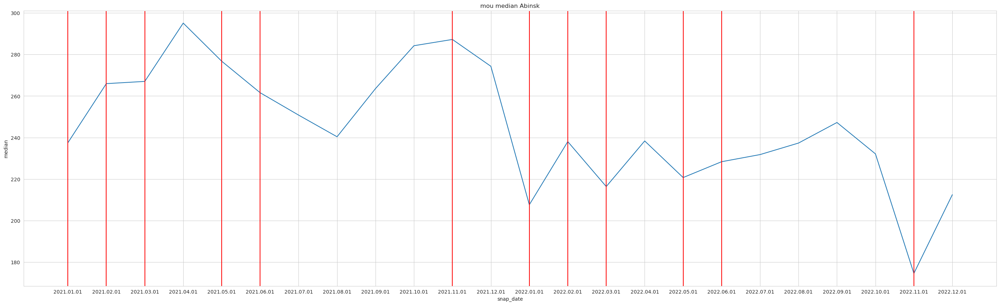

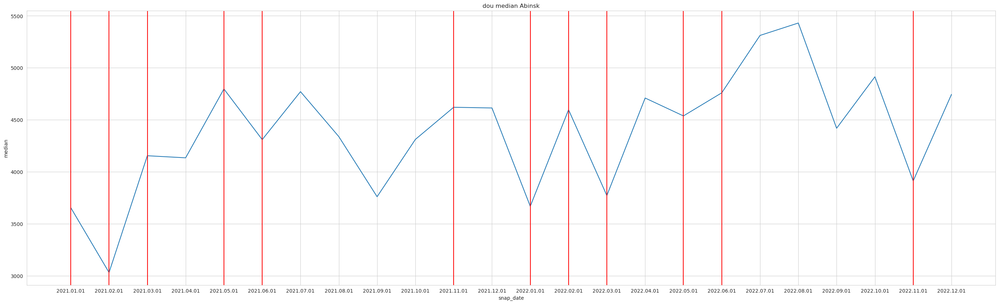

Графики для Alexandrov


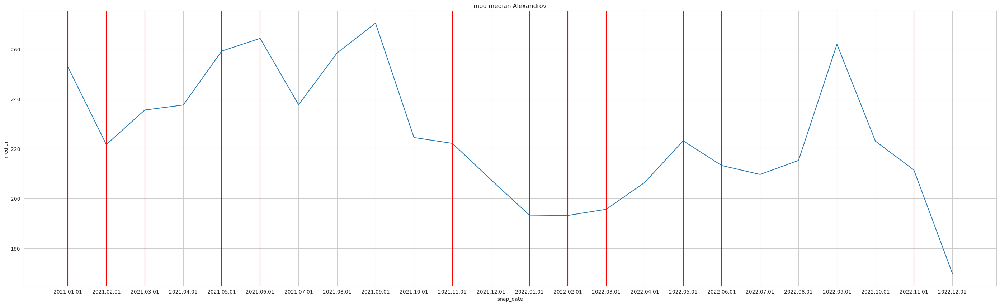

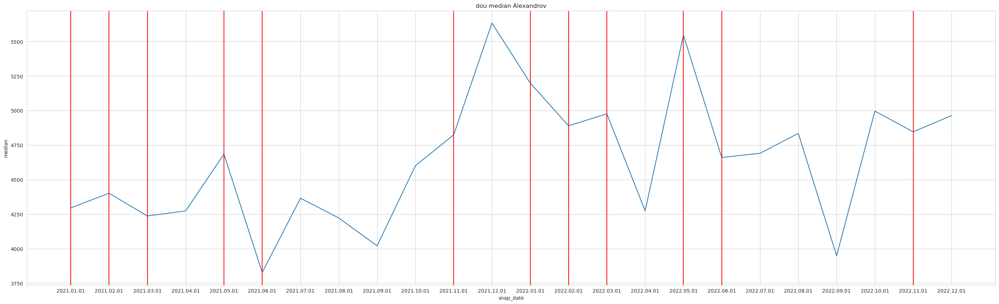

Графики для Armavir


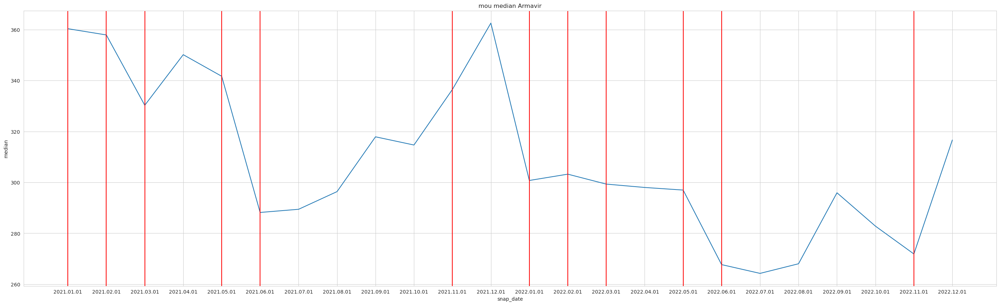

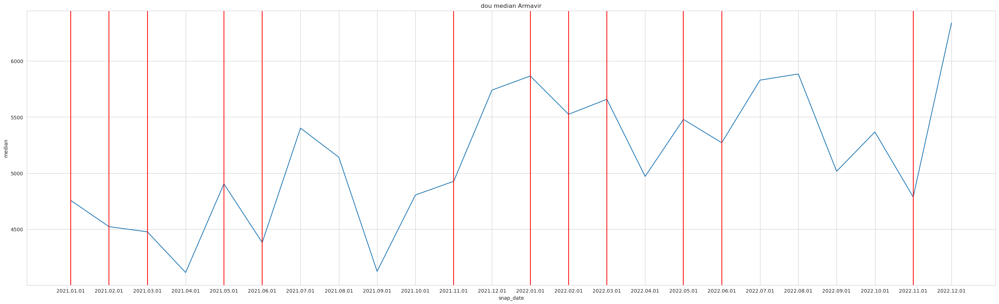

Графики для Baikalsk


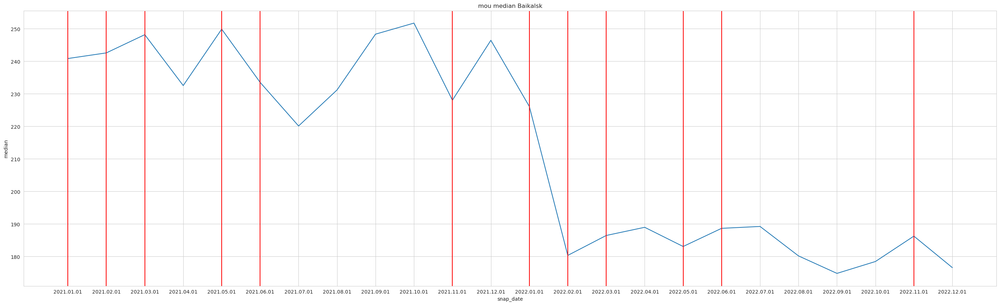

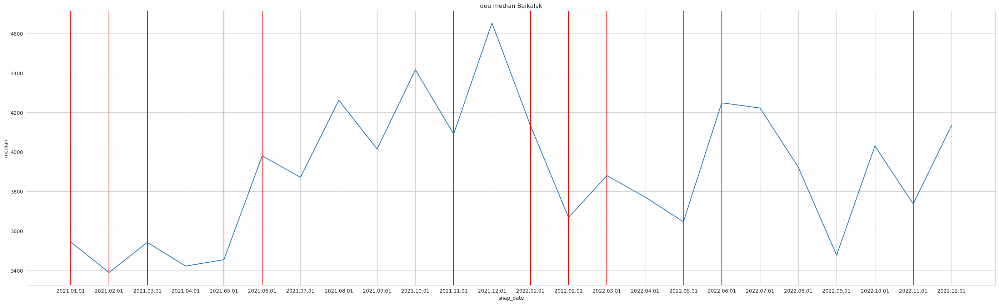

Графики для Belorechensk


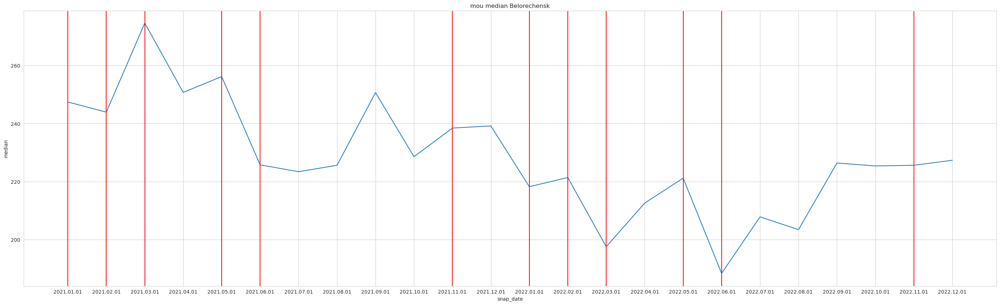

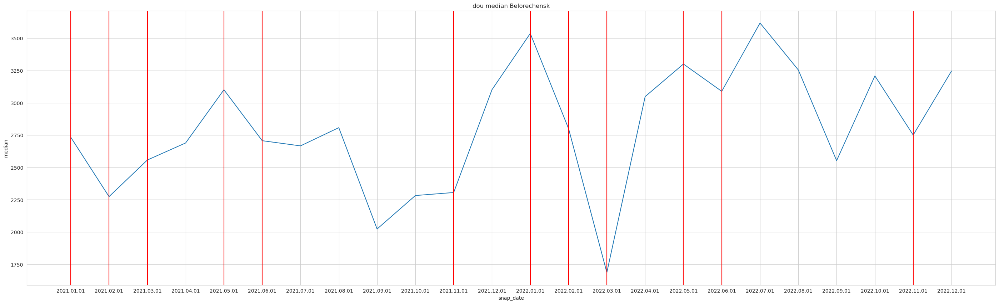

Графики для Vyazniki


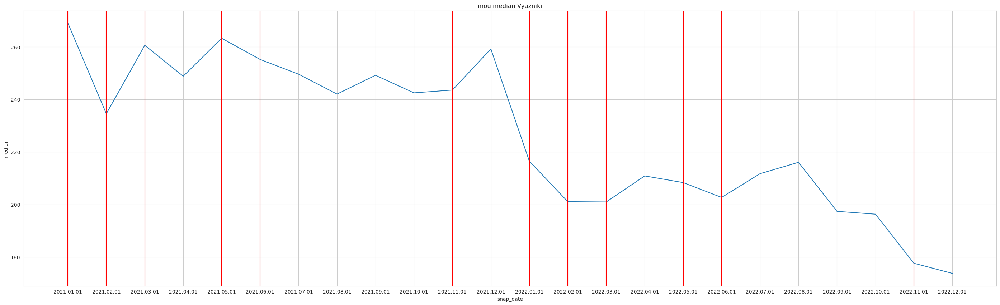

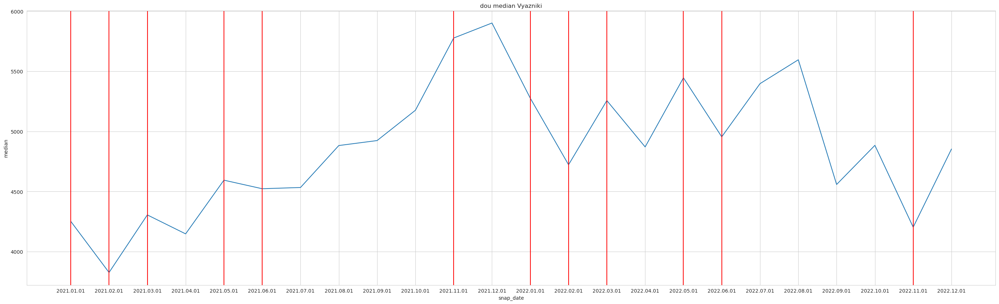

Графики для Gorno-Altaisk


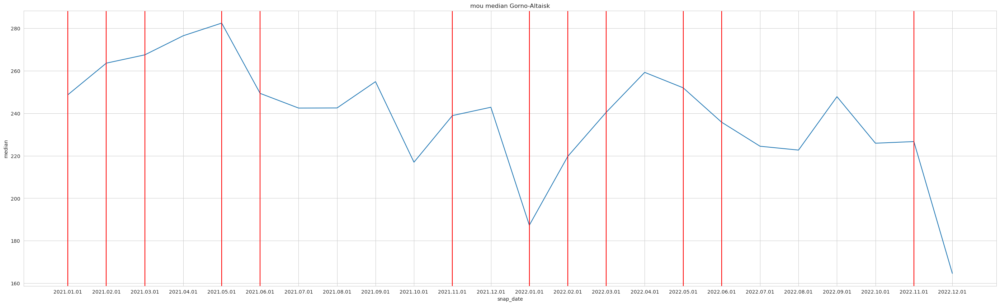

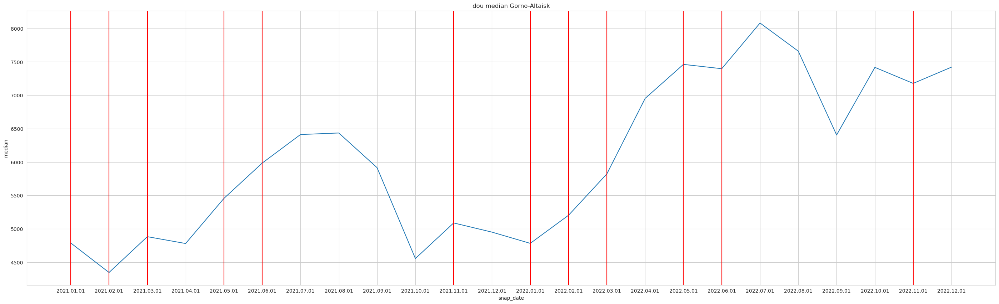

Графики для Gorodishchi


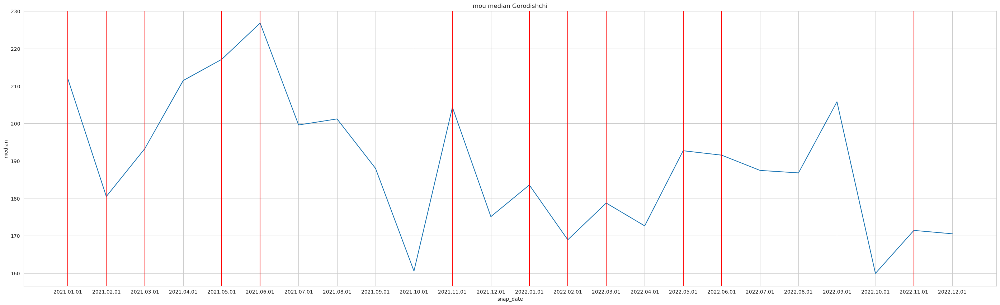

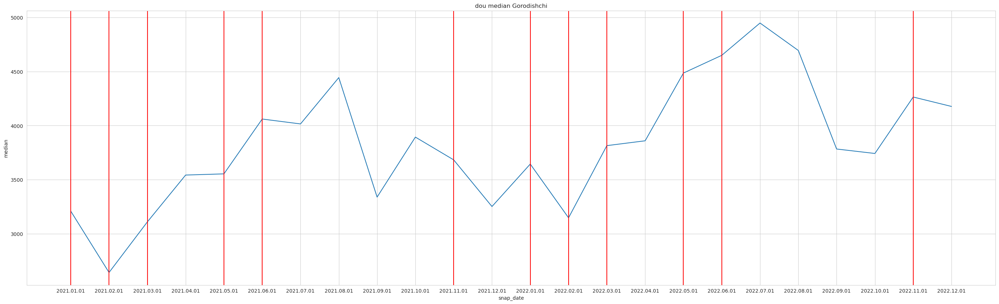

Графики для Gorokhovets


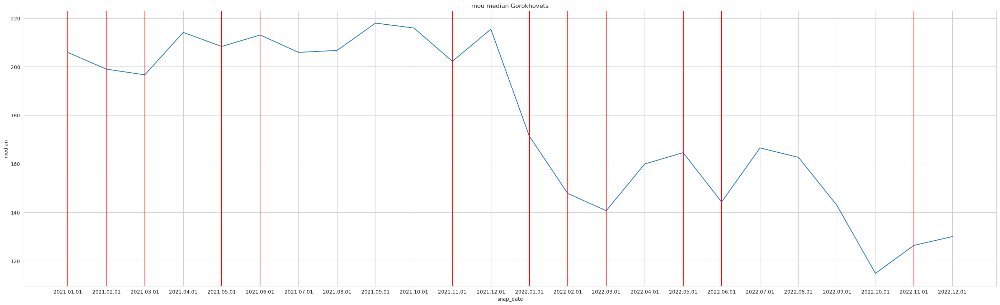

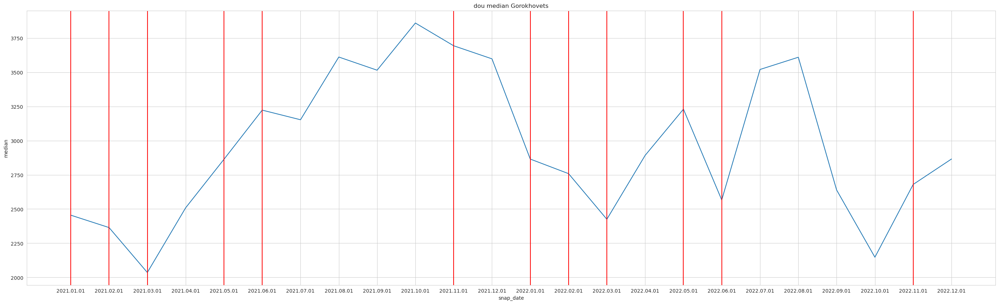

Графики для Hot Key


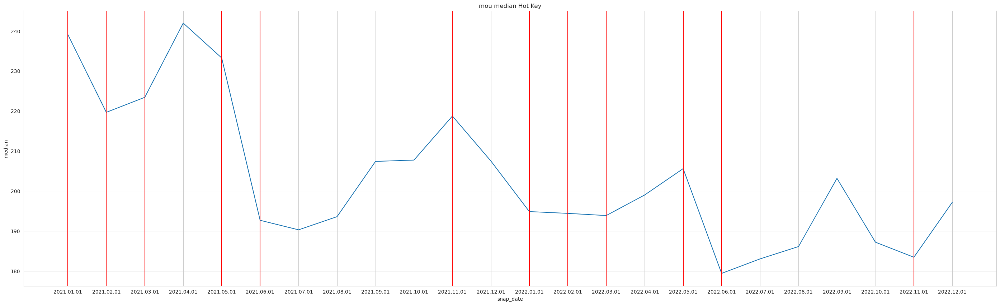

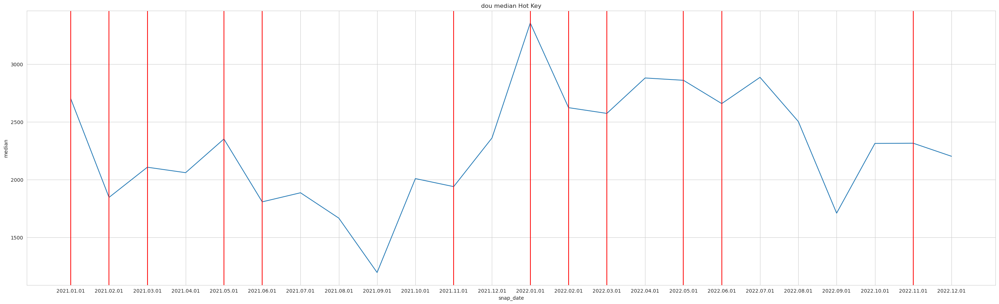

Графики для Gulkevichi


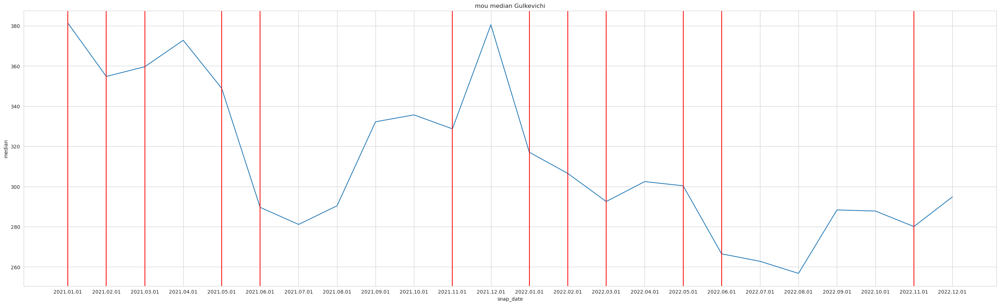

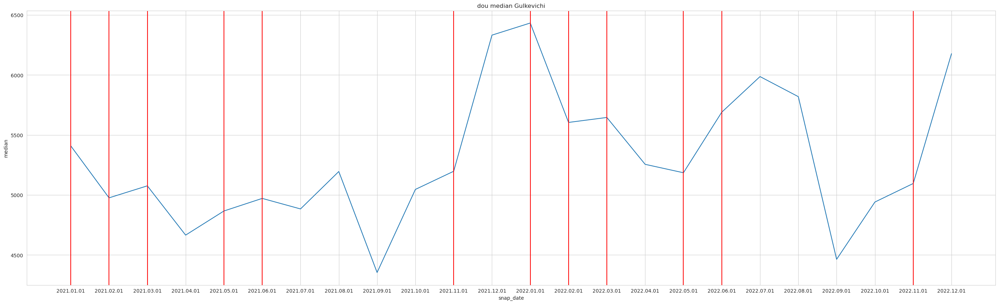

Графики для Yeisk


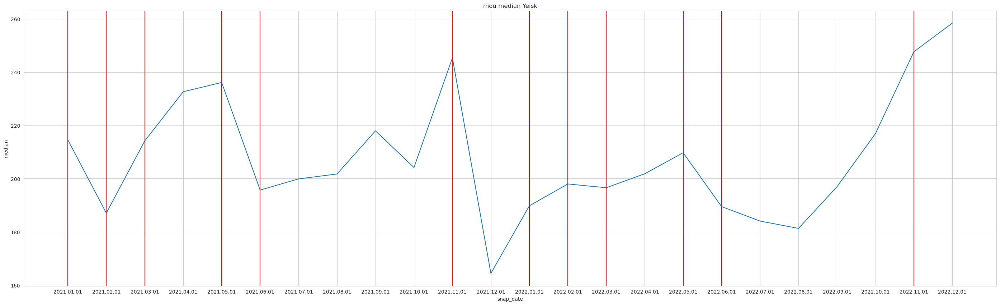

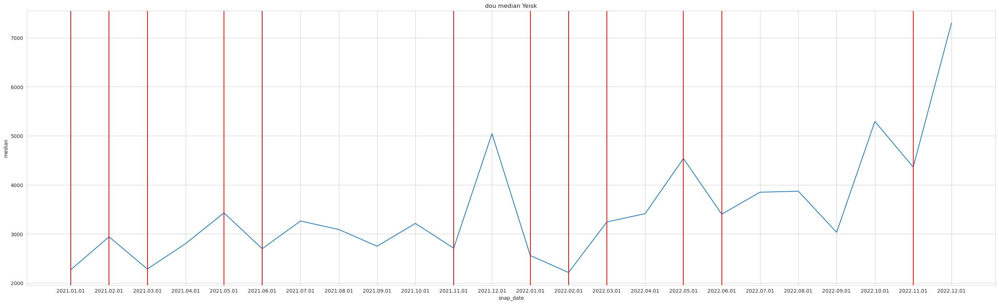

Графики для Kovrov


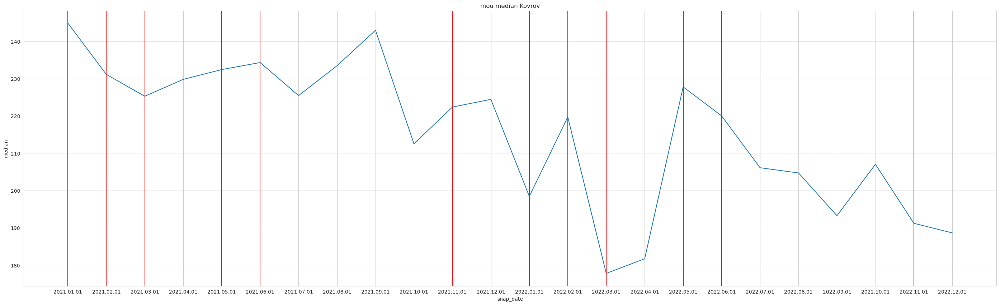

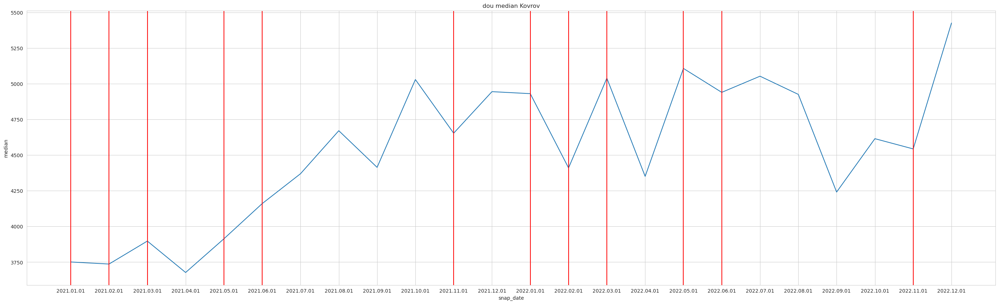

Графики для Kolchugino


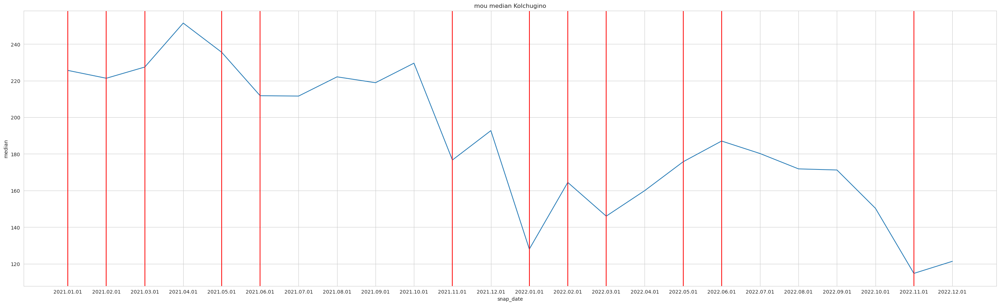

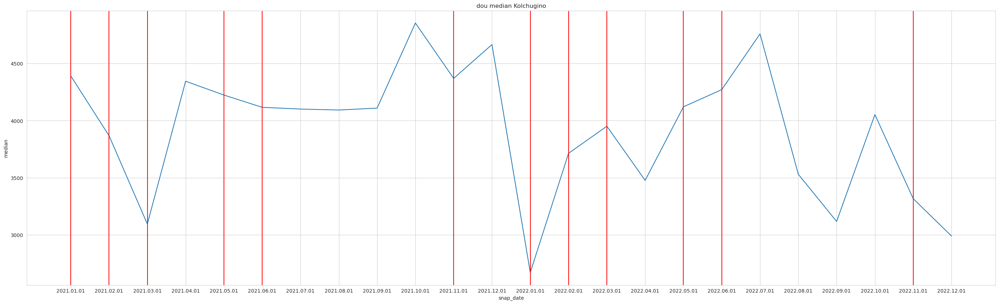

Графики для Korenovsk


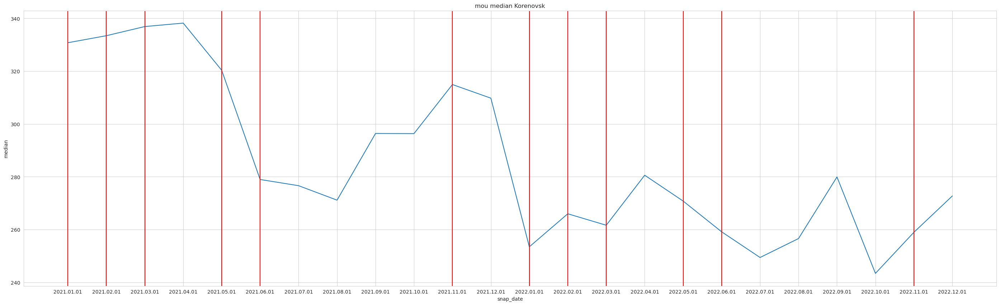

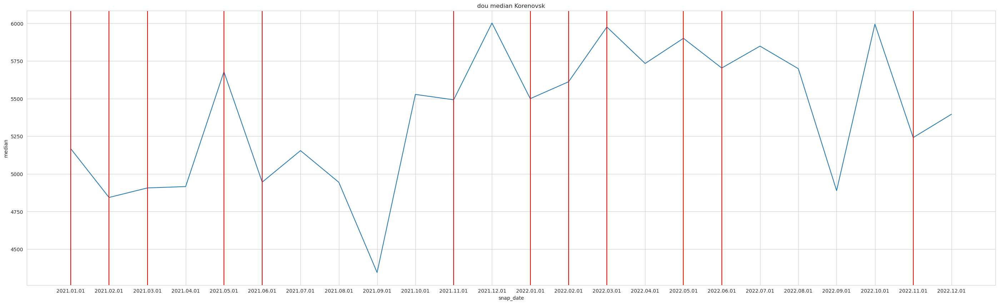

Графики для Kropotkin


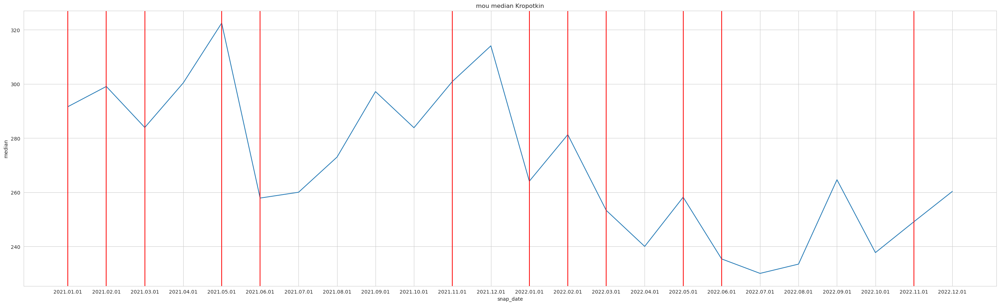

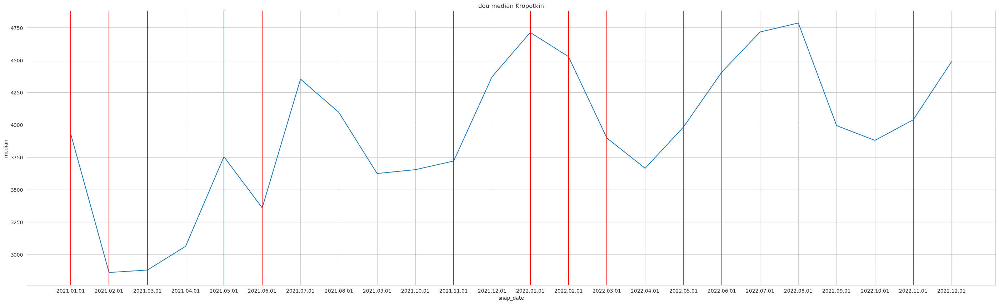

Графики для Krymsk


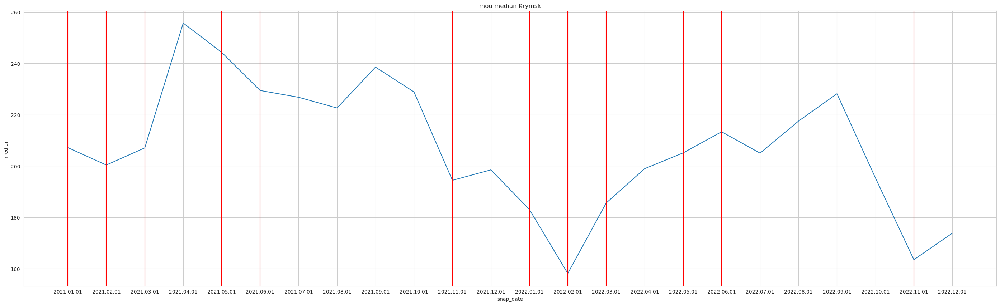

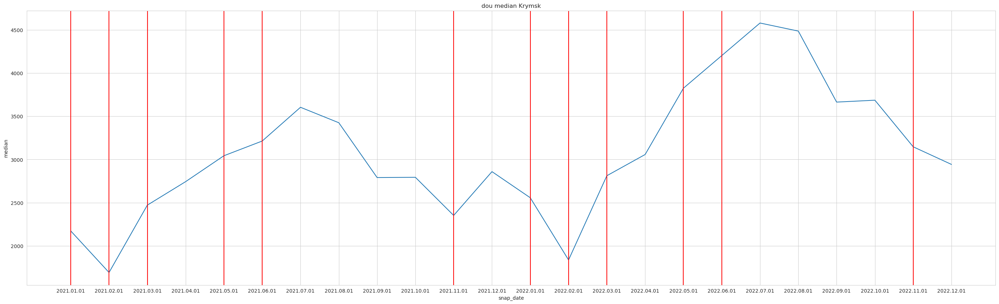

Графики для Kurganinsk


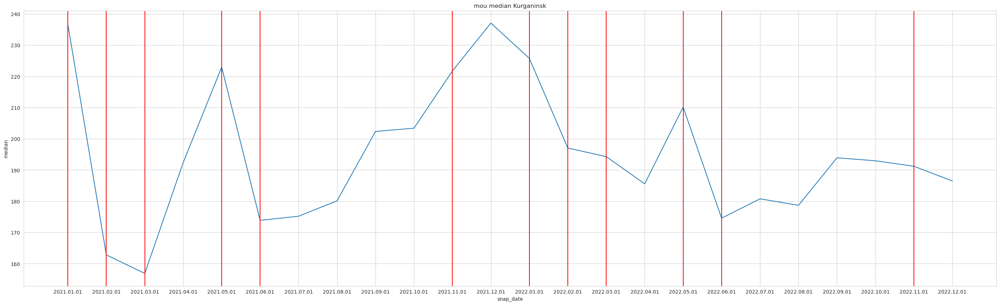

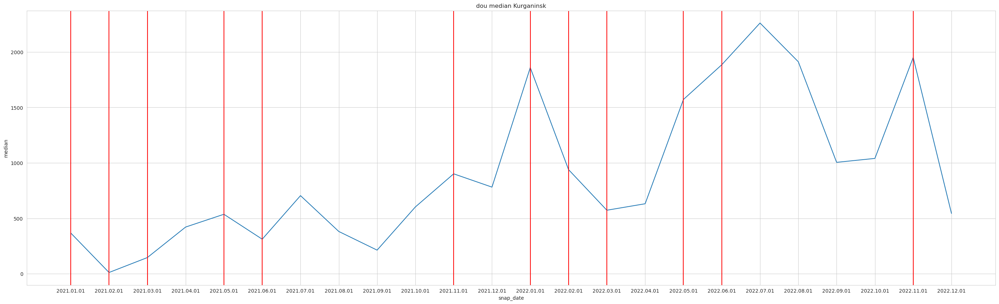

Графики для Labinsk


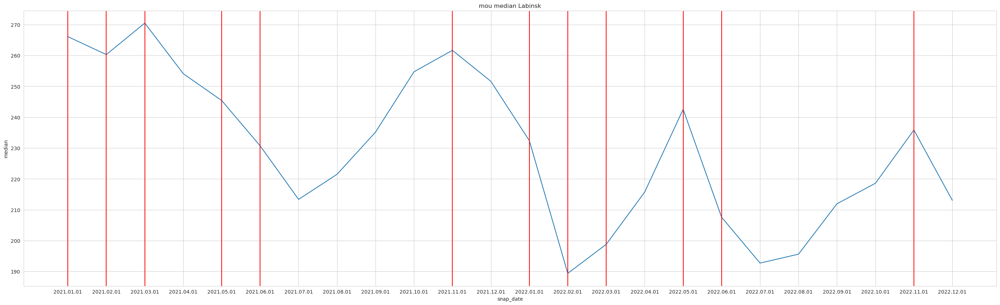

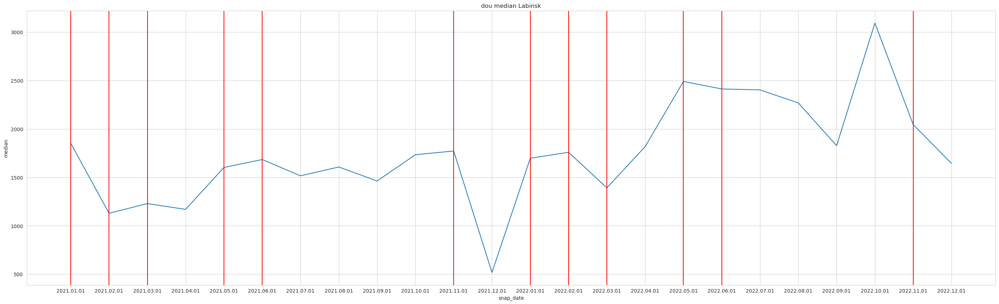

Графики для Lakinsk


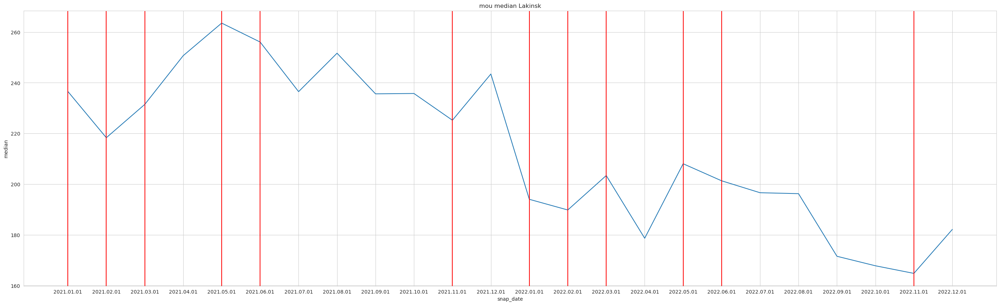

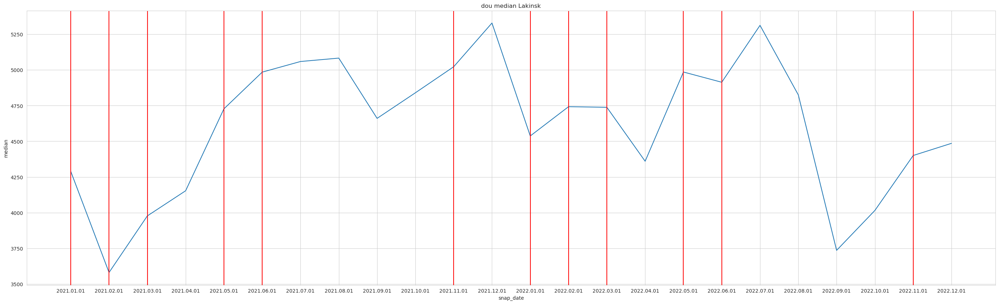

Графики для Melenki


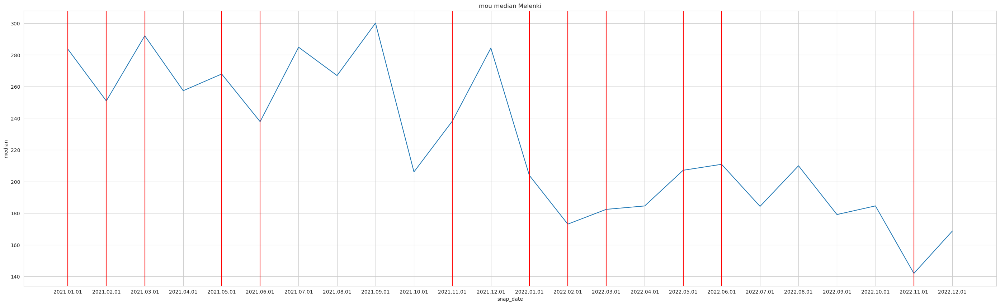

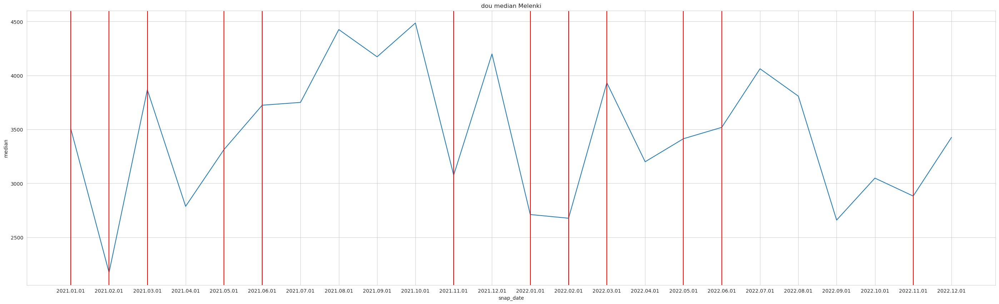

Графики для Murom


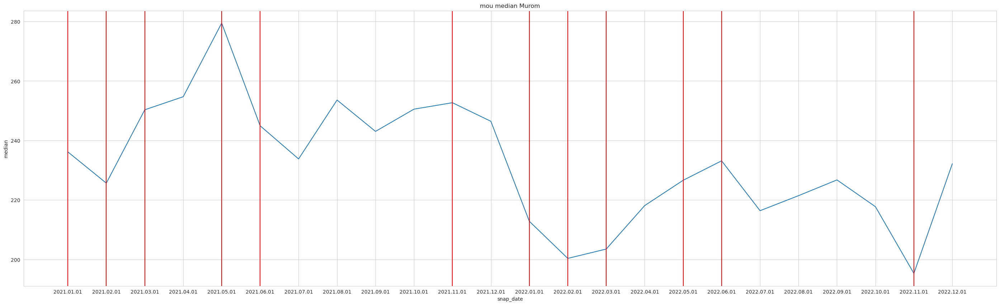

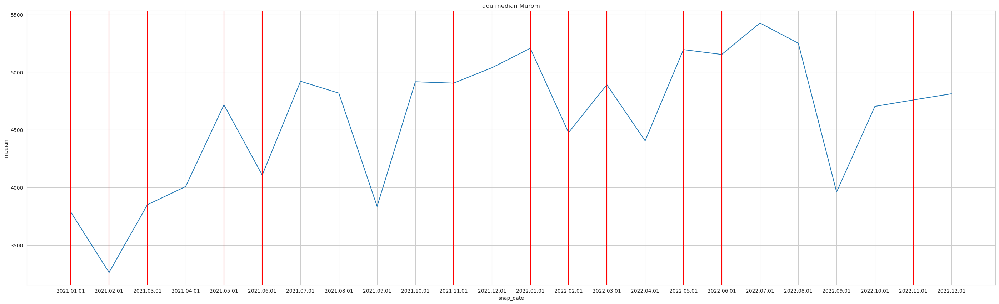

Графики для Novokubansk


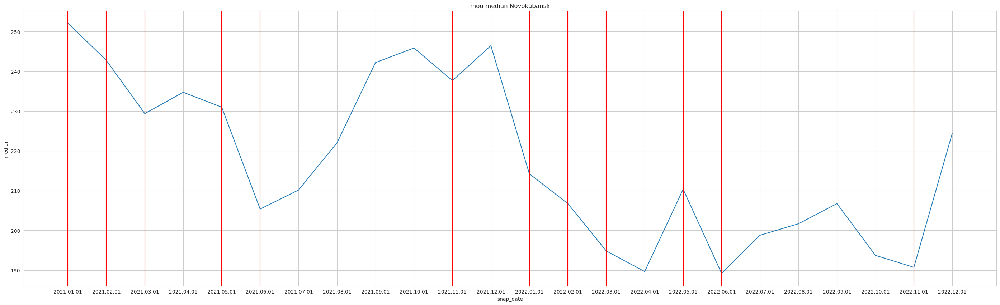

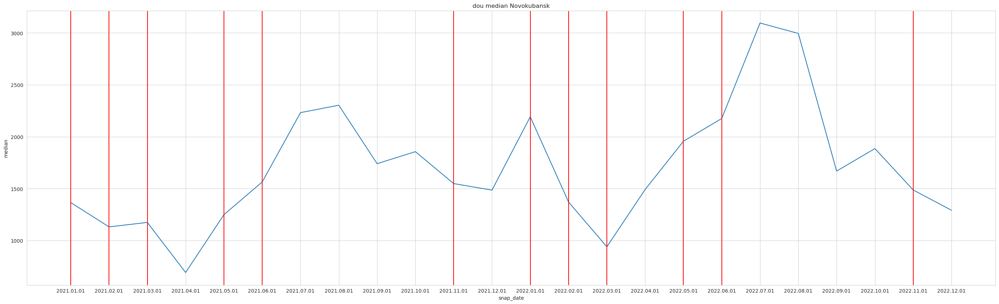

Графики для Petushki


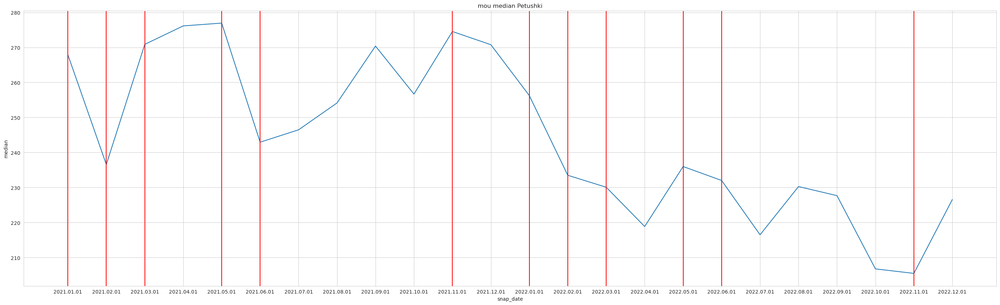

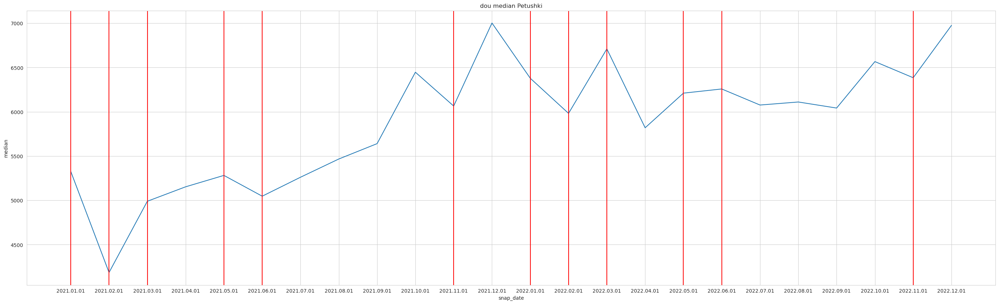

Графики для Pokrov


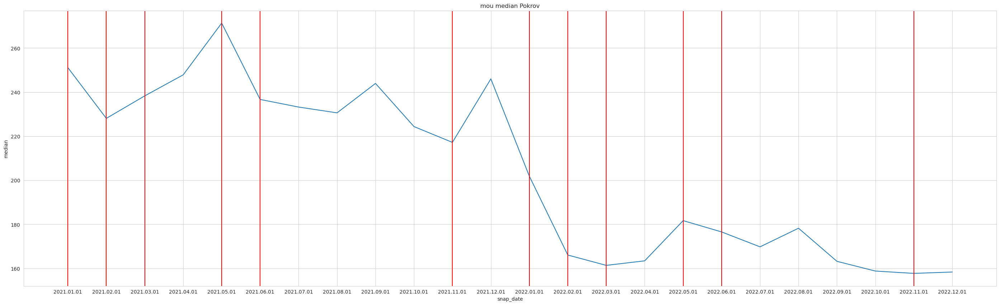

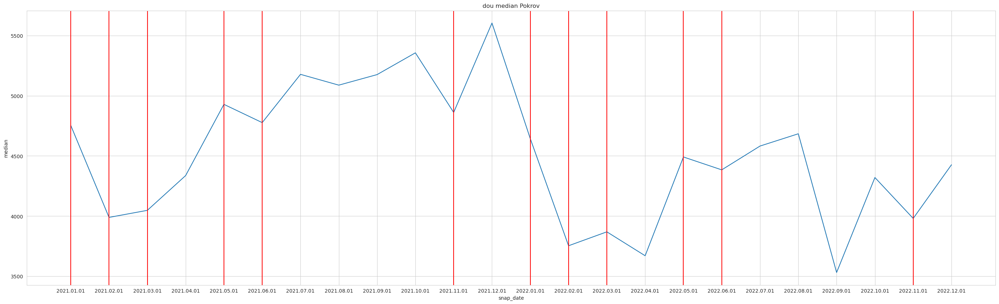

Графики для Sirius


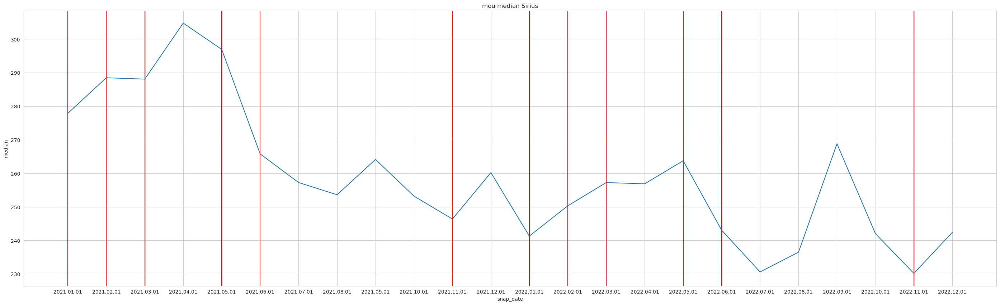

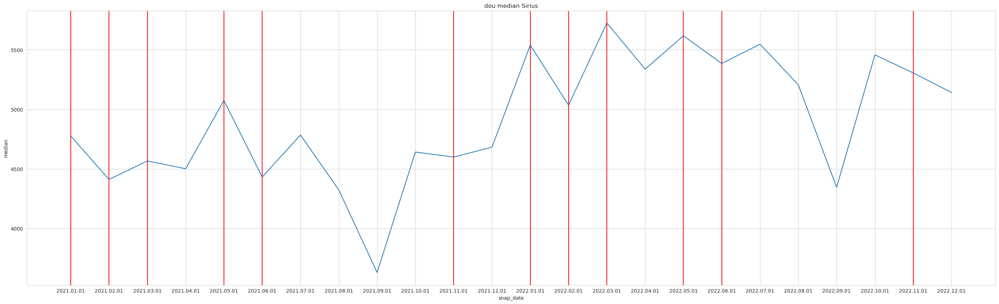

Графики для Slavyansk-on-Kuban


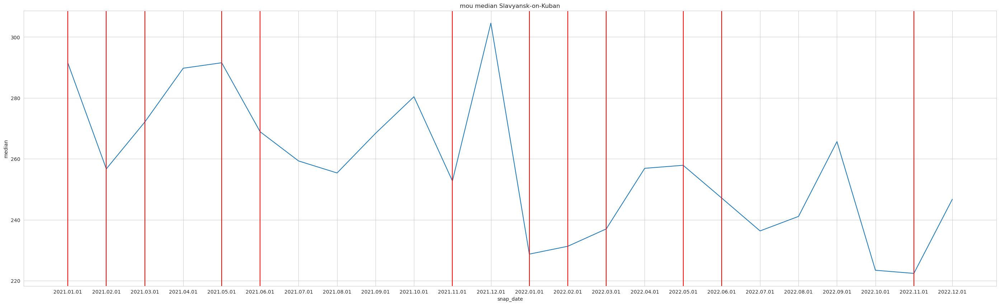

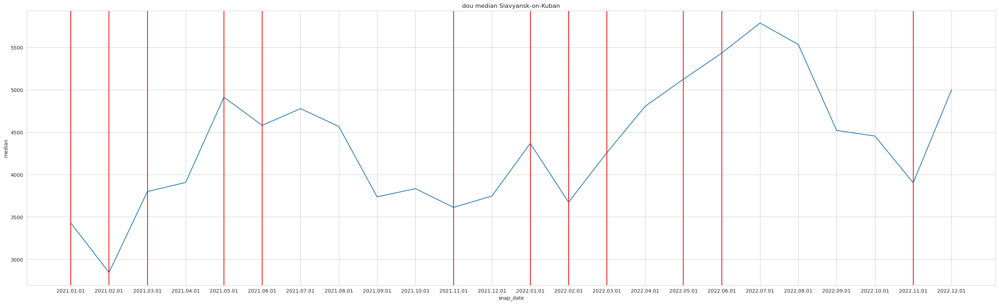

Графики для Sortavala


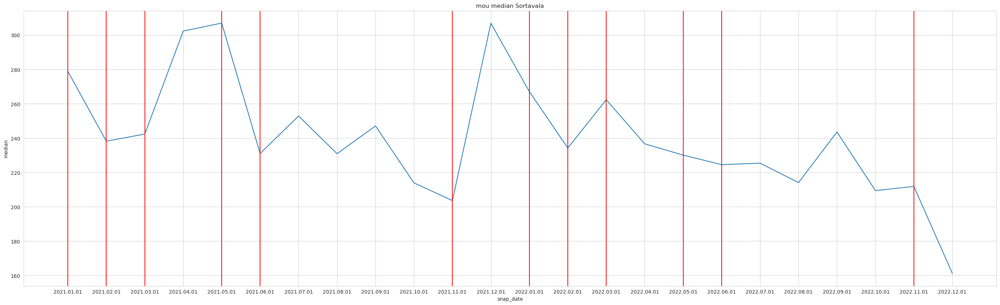

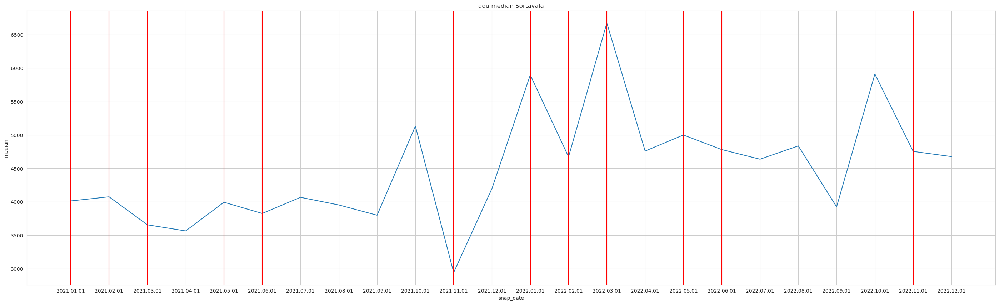

Графики для Strunino


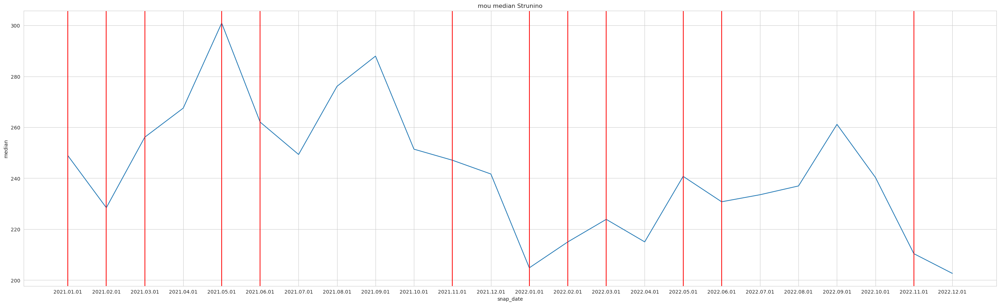

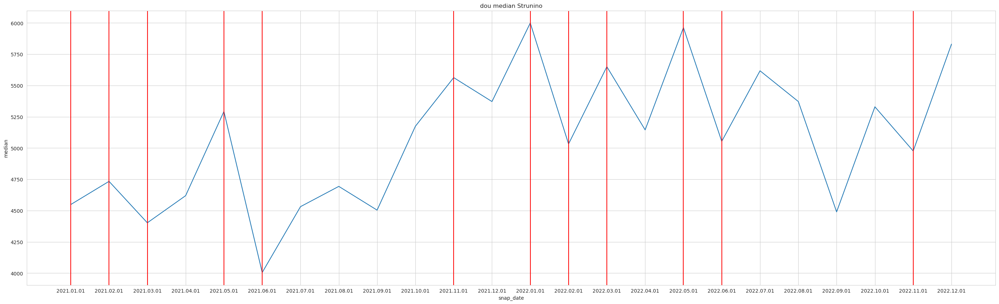

Графики для Temryuk


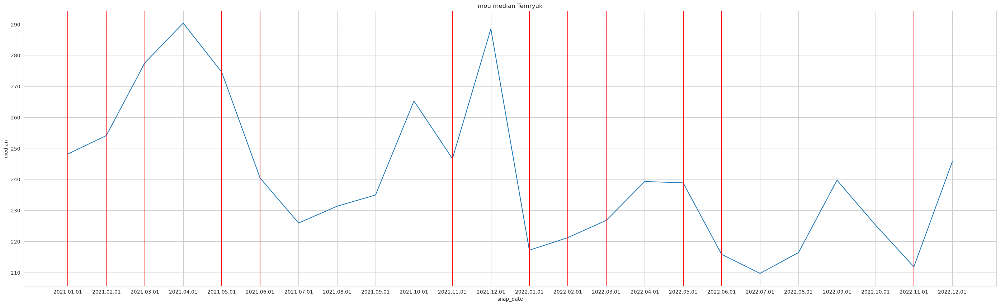

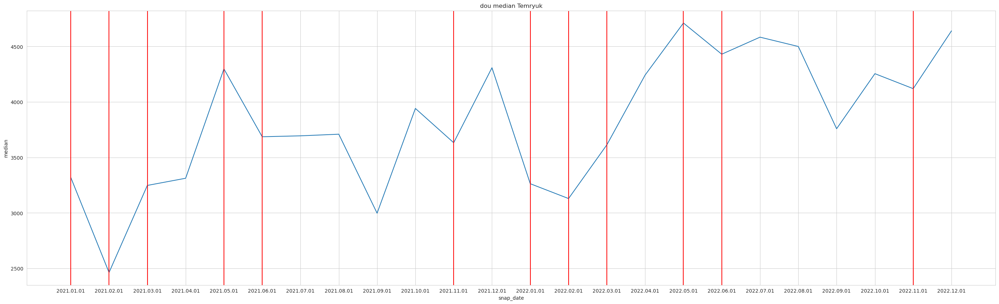

Графики для Timashevsk


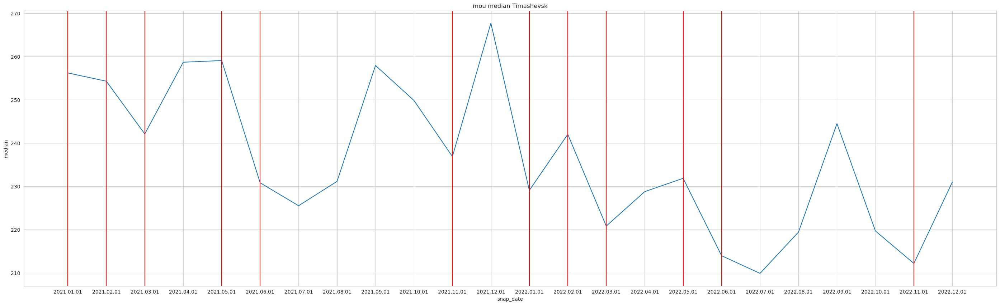

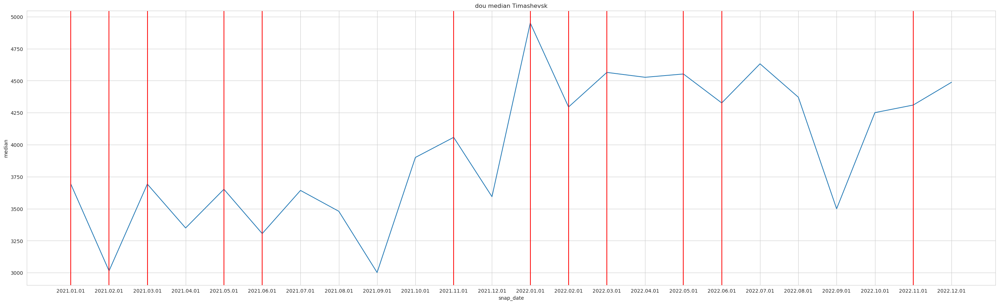

Графики для Tikhoretsk


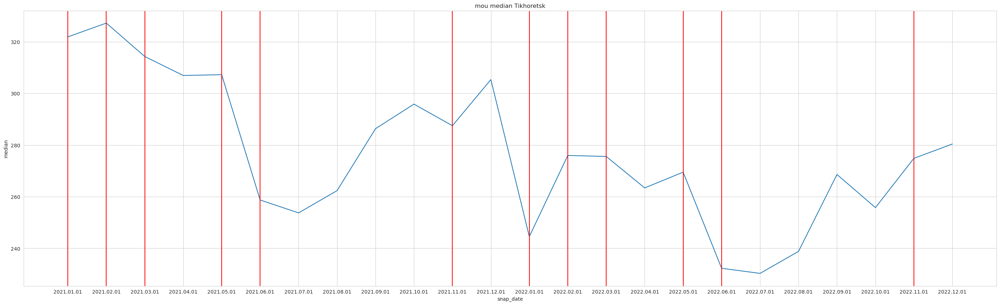

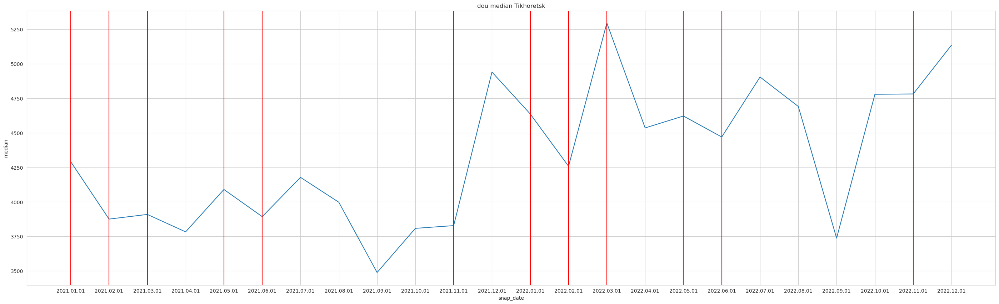

Графики для Tuapse


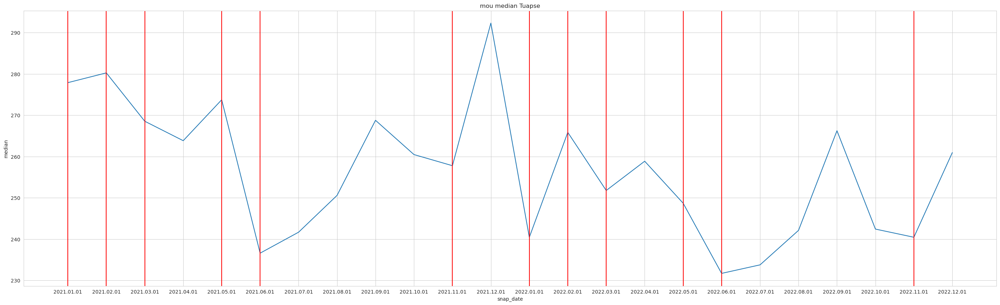

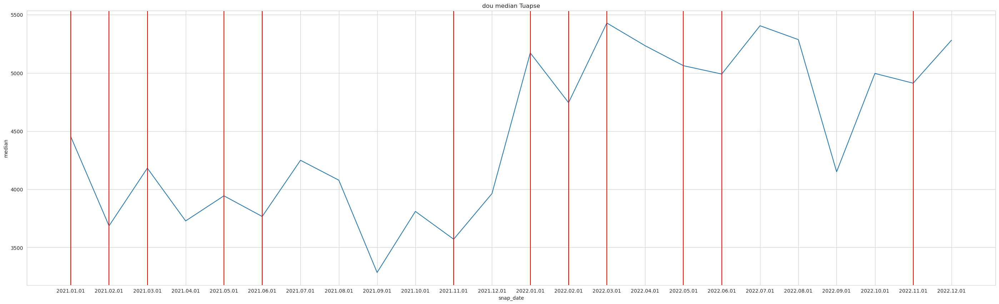

Графики для Ust-Labinsk


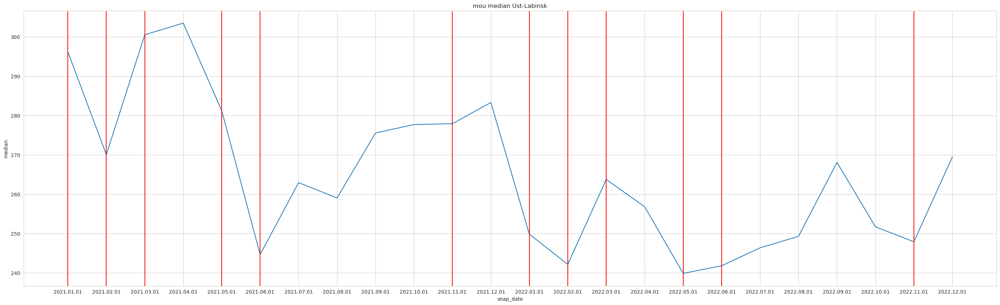

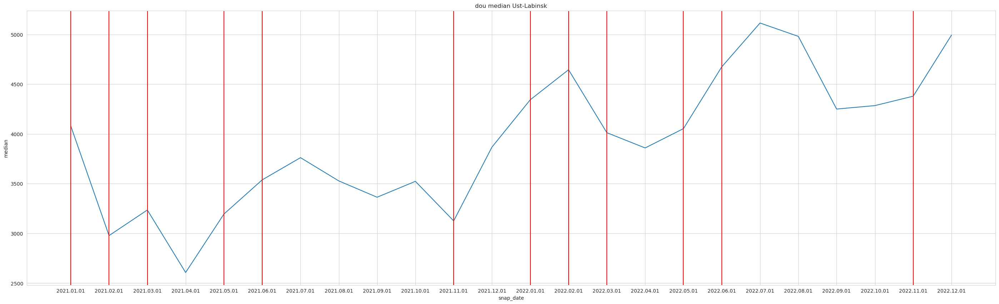

Графики для Khadyzhensk


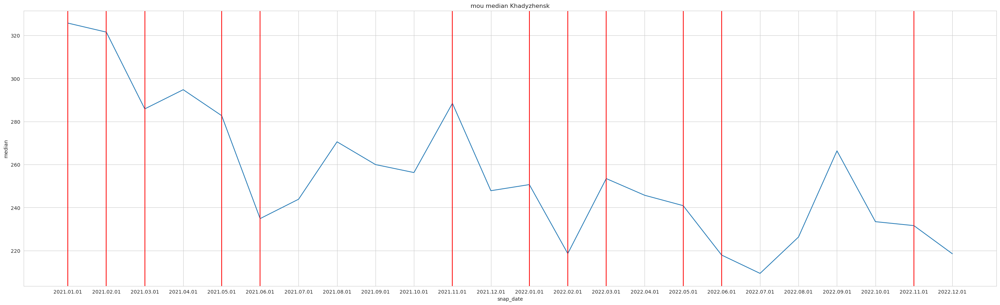

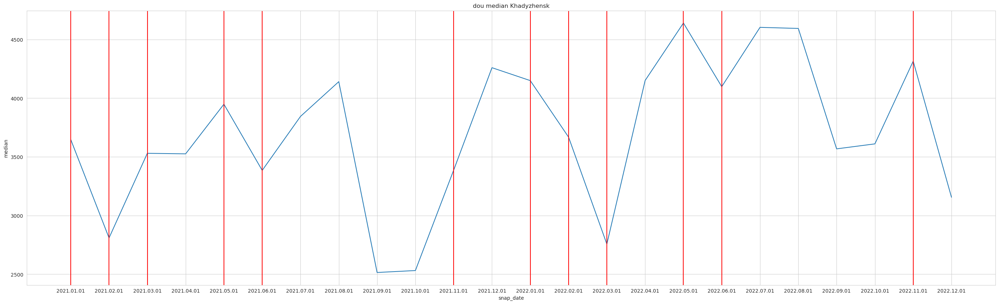

Графики для Yuriev-Polsky


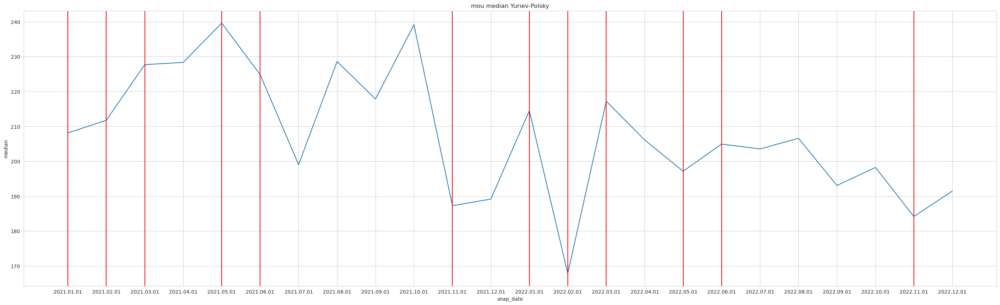

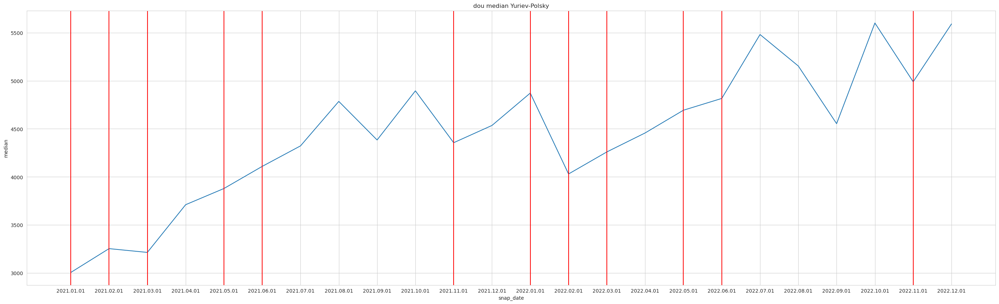

In [120]:
 def get_mou_mou_out_dou_plots_for_city(df, city): 
    aggregate_funcs = ['mean', 'median', 'sum']
    gr_df = df.groupby('snap_date').agg(
        {
        'mou': aggregate_funcs,
        'mou_out': aggregate_funcs,
        'dou' : aggregate_funcs
        }
    )
    print(f"Графики для {city}")
    figure(figsize=(35, 10), dpi=100)
    sns.lineplot(y=gr_df['mou']['median'], x=gr_df.index).set(title=f'mou median {city}')
    for i in h_dates:
        plt.axvline(x = i, color = 'red')
    plt.show()
#     figure(figsize=(35, 10), dpi=100)
#     sns.lineplot(y=gr_df['mou_out']['median'], x=gr_df.index).set(title=f'mou_out median for {city}')
#     plt.show()
    figure(figsize=(35, 10), dpi=100)
    sns.lineplot(y=gr_df['dou']['median'], x=gr_df.index).set(title=f'dou median {city}')
    for i in h_dates:
        plt.axvline(x = i, color = 'red')
    plt.show()
    


for city in eng_cities:
    get_mou_mou_out_dou_plots_for_city(globals()[city], city)

На всех рядах наблюдаются следующие тенденции: все ряды связанные с звонками имеют тренды на снижение, когда ряды связанные с интернет-трафиком в свою очередь имеют тренд на рост.

Никакой зависимости между праздниками и использованием мобильными услугами обнаружено не было.

Ряды с аггрегированной суммой на звонках и интернете выводить нет смысла, потому что они дублируют с другим масштабом графики связанные с числом уникальных пользователей на месяц(что впринципе очевидно - чем больше пользователей, тем больше сумма)

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


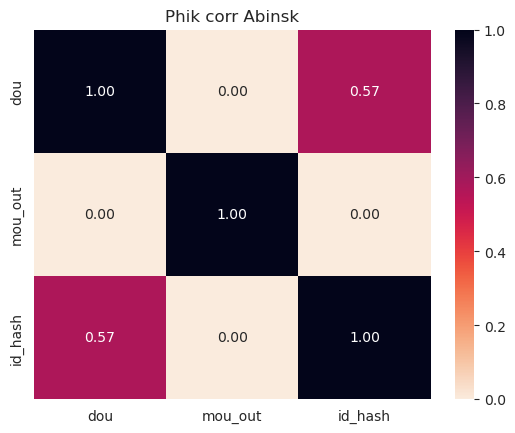

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


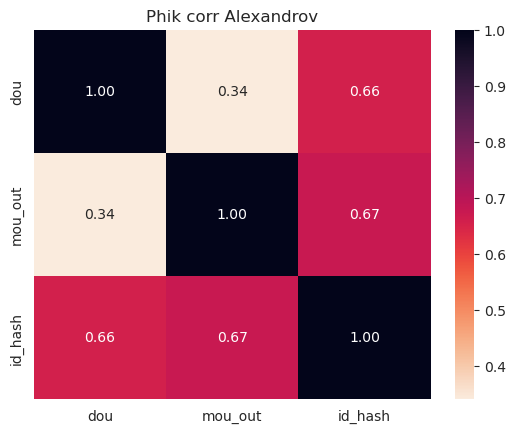

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


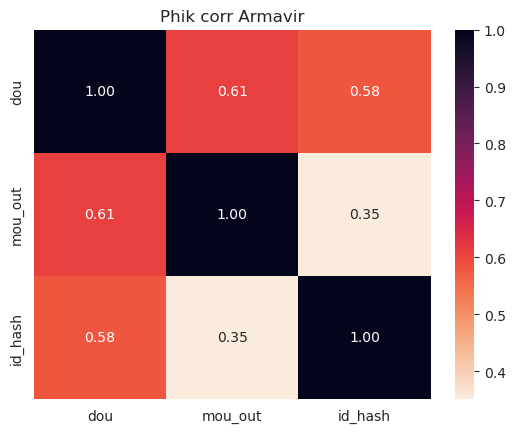

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


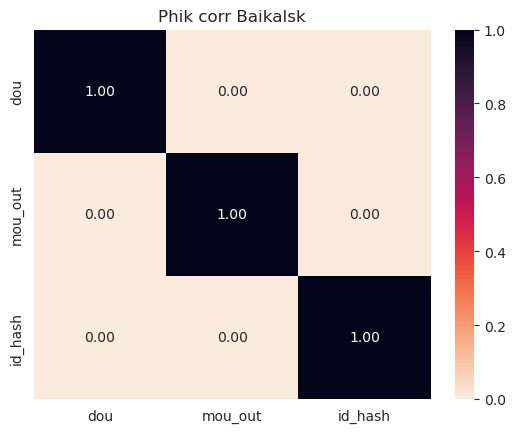

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


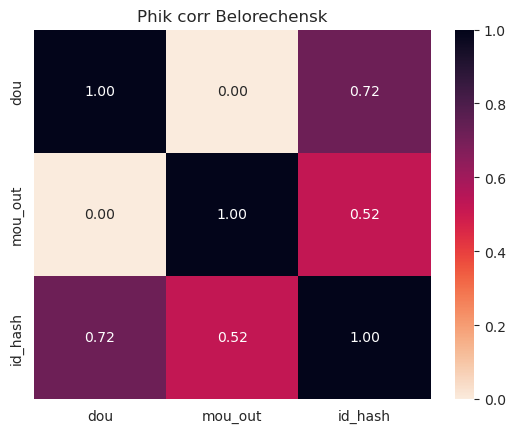

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


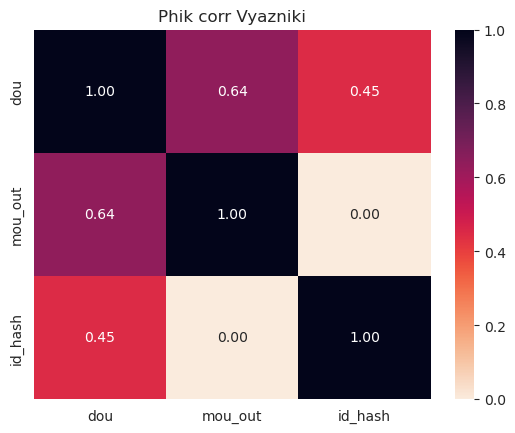

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


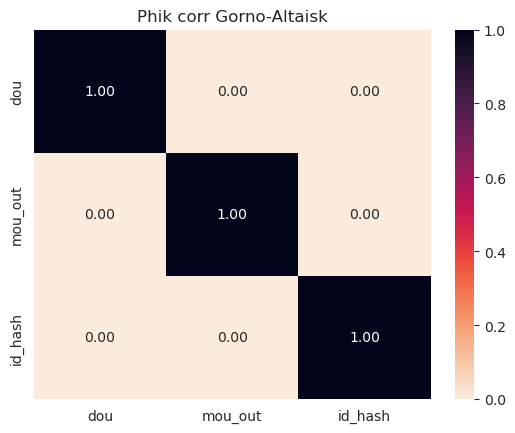

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


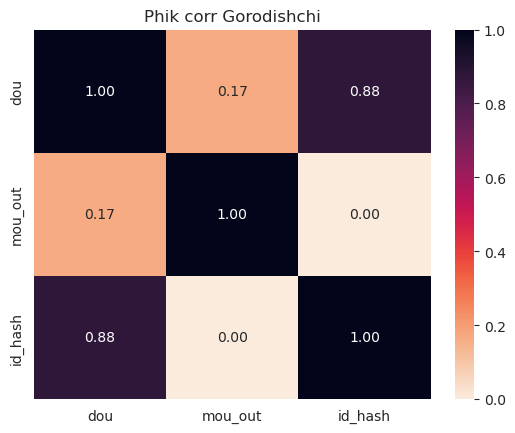

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


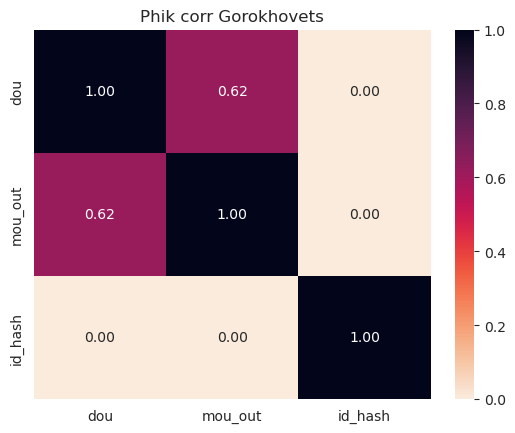

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


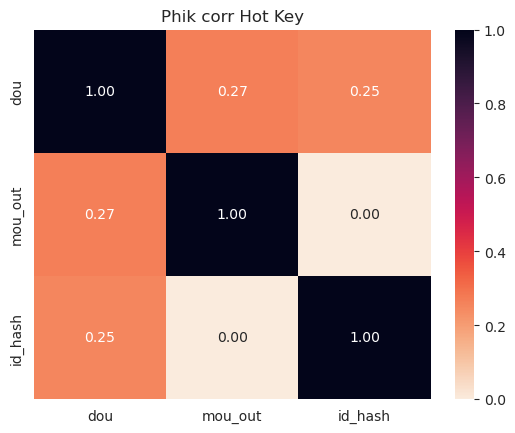

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


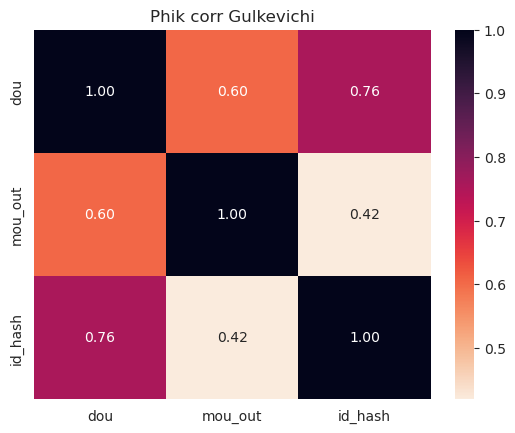

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


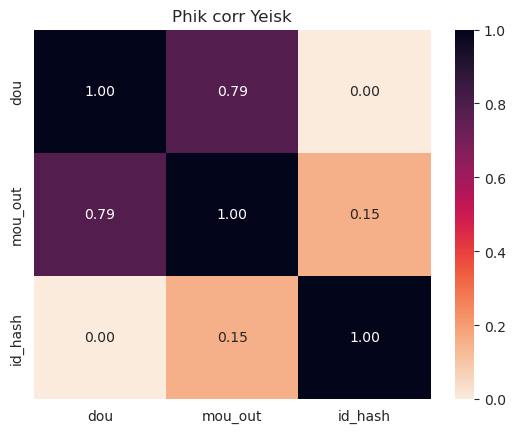

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


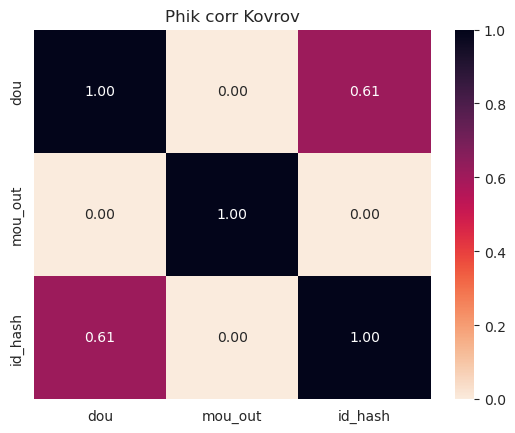

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


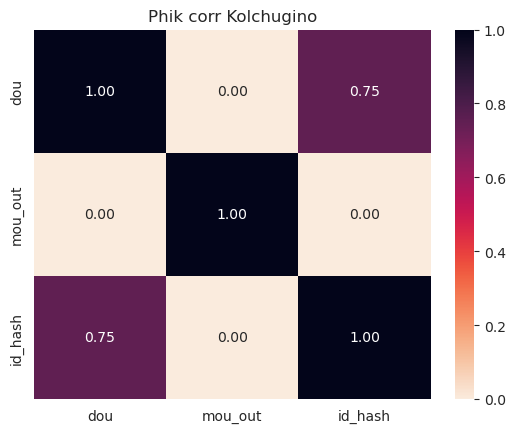

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


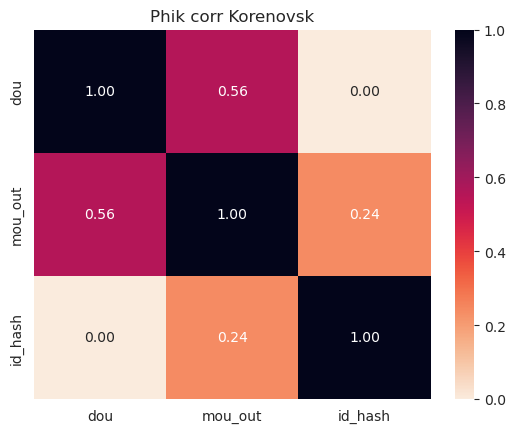

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


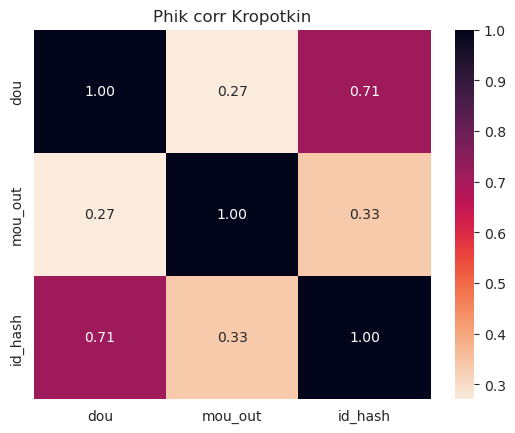

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


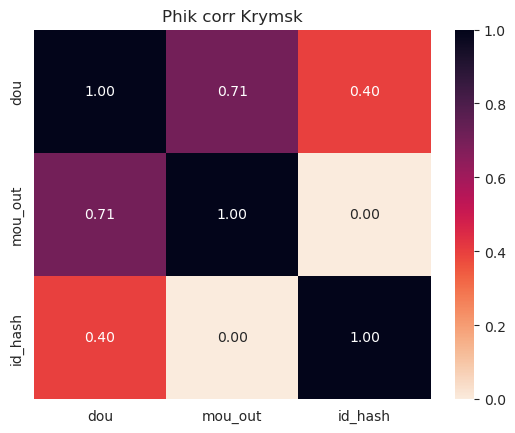

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


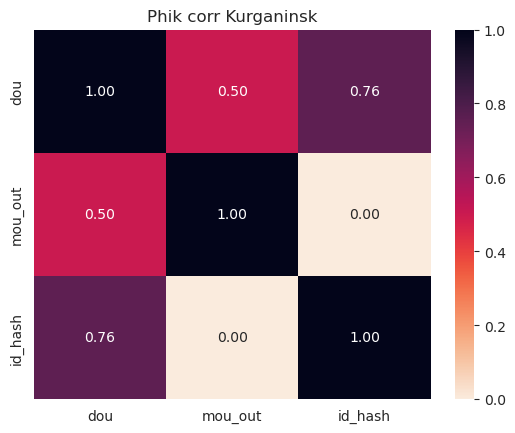

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


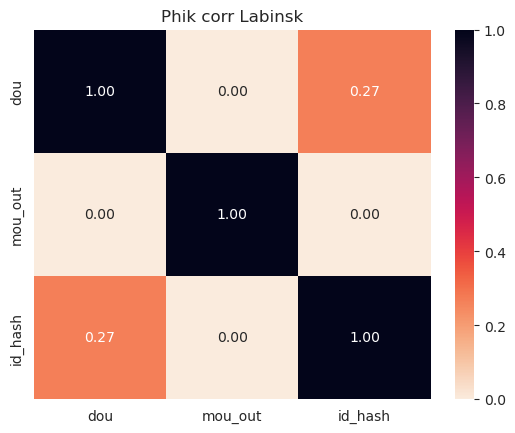

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


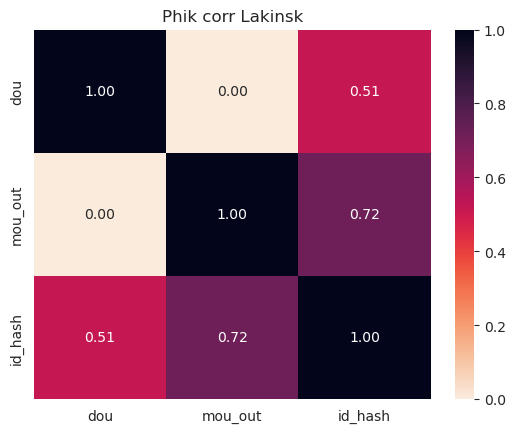

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


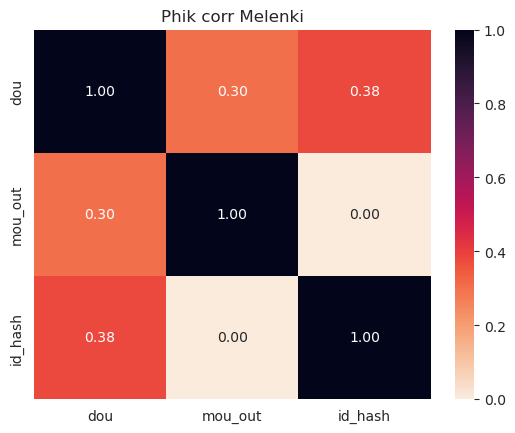

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


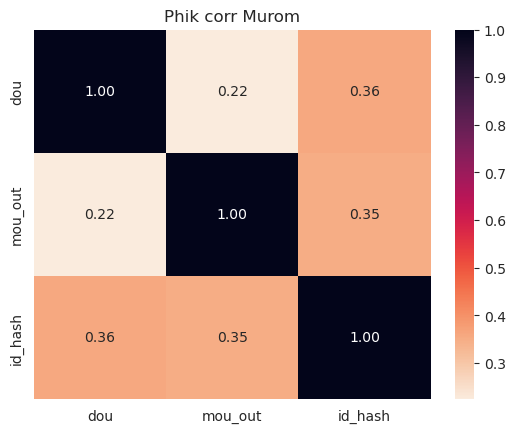

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


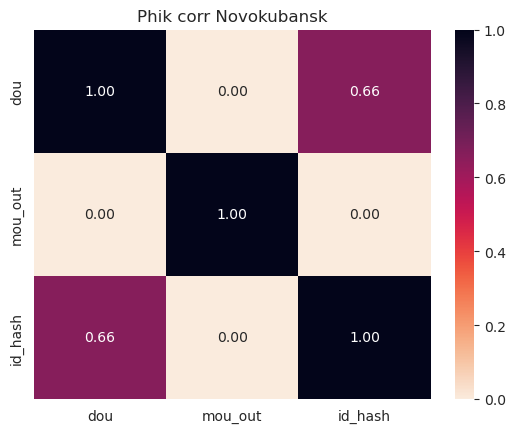

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


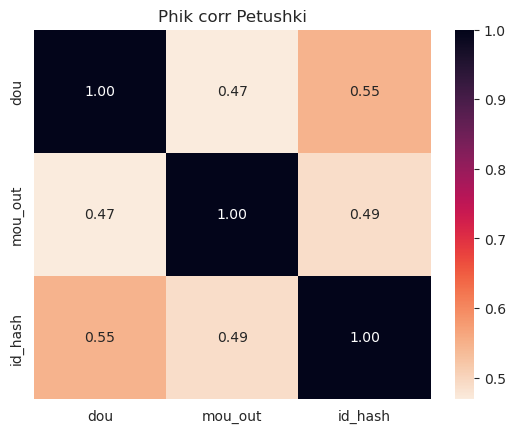

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


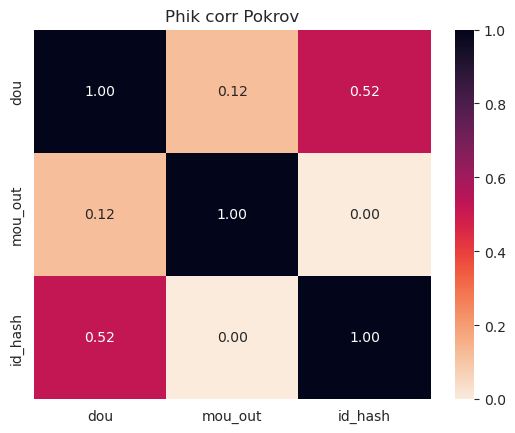

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


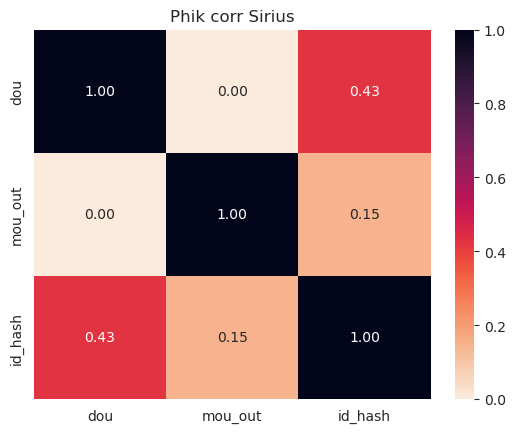

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


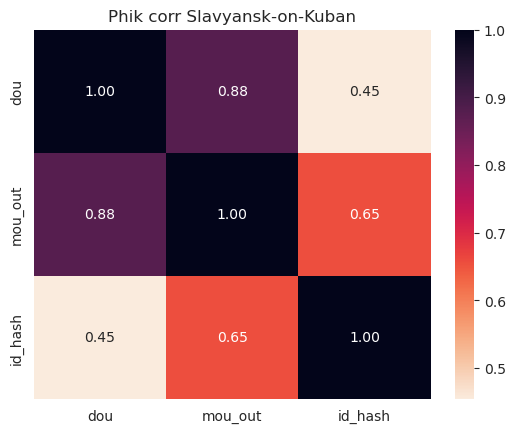

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


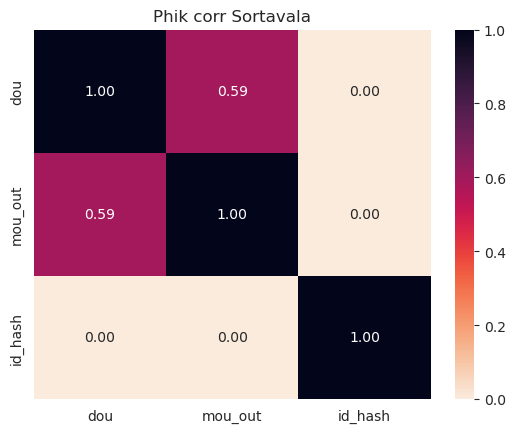

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


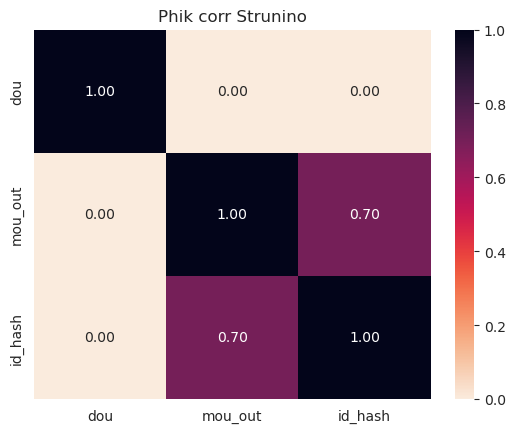

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


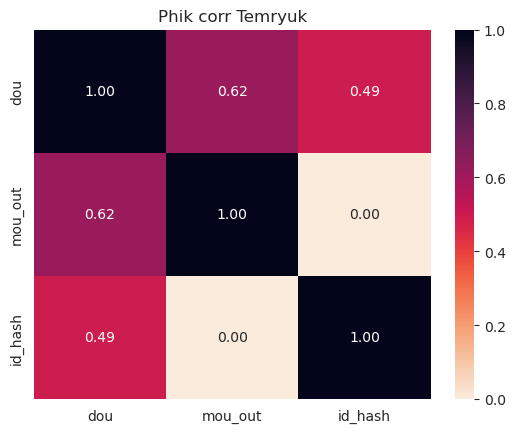

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


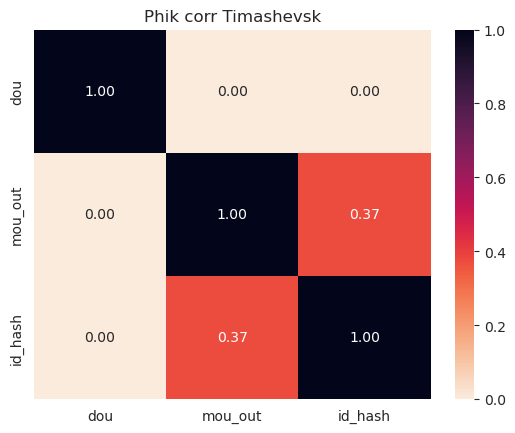

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


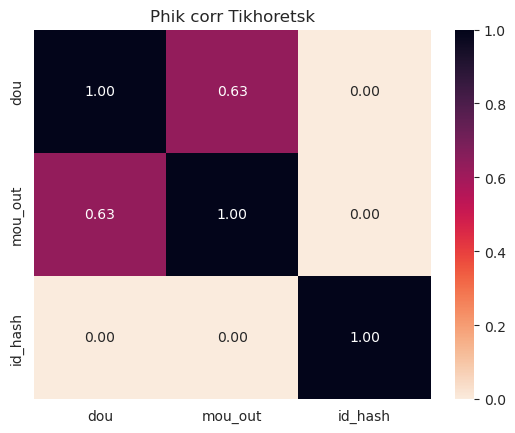

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


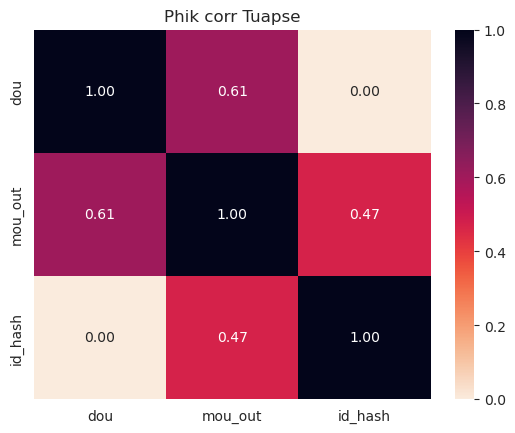

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


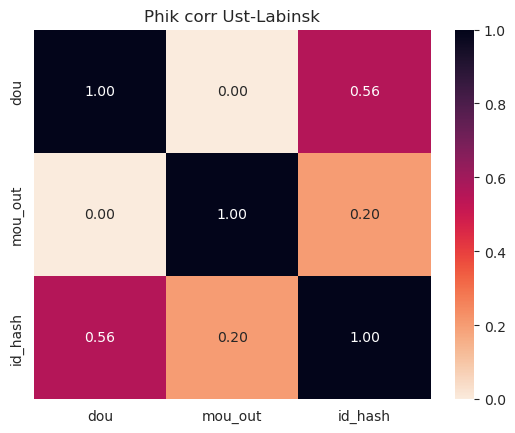

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


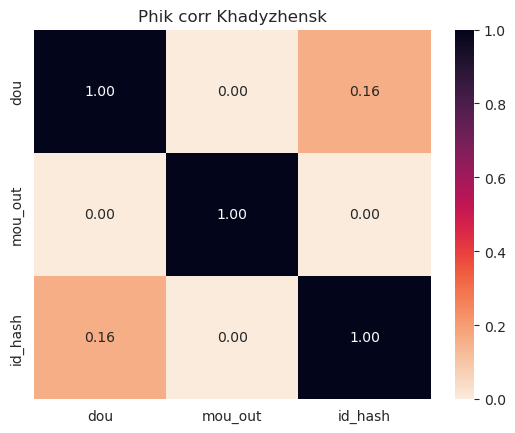

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


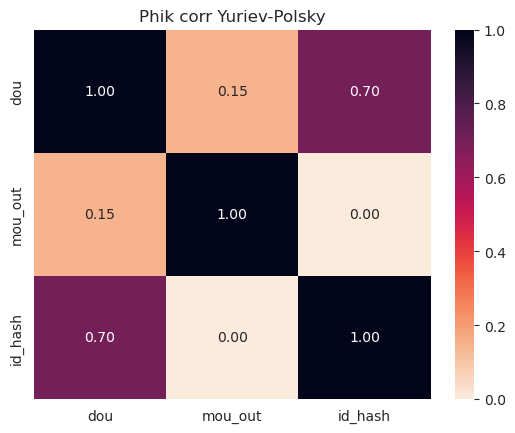

In [121]:
import phik
from phik.report import plot_correlation_matrix

    
def get_mou_mou_out_dou_plots_for_city(df, city): 
    gr_df = df.groupby('snap_date').agg(
        {
        'dou': 'median',
        'mou_out': 'median',
        'id_hash': pd.Series.nunique,
        }
    )
    corr_matrix = gr_df.phik_matrix()
    sns.heatmap(corr_matrix, annot=True, cmap='rocket_r', fmt=".2f").set(title=f'Phik corr {city}')
    plt.show()

    
for city in eng_cities:
    get_mou_mou_out_dou_plots_for_city(globals()[city], city)

# Создадим Обучающую выборку и интерполируем значения дней


Для начала возьмем пользователей, которые были в отпуске от 4 до 30 дней (в отчете артема писалось про 4-22, но можно попробовать разные интервалы)

In [122]:
df_new = df[(df['days'] >= 4) & (df['days'] <= 30)]

In [123]:
X_list = []

agg_funcs = [
    'sum',
    'mean',
    'median',
    'var',
]

for city in eng_cities:
    new_df = globals()[city].groupby('snap_date_datetime').agg(
            {
            'id_hash': pd.Series.nunique,
            'mou': agg_funcs,
            'mou_out': agg_funcs,
            'dou': agg_funcs
            }
        )
    new_df.columns = new_df.columns.droplevel(0)
    new_df.columns = [
        'id_hash',
        'mou_sum',
        'mou_mean',
        'mou_median',
        'mou_var',
        'mou_out_sum',
        'mou_out_mean',
        'mou_out_median',
        'mou_out_var',
        'dou_sum',
        'dou_mean',
        'dou_median',
        'dou_var',
    ]
    new_df.name = f'{city}_prepare'
    X_list.append(new_df)


Сделаем линейную интерполяцию(потом, если не лень можно попробовать СВД, КНН и АЛС)

In [124]:
X_interpolated = []

for df in X_list:
    range_dates_for_inerpolation = pd.date_range(start='2021-01-01', end='2022-12-01')
    test_int = pd.DataFrame(index=range_dates_for_inerpolation)
    test_int_df = pd.merge(test_int, df, how="left", left_index=True, right_index=True)
    df_interpolated = test_int_df.interpolate()
    df_interpolated.name = df.name
    X_interpolated.append(df_interpolated)

Посмотрим на наши ряды

In [125]:
for df in X_interpolated[:5]:
    print(df.shape)

(700, 13)
(700, 13)
(700, 13)
(700, 13)
(700, 13)


Abinsk_prepare


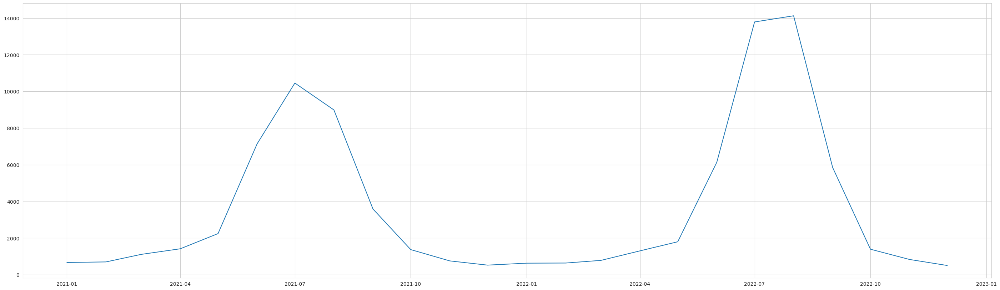

Alexandrov_prepare


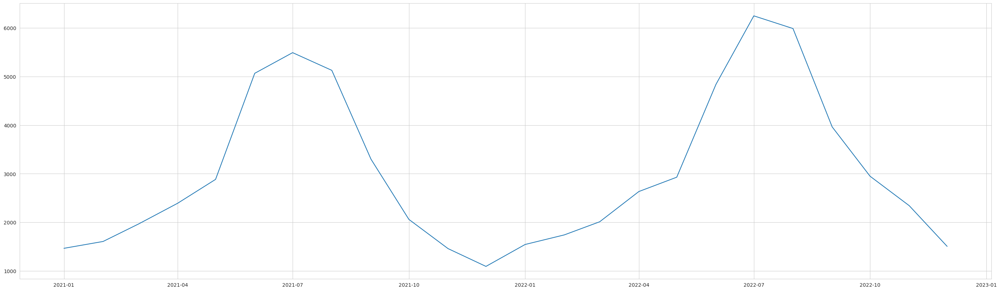

Armavir_prepare


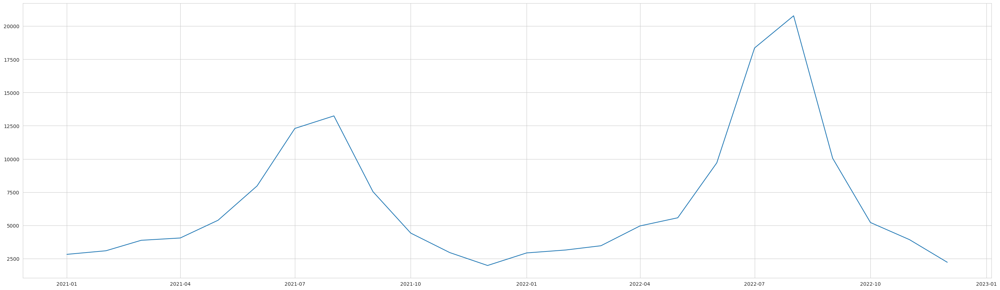

Baikalsk_prepare


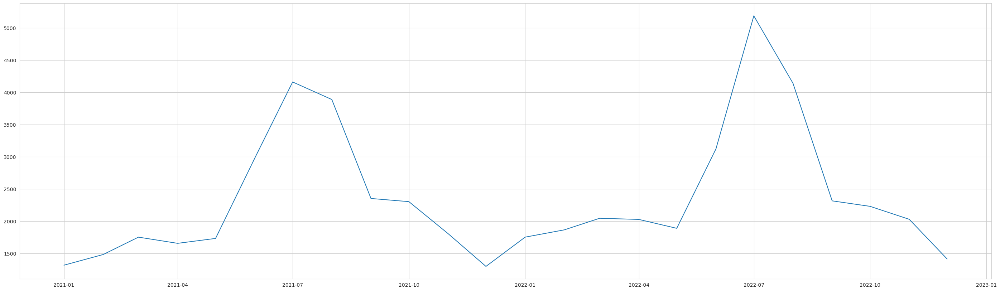

Belorechensk_prepare


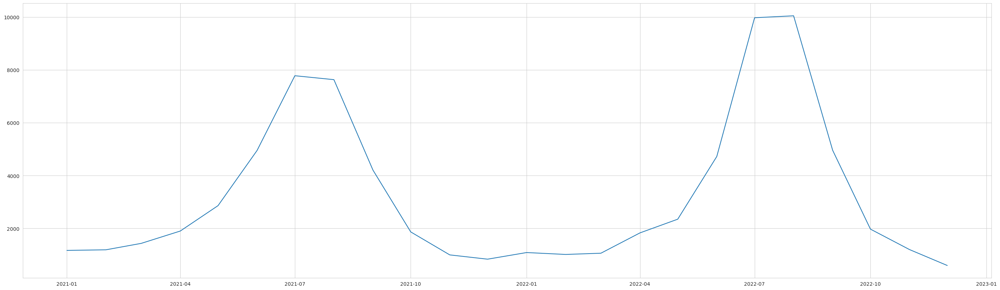

36


In [126]:
for df in X_interpolated[:5]:
    print(df.name)
    figure(figsize=(35, 10), dpi=100)
    plt.plot(df['id_hash'])
    plt.show()
    
print(len(X_interpolated))

In [127]:
!mkdir train

In [128]:
dir_path = '/kaggle/working/train'
for df in X_interpolated:
    df.to_csv(f"{dir_path}_{df.name}.csv")

In [129]:
# pd.read_csv('/kaggle/working/train_Yuriev-Polsky_prepare.csv', index_col="Unnamed: 0")